<a href="https://colab.research.google.com/github/ARoDias/DataMiningProject_CTCT_2024Analysis/blob/main/Data_Analysis_Report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. **Introduction**

# Data Analysis Report

This report answers the following research questions:
1. **RQ1:** How does gender impact course selection among students across different academic years?
2. **RQ2:** What are the interrelationships and correlation strengths between Activity Points (AP), Participation Points (PP), and Self and Peer Assessment Points (SPA) across various academic years?
3. **RQ3:** How does student performance in CTCT discipline vary across editions, student's degree (Course), gender (Sex), weeks, and themes, as measured by average points?
4. **RQ4:** What distinct clusters are evident in student performances based on different types of assessment points?
5. **RQ5:** Can student performance in one theme of the CTCT course predict outcomes in subsequent themes?


# 2. **Data Understanding**

## 2.1. **Importing Libraries**

In [ ]:
# Data Analysis Report.ipynb

# Data Manipulation Libraries
import pandas as pd  # Data manipulation and analysis
import numpy as np  # Numerical operations on large multi-dimensional arrays and matrices

# Visualization Libraries
import seaborn as sns  # Statistical data visualization
import matplotlib.pyplot as plt  # Plotting library for creating static, animated, and interactive visualizations

# Statistical Analysis Libraries
from scipy.stats import shapiro  # Statistical test for normality
from scipy.stats import chi2_contingency, mannwhitneyu  # Chi-squared test and Mann-Whitney U test for statistical analysis

# Machine Learning - Preprocessing and Model Evaluation
from sklearn.feature_selection import VarianceThreshold, mutual_info_classif  # For feature selection via Variance Threshold and Mutual Information
from sklearn.ensemble import RandomForestClassifier  # Ensemble method for classification using multiple decision trees
from sklearn.preprocessing import LabelEncoder  # Converts categorical labels into numerical part
from sklearn.impute import SimpleImputer  # Imputation transformer for completing missing values
from sklearn.linear_model import LinearRegression  # Linear regression model for predictive analysis
from sklearn.cluster import KMeans, AgglomerativeClustering  # Clustering algorithms
from sklearn.model_selection import train_test_split  # Splitting the dataset into training and testing sets
from sklearn.metrics import r2_score  # R-squared score for regression models
from sklearn.linear_model import LogisticRegression  # Logistic regression model for classification
from sklearn.metrics import confusion_matrix, classification_report  # Evaluation metrics for classification

# Hierarchical Clustering Performance Enhancement
!pip install fastcluster  # Optional: Hierarchical clustering performance enhancement
import fastcluster  # Provides a faster implementation of hierarchical clustering methods
import scipy.cluster.hierarchy as sch  # Additional hierarchical clustering methods from SciPy

# Integration with Google Colaboratory
from google.colab import files  # Allows file upload and download in Google Colab environment

# Statistical Modeling Libraries
import statsmodels.api as sm  # Comprehensive library for statistical models
from statsmodels.formula.api import ols  # Interface for specifying statistical models using R-like formula

# Document Generation
!pip install python-docx  # Install python-docx for creating and updating Microsoft Word (.docx) files
from docx import Document  # Library for creating and updating Microsoft Word (.docx) files

# Date and Time Utilities
from datetime import datetime  # Utilities for date and time manipulation

# Data Serialization
import pickle  # Pickle module for serializing and deserializing Python object structures
import os  # Provides a way of using operating system dependent functionality like reading or writing to the file system
import shutil  # High-level file operations like copying and removal
from io import StringIO  # In-memory file-like object for text I/O


In [ ]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score


In [ ]:
# Import custom functions from data_analysis_functions.py
from data_analysis_functions import *

## 2.2. **Load Files**

In [ ]:
# Load Files

# Initialize a Word document to capture output
doc = Document()
doc.add_heading('Output of Data Analysis Report Notebook', 0)

# Ensure Charts directory exists
if not os.path.exists('Charts'):
    os.makedirs('Charts')

# Load datasets and other files
dataset_years = [2016, 2017, 2018, 2019, 2022, 2023, 2024]
datasets = {}

for year in dataset_years:
    file_path = f'dataset_{year}.feather'
    datasets[year] = pd.read_feather(file_path)

activities = pd.read_feather('activities.feather')
activities2 = pd.read_feather('activities2.feather')
summary = pd.read_feather('summary.feather')

# Load additional lists and parameters
with open('all_lists.pkl', 'rb') as file:
    all_lists = pickle.load(file)
with open('dataset_params.pkl', 'rb') as file:
    dataset_params = pickle.load(file)

print("Datasets and other files loaded successfully.")


Datasets and other files loaded successfully.


In [ ]:
doc.add_heading('Basic Analysis', 1)

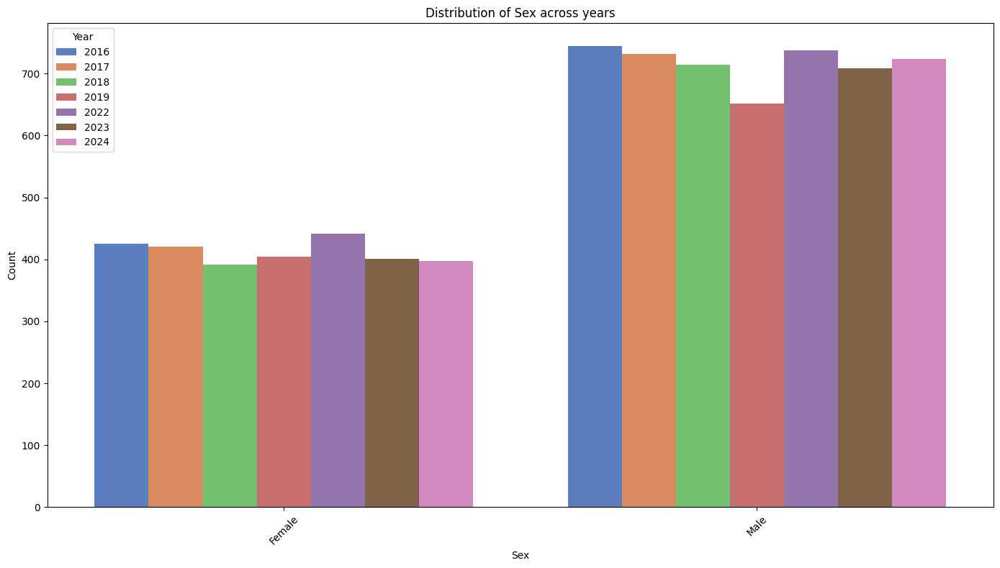

In [ ]:
# Apply the label replacement
for year in datasets.keys():
    datasets[year] = replace_sex_labels(datasets[year])

plot_categorical_attribute_distribution(datasets, 'Sex')

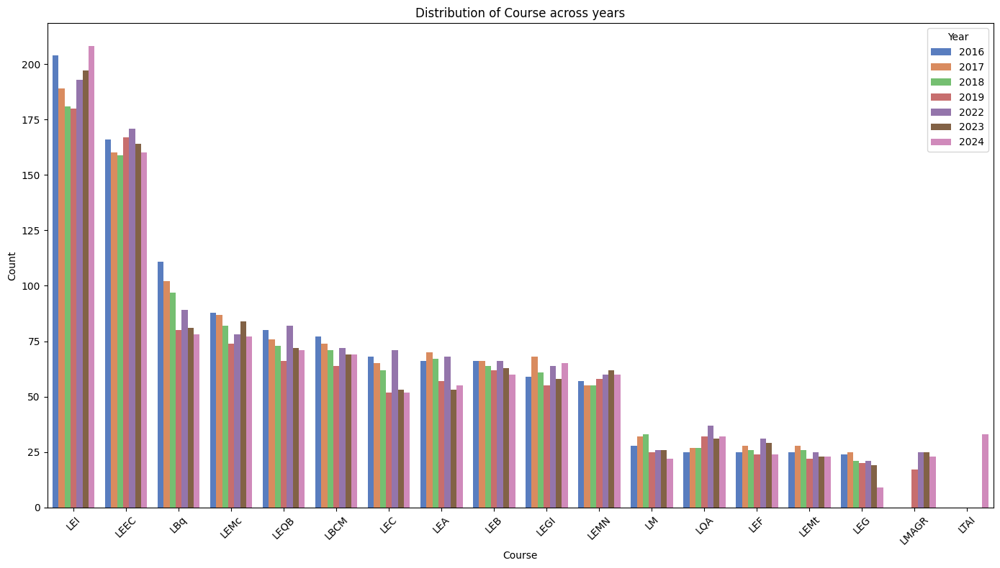

In [ ]:
# Plot Categorical Attribute Distribution
plot_categorical_attribute_distribution(datasets, 'Course')

## 2.3 **Answer Research Questions (RQs)**

In [ ]:
doc.add_heading('RQ1: How does gender impact course selection among students across different academic years?', 1)

### **RQ1:** How does gender impact course selection among students across different academic years?


In [ ]:
# Perform Chi-Squared Test
categorical_vars = ['Sex', 'Course']
for year, dataset in datasets.items():
    print(f"\nYear: {year}")
    chi_squared_test(dataset, 'Sex', 'Course')


Year: 2016
Chi-squared test between Sex and Course:
Chi-squared statistic: 285.2980566583418
Degrees of freedom: 15
P-value: 6.295539436948036e-52


Year: 2017
Chi-squared test between Sex and Course:
Chi-squared statistic: 285.69476490432635
Degrees of freedom: 15
P-value: 5.2093440226763155e-52


Year: 2018
Chi-squared test between Sex and Course:
Chi-squared statistic: 231.97132543516096
Degrees of freedom: 15
P-value: 6.30054243533737e-41


Year: 2019
Chi-squared test between Sex and Course:
Chi-squared statistic: 258.03744783949116
Degrees of freedom: 16
P-value: 1.158895740915364e-45


Year: 2022
Chi-squared test between Sex and Course:
Chi-squared statistic: 322.7039990503845
Degrees of freedom: 16
P-value: 4.975572842991223e-59


Year: 2023
Chi-squared test between Sex and Course:
Chi-squared statistic: 274.994798031553
Degrees of freedom: 16
P-value: 3.7478839421607635e-49


Year: 2024
Chi-squared test between Sex and Course:
Chi-squared statistic: 262.617625451859
Degrees of

In [ ]:
doc.add_heading('RQ2: What are the interrelationships and correlation strengths between Activity Points (AP), Participation Points (PP), and Self and Peer Assessment Points (SPA) across various academic years? And how does this assessment points correlate to the discipline Final Grade?', 1)

### **RQ2:** What are the interrelationships and correlation strengths between Activity Points (AP), Participation Points (PP), and Self and Peer Assessment Points (SPA) across various academic years? And how does this assessment points correlate to the discipline Final Grade?


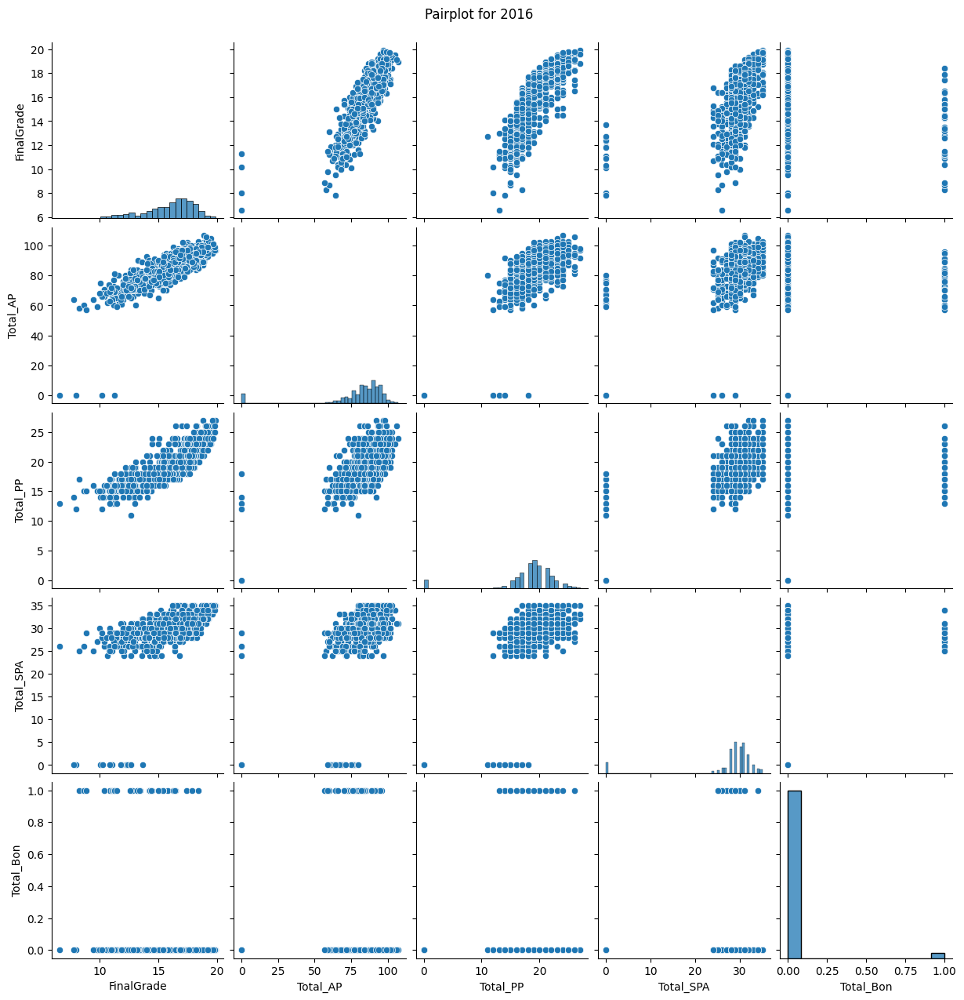

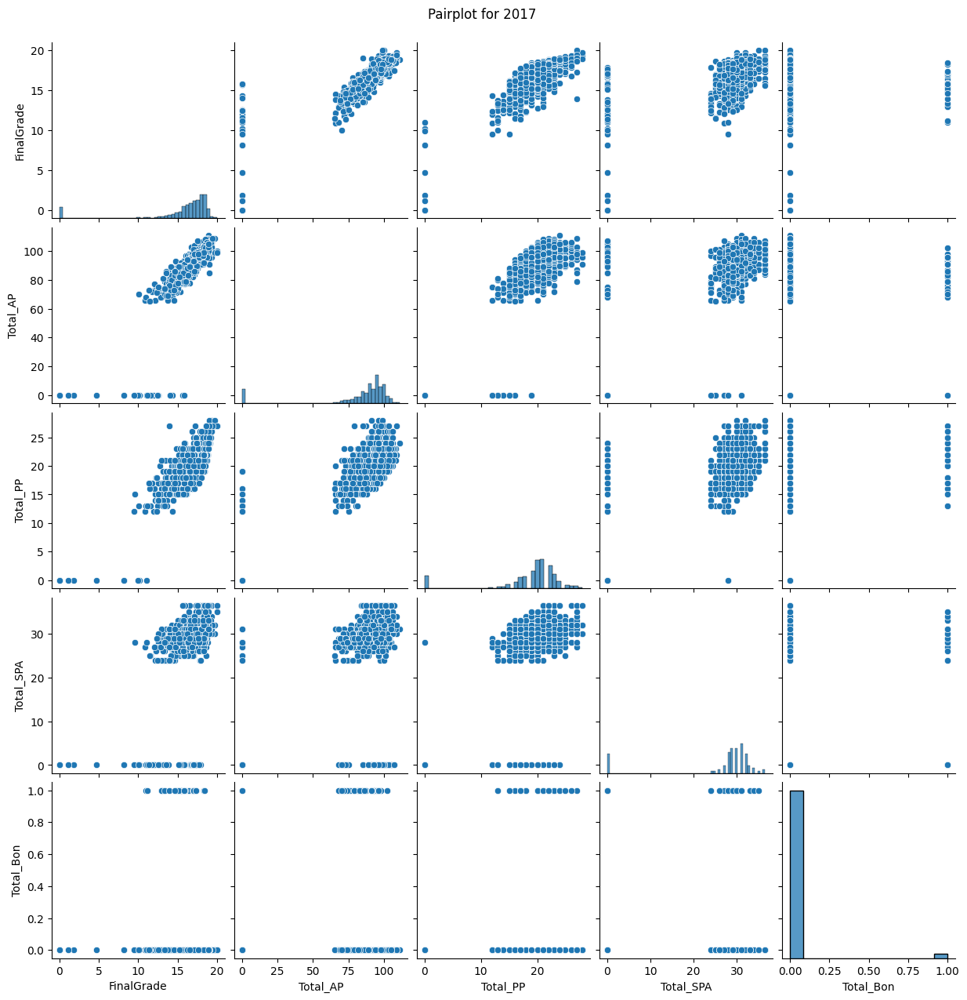

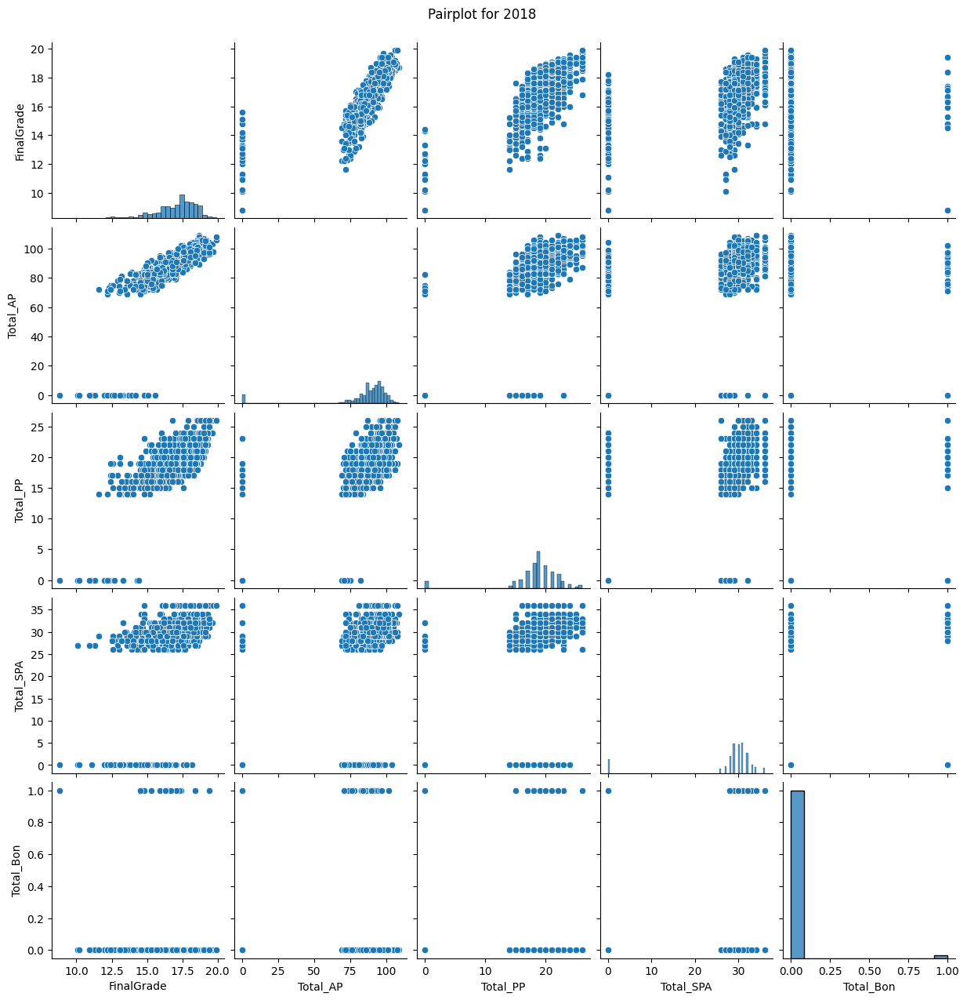

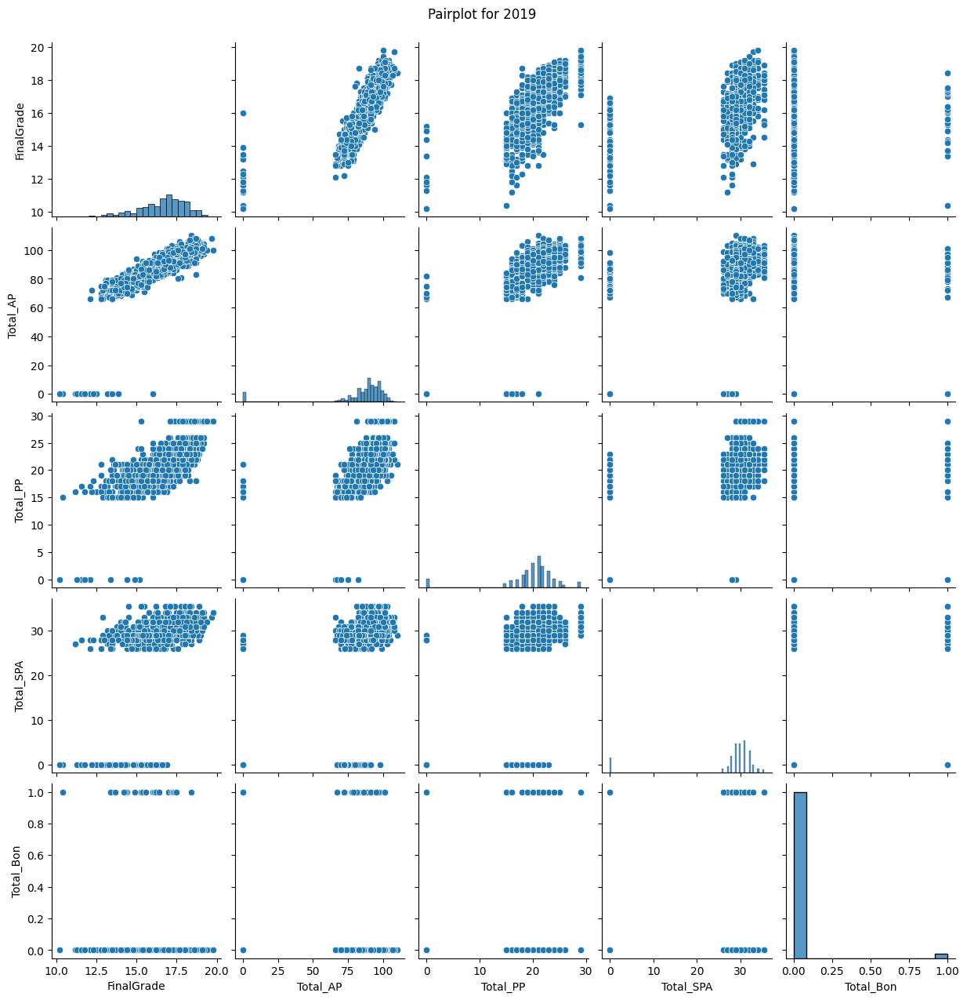

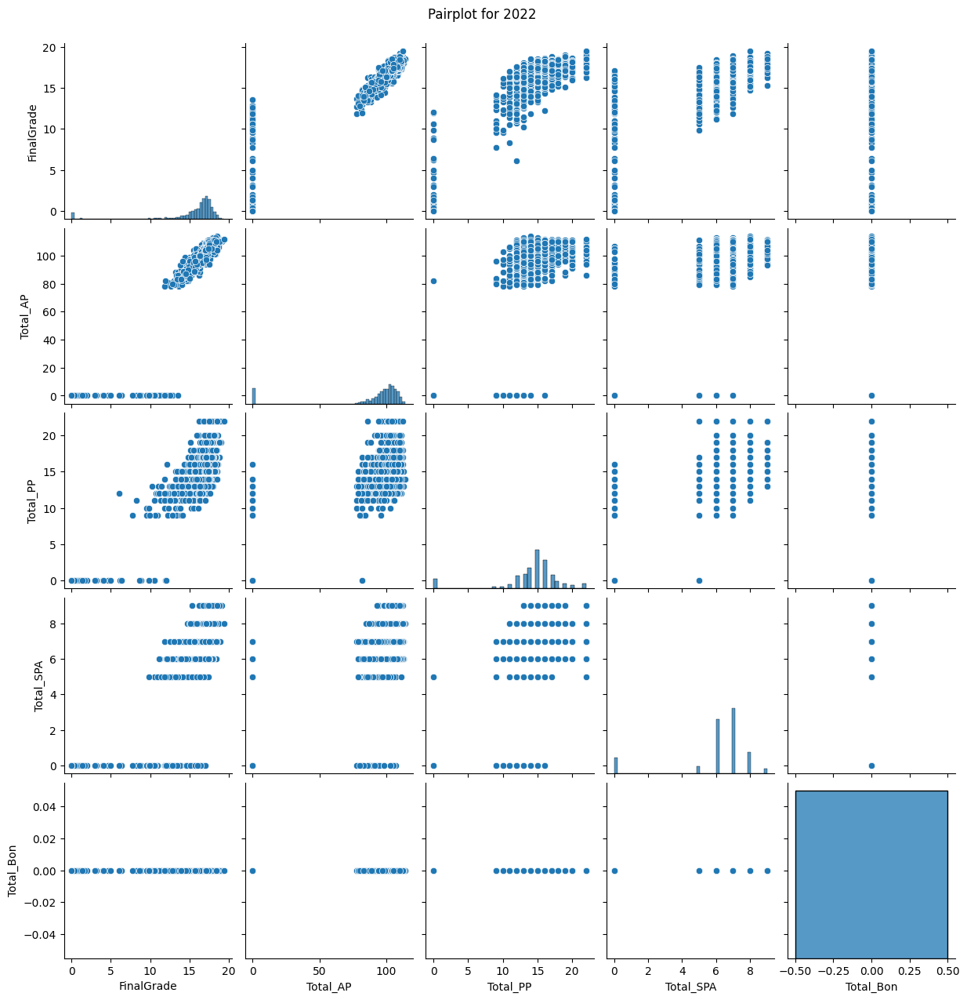

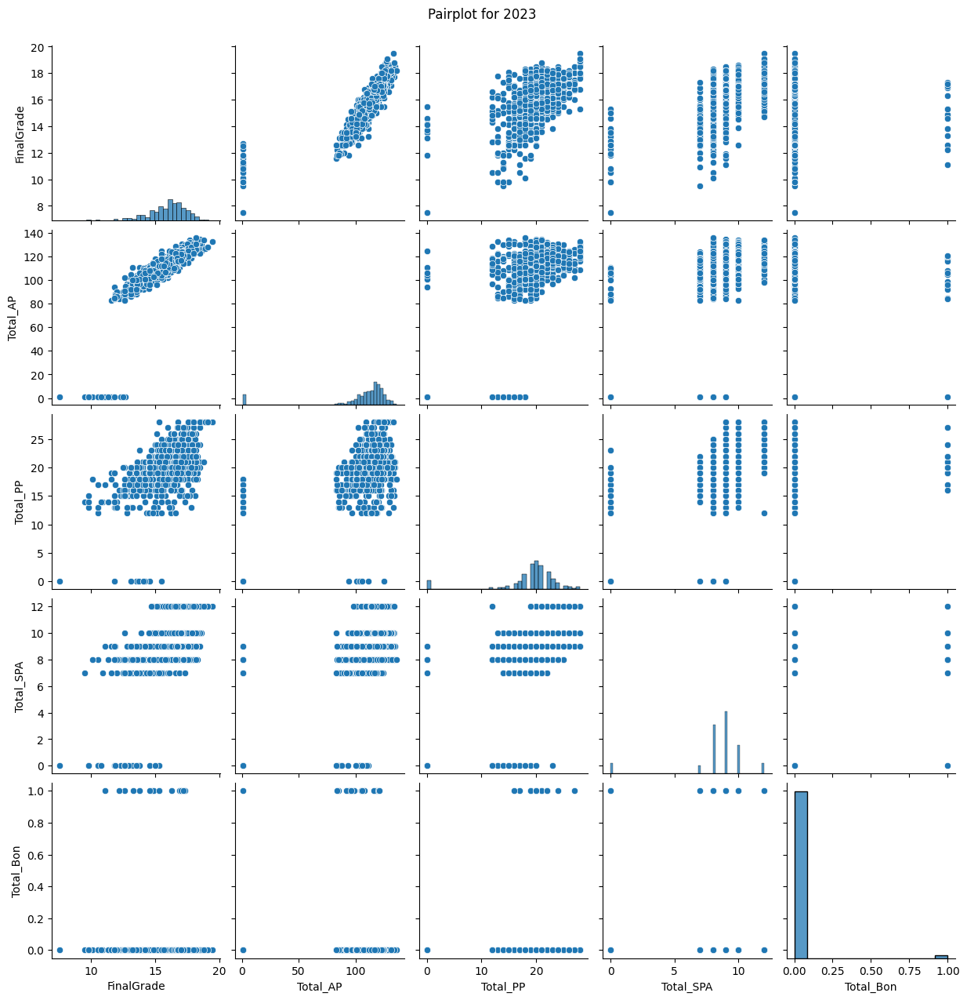

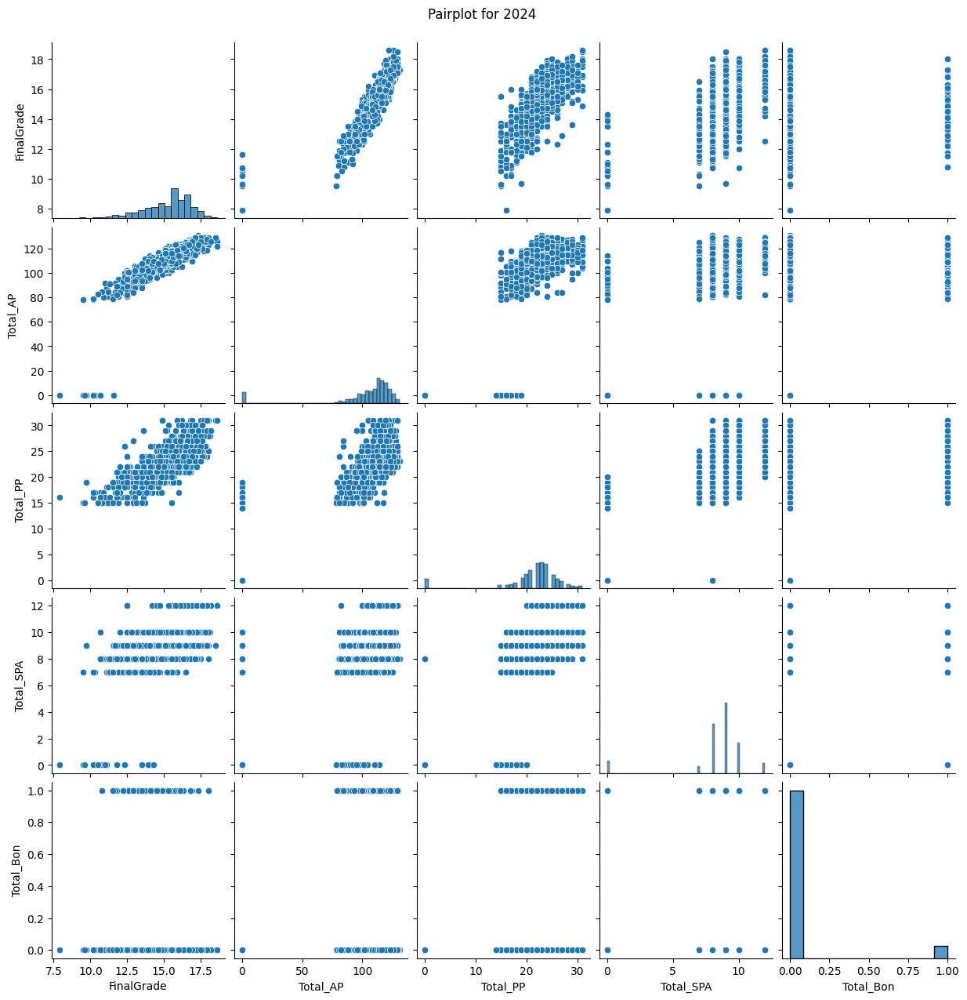

In [ ]:
for year, dataset in datasets.items():
    multivariate_analysis(dataset, year)

In [ ]:
#doc.add_heading('Correlation Matrices', 3)

In [ ]:
# Correlation Analysis
for year in dataset_years:
    correlation_analysis_with_relevant_columns(datasets[year], year, doc=doc)

In [ ]:
doc.add_heading('RQ3: ow does student performance in CTCT discipline vary across editions, students degree (Course), gender (Sex), weeks, and themes, as measured by average points?', 1)

### **RQ3:** How does student performance in CTCT discipline vary across editions, student's degree (Course), gender (Sex), weeks, and themes, as measured by average points?


#### FinalGrade Boxplots by Sex and Course

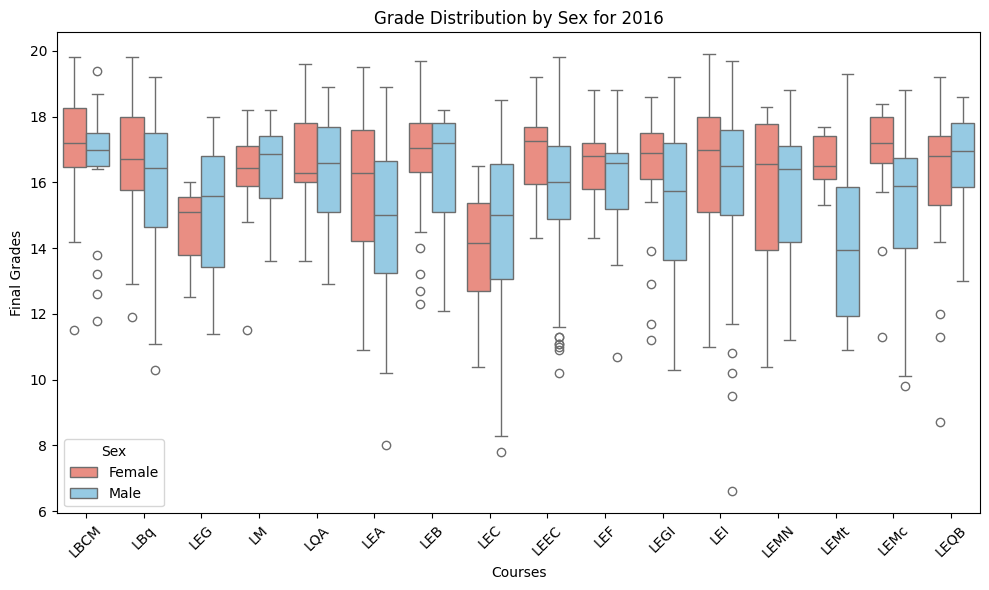

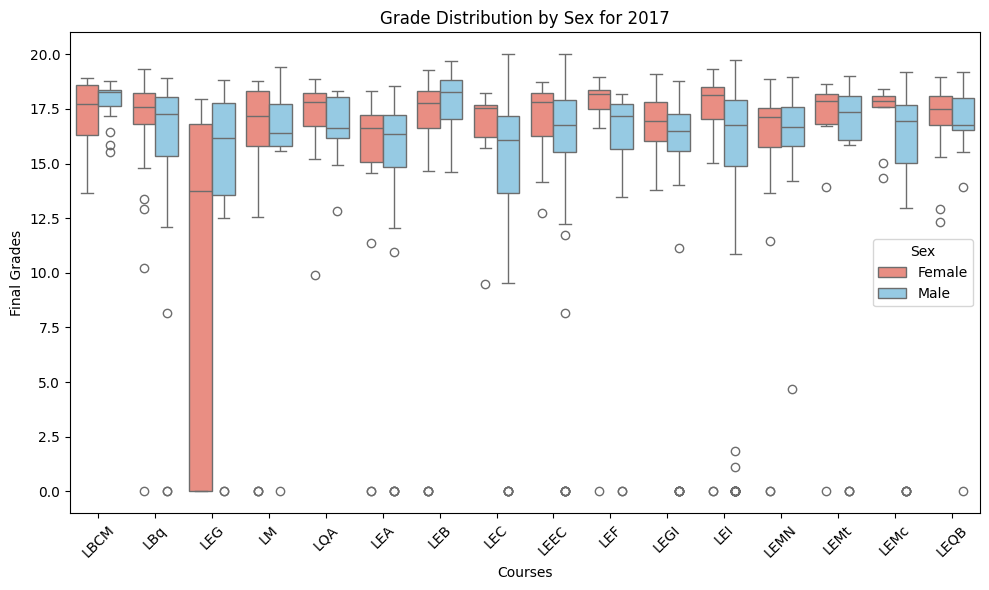

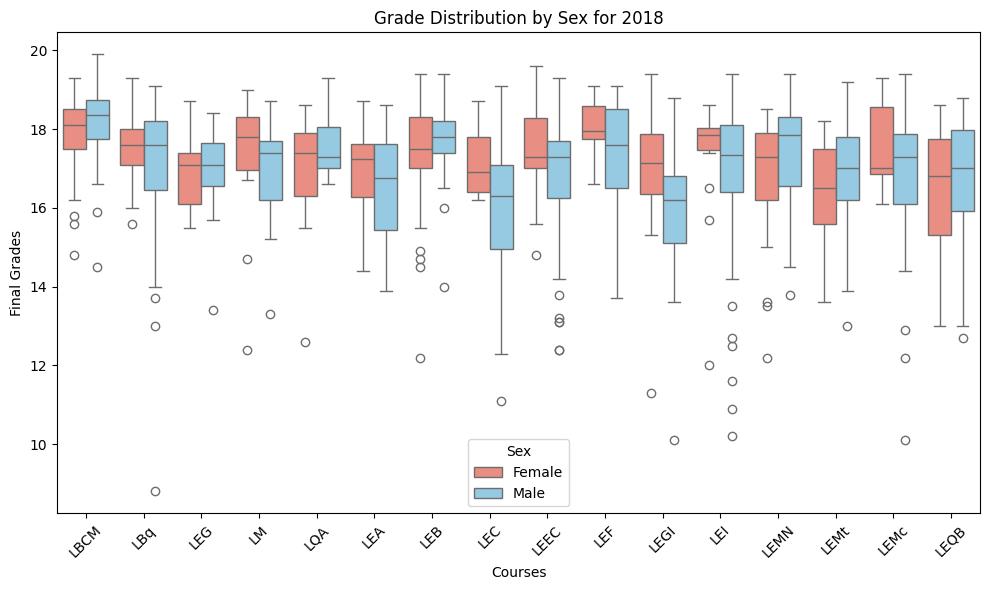

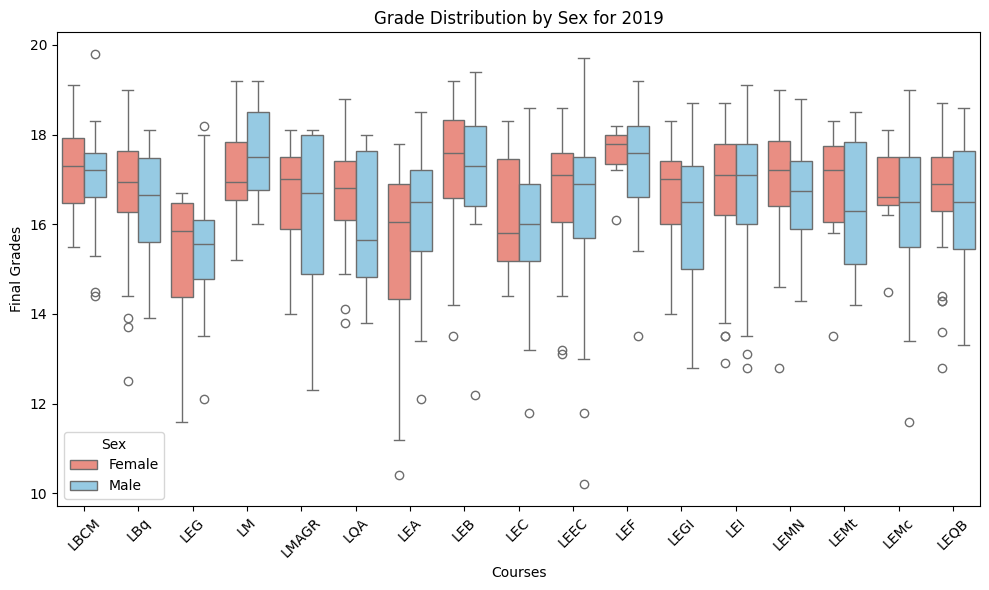

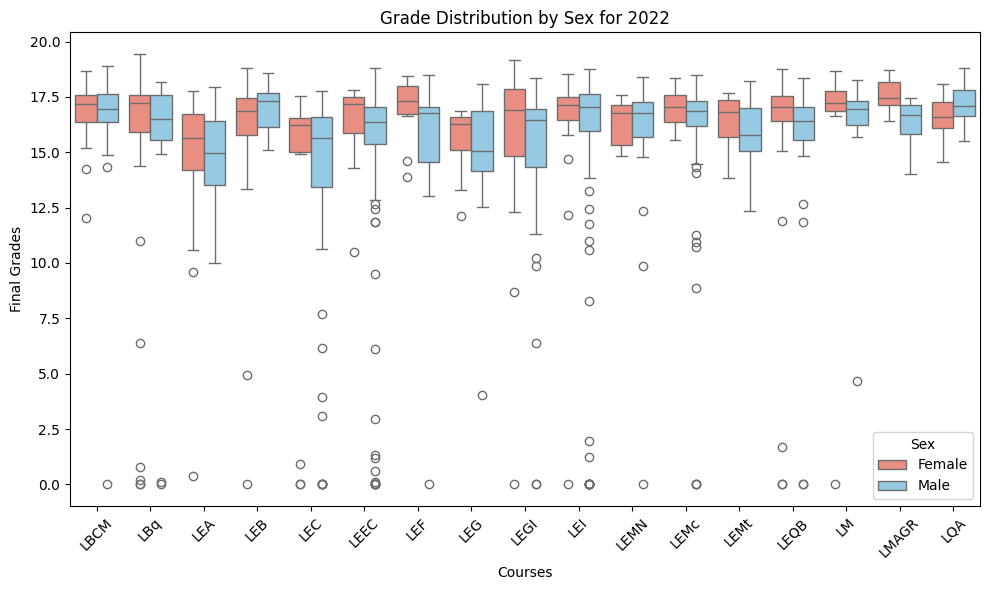

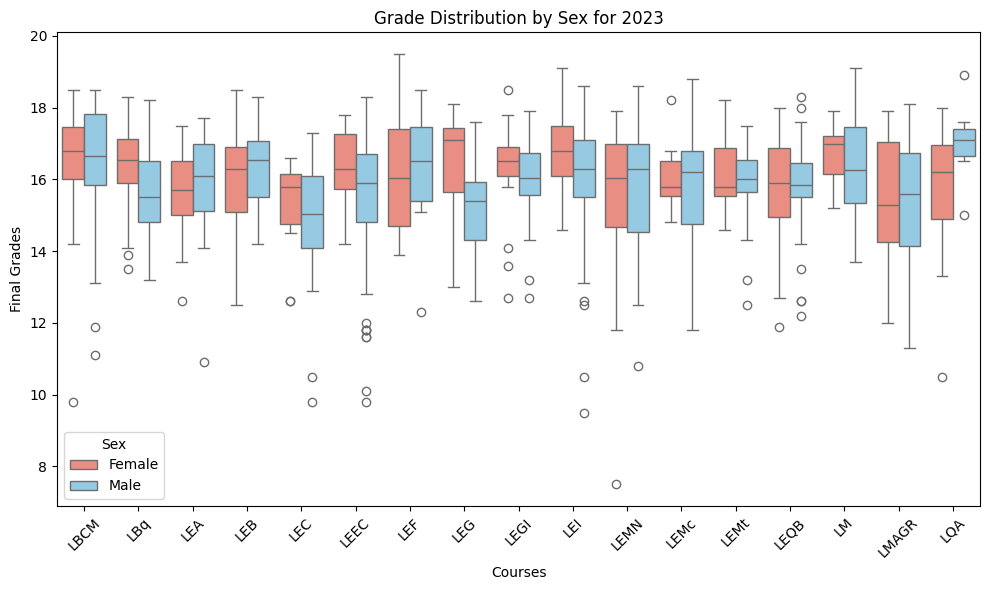

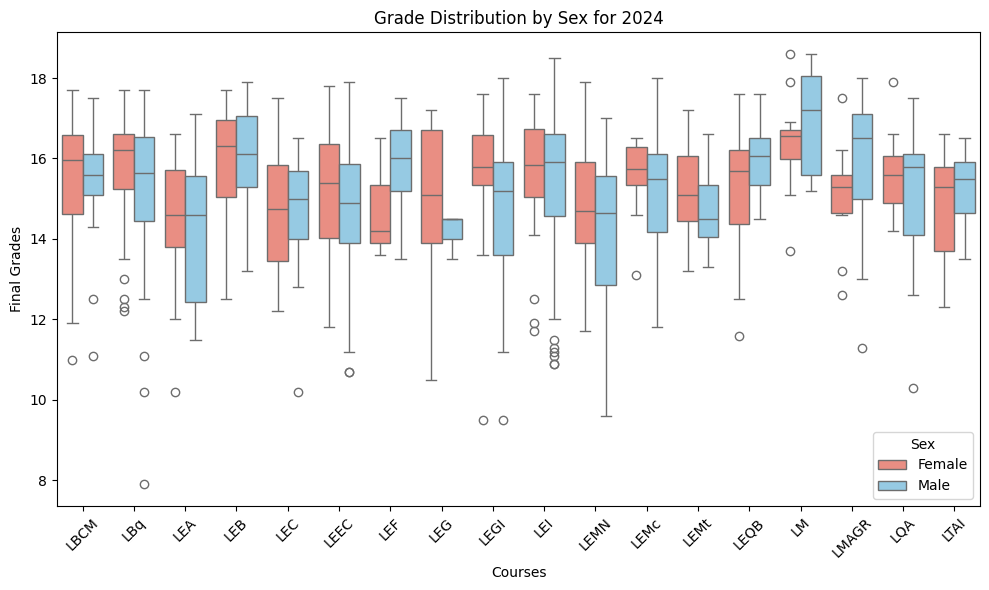

In [ ]:
# Performance Analysis by Sex and Course
for year in dataset_years:
    plot_grade_distribution(datasets[year], year)

In [ ]:
doc.add_heading('Total (AP, PP, SPA and FinalGrade) Points per Course', 3)

#### Total (AP, PP, SPA and FinalGrade) Points per Course

In [ ]:
# Average Points per Course
average_points_per_course(datasets)

Year 2016 - Points per course:
         Total_AP                           Total_PP                        \
             mean   min    max        std       mean   min   max       std   
Course                                                                       
LBCM    86.415584   0.0  106.0  16.438362  19.428571   0.0  26.0  4.024362   
LBq     80.756757   0.0  103.0  22.524821  18.594595   0.0  27.0  5.578169   
LEG     77.666667   0.0   94.0  18.688910  18.083333   0.0  26.0  4.799607   
LM      79.857143   0.0   99.0  24.079674  18.000000   0.0  22.0  5.429685   
LQA     87.720000  73.0  102.0   8.172719  19.680000  16.0  24.0  2.286190   
LEA     78.515152   0.0   99.0  19.241975  18.136364   0.0  25.0  4.165375   
LEB     85.121212   0.0  107.0  20.102442  19.000000   0.0  26.0  4.781374   
LEC     77.500000   0.0  101.0  19.001571  17.397059   0.0  23.0  4.512469   
LEEC    81.951807   0.0  101.0  19.192425  18.415663   0.0  26.0  4.069338   
LEF     81.600000   0.0   97.0  1

In [ ]:
doc.add_heading('RQ4: What distinct clusters are evident in student performances based on different types of assessment points?', 1)

### **RQ4:** What distinct clusters are evident in student performances based on different types of assessment points?


###### clustering_analysis(df, features, year, save_path='Charts/Clustering')

In [ ]:
doc.add_heading('Totals and Totals per Week', 3)

#### Totals and Totals per Week

Clustering Analysis for 2016


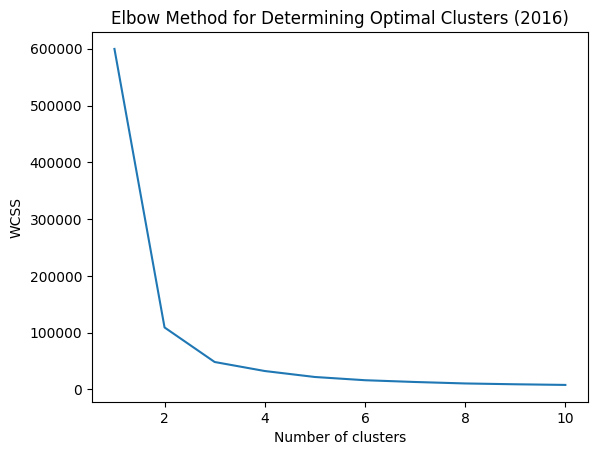

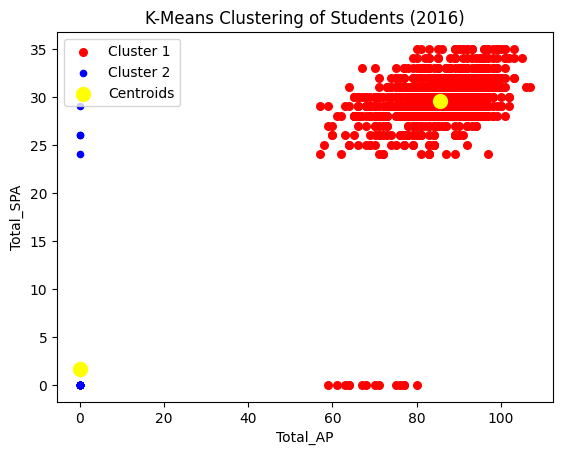

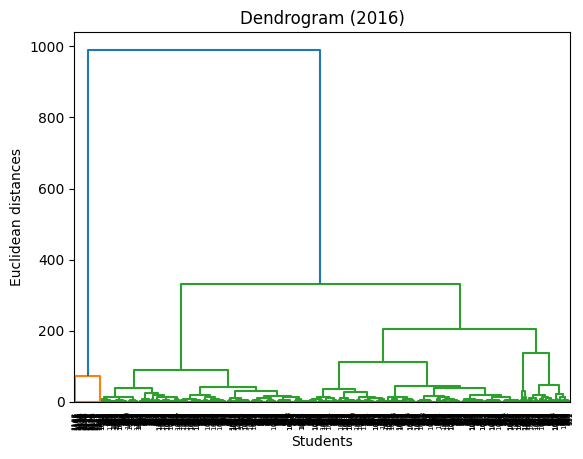

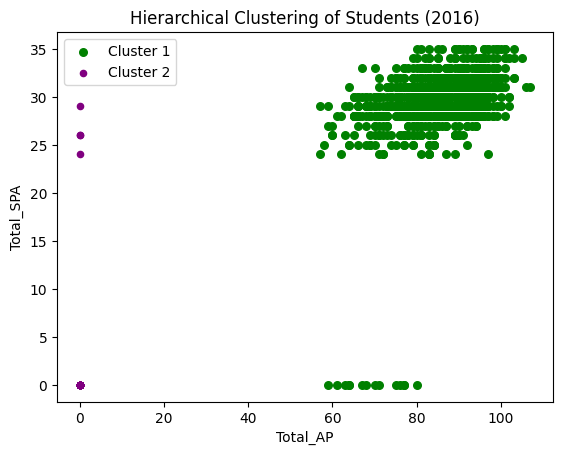

Clustering Analysis for 2017


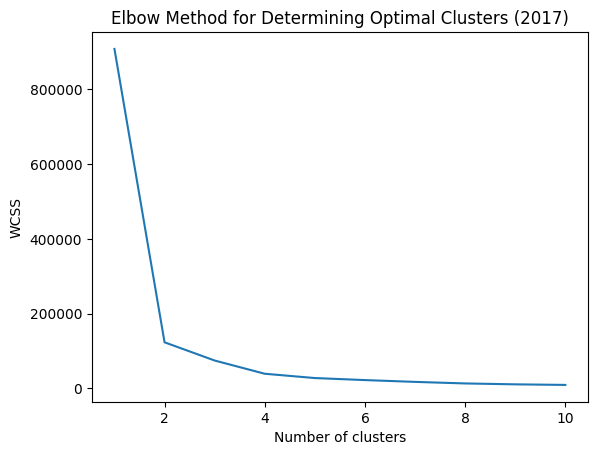

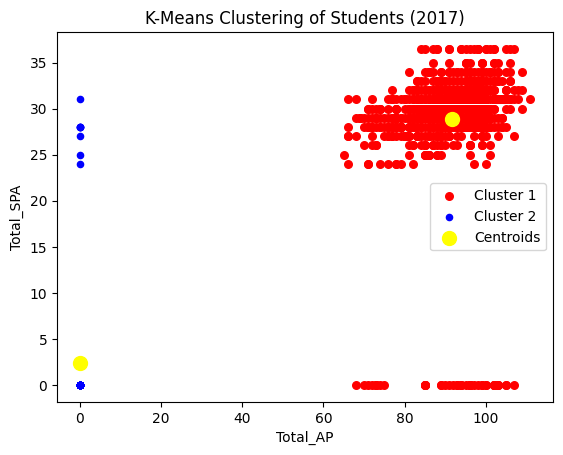

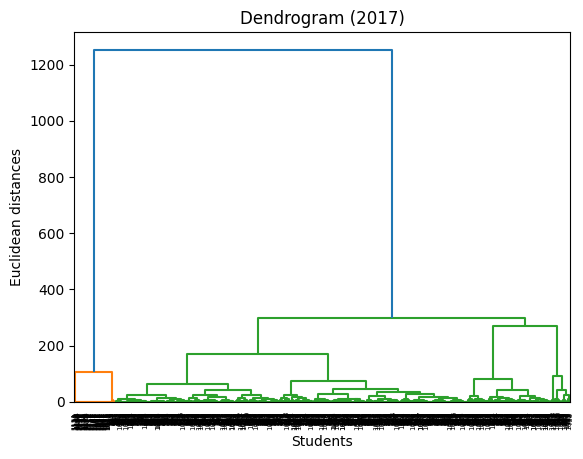

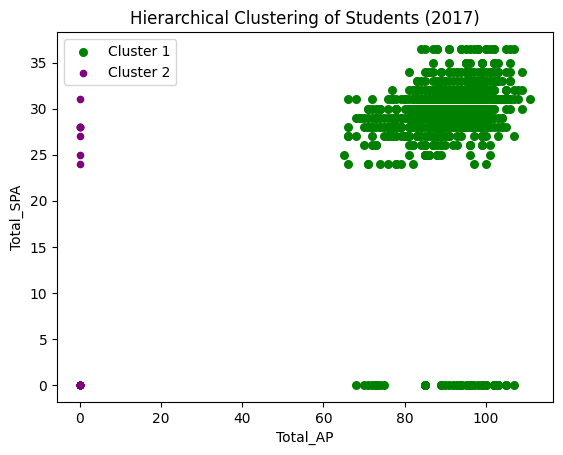

Clustering Analysis for 2018


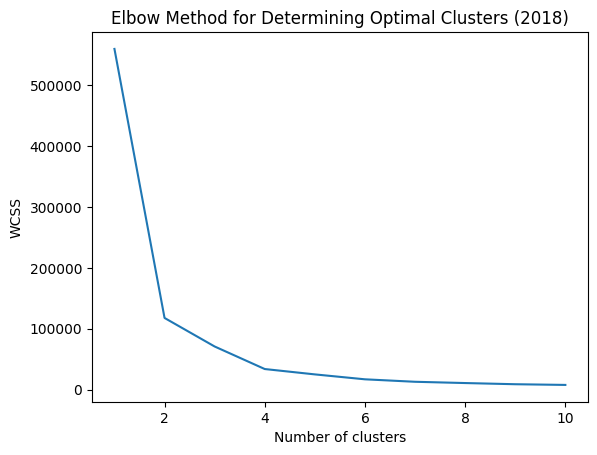

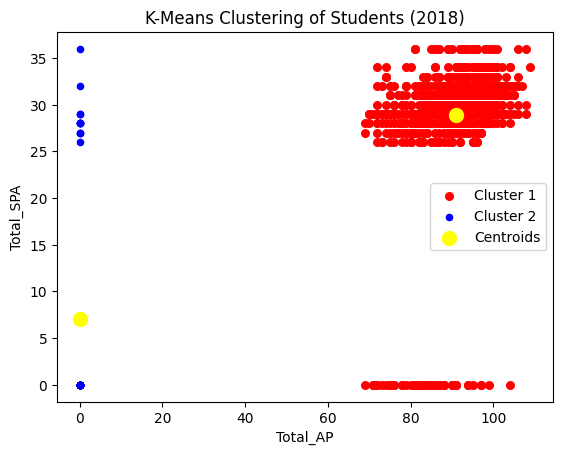

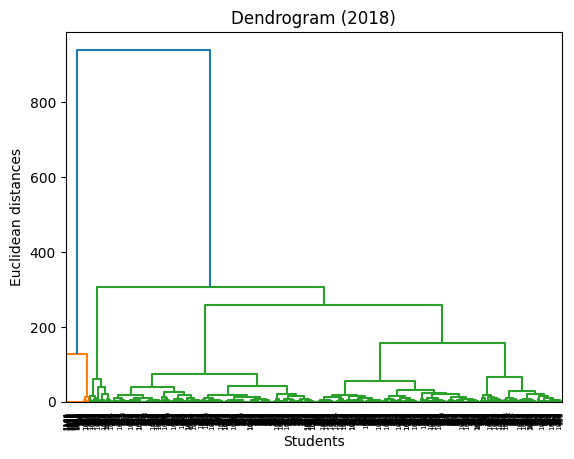

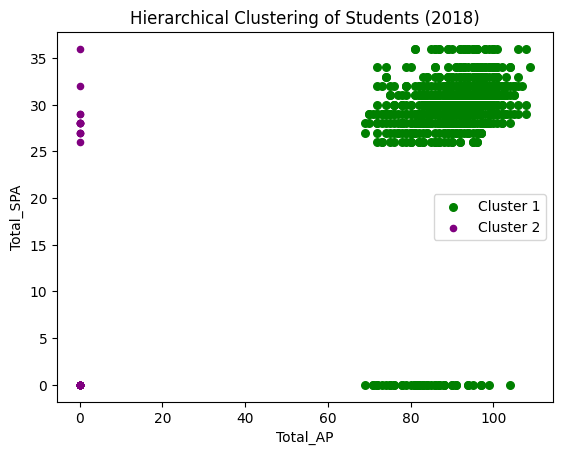

Clustering Analysis for 2019


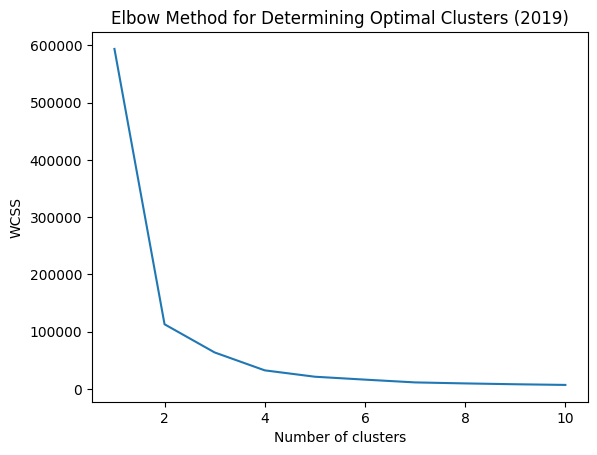

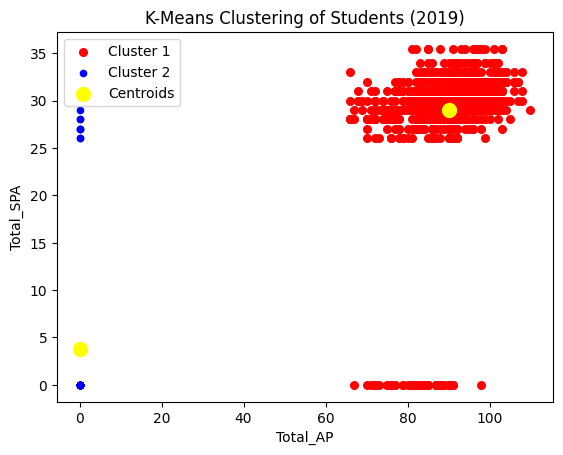

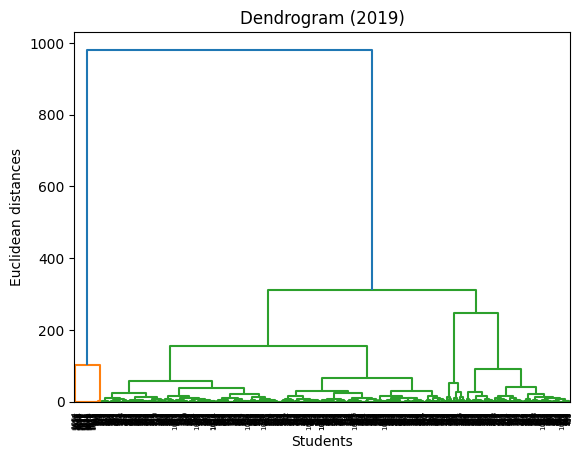

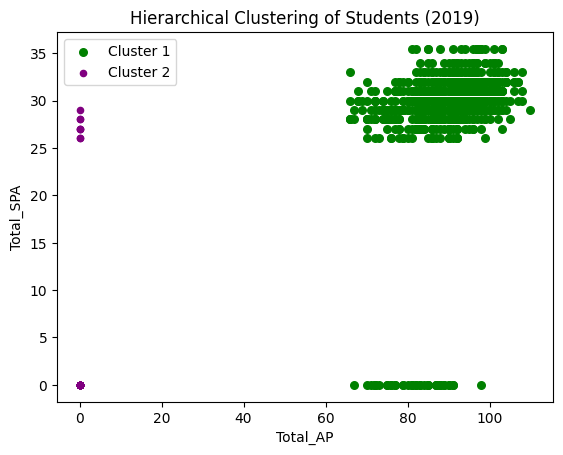

Clustering Analysis for 2022


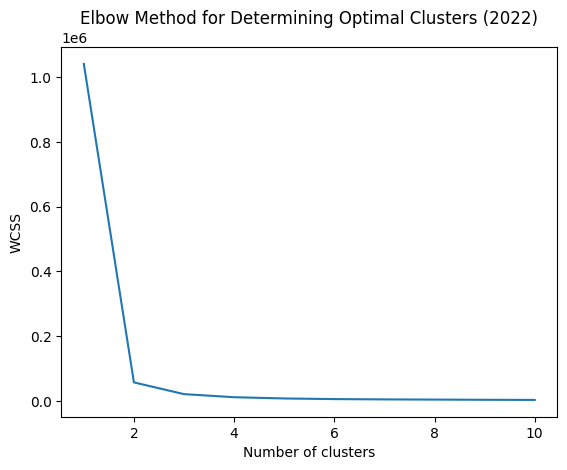

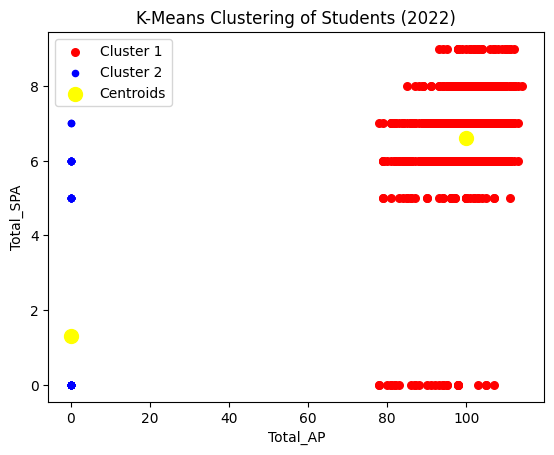

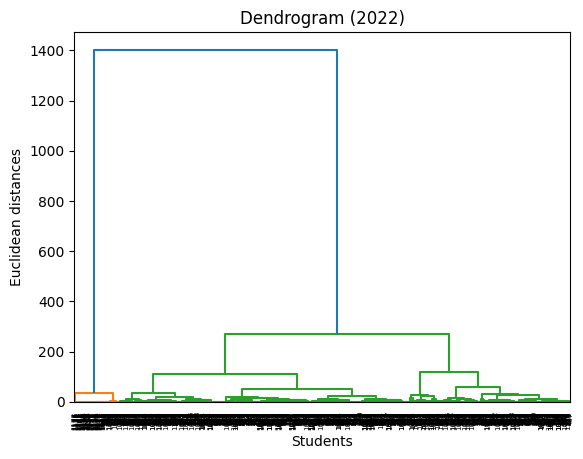

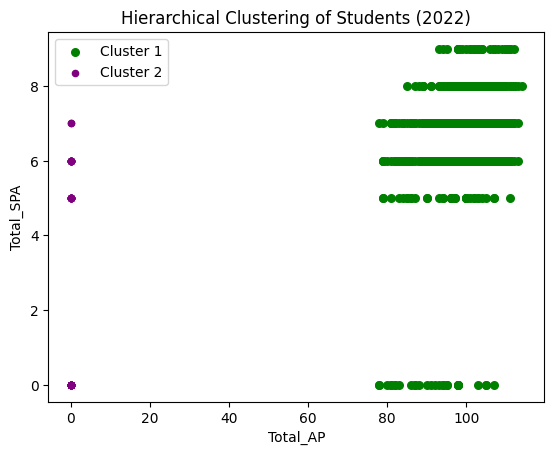

Clustering Analysis for 2023


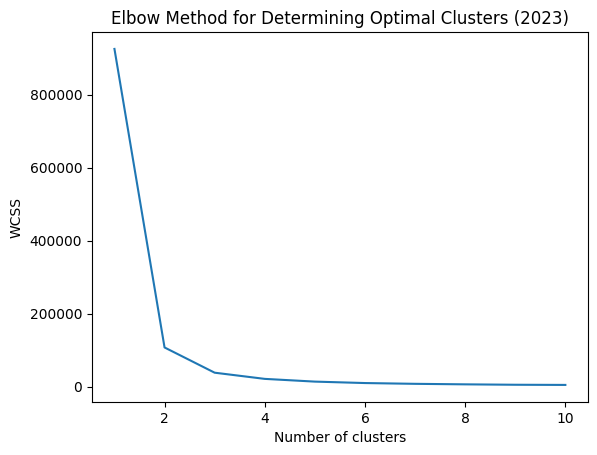

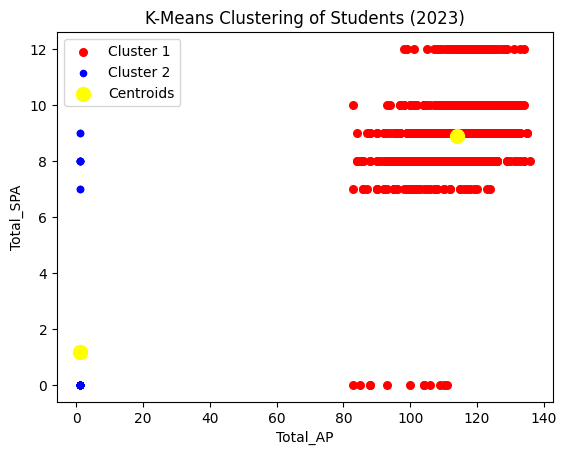

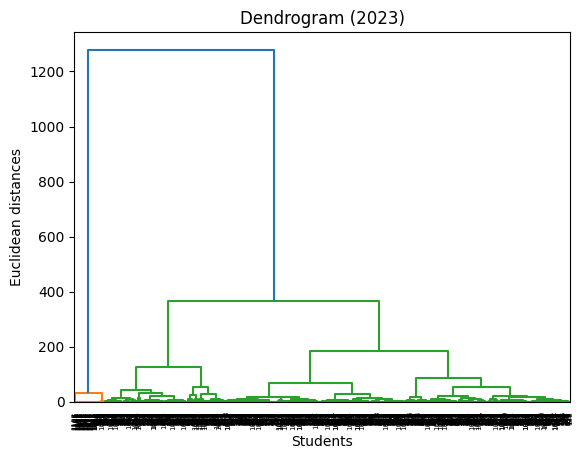

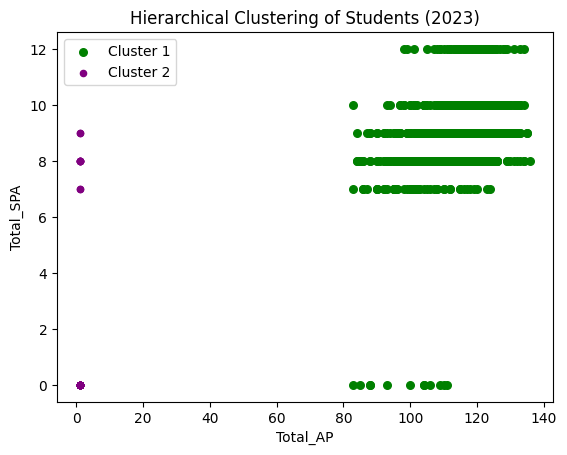

Clustering Analysis for 2024


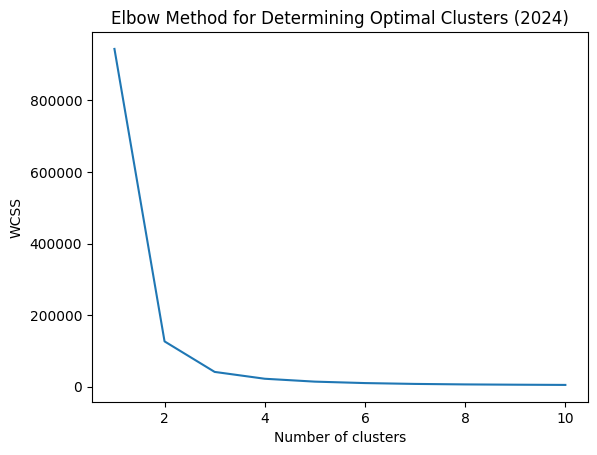

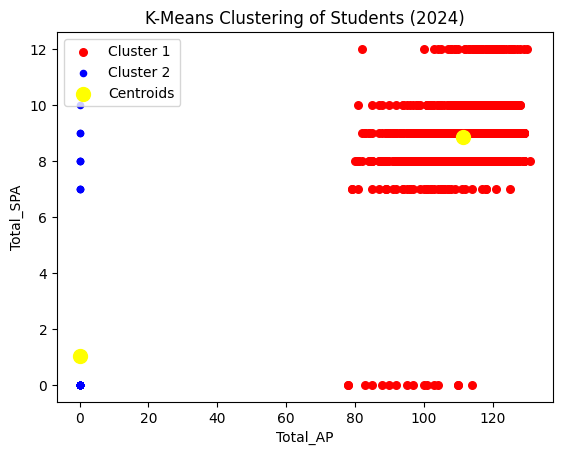

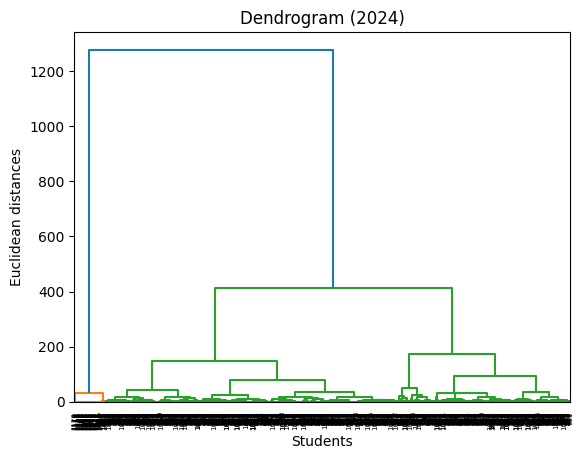

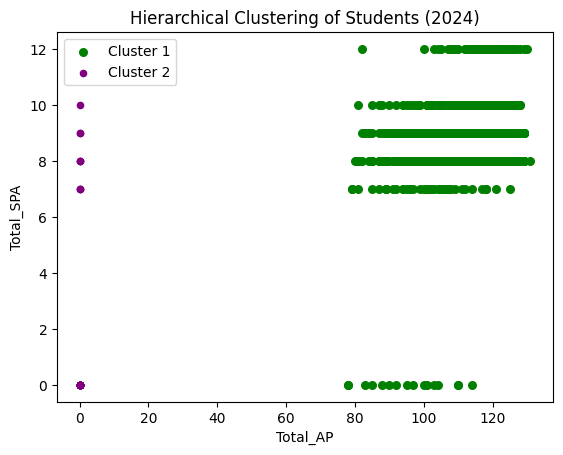

In [ ]:
dataset_years = datasets.keys()  # List of years you have data for

for year in dataset_years:
    print(f"Clustering Analysis for {year}")

    # Print the column names for the dataset of the current year
    #print(datasets[year].columns)

    # Define the features based on the available AP and PP data
    clustering_features = [
        'Total_AP', 'Total_SPA'
    ]

    # Ensure all required columns are in the DataFrame
    if all(feature in datasets[year].columns for feature in clustering_features):
        # Adjust the feature list to include only those available in the dataset
        available_features = [feature for feature in clustering_features if feature in datasets[year].columns]
        clustering_analysis(datasets[year], available_features, year)
    else:
        print(f"Skipping year {year}: Required columns not found in dataset.")

Clustering Analysis for 2016


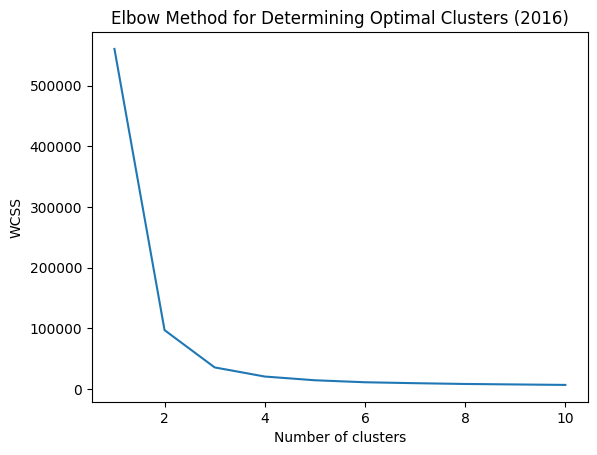

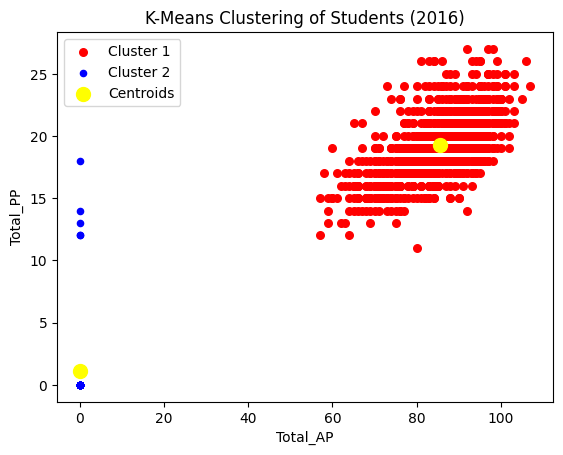

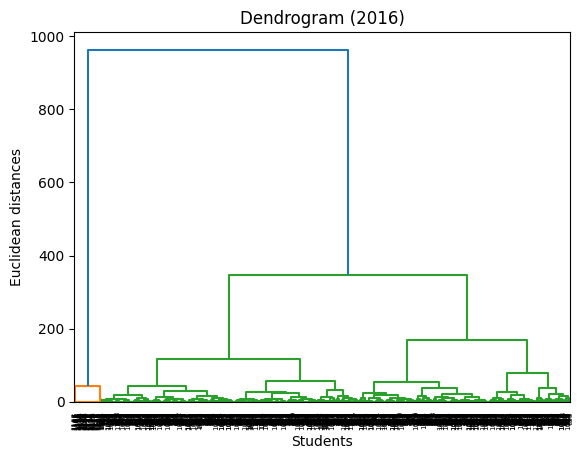

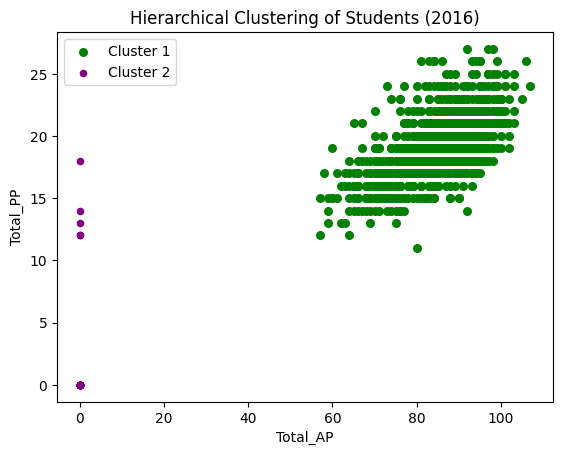

Clustering Analysis for 2017


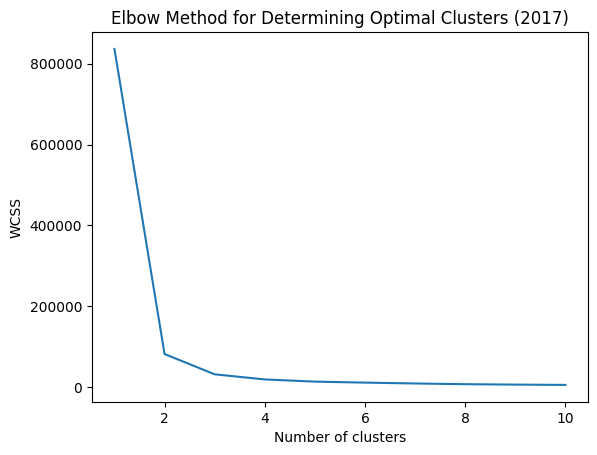

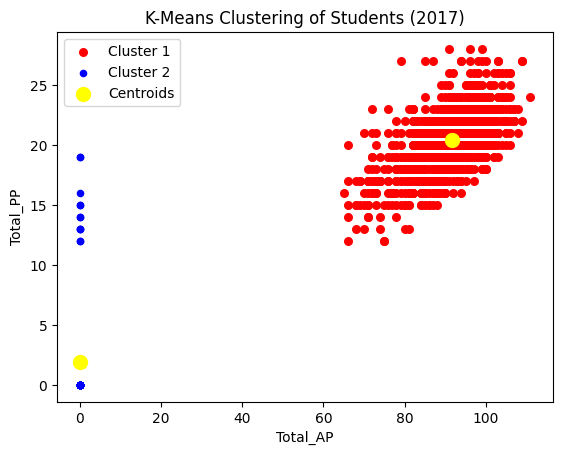

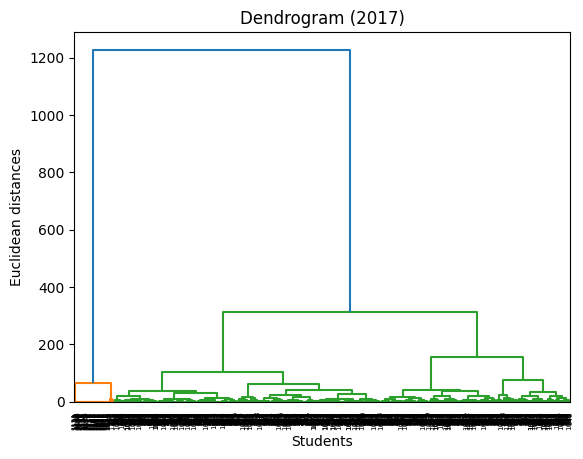

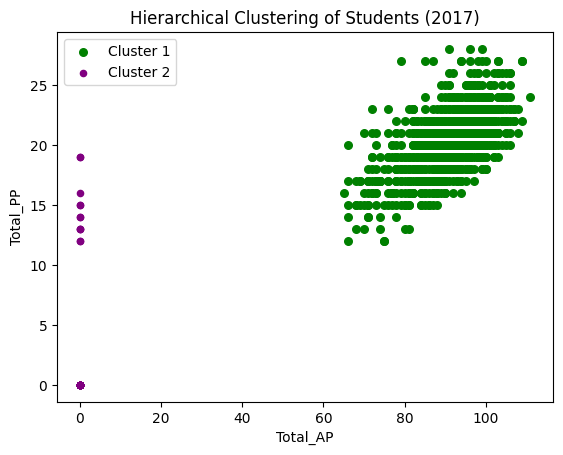

Clustering Analysis for 2018


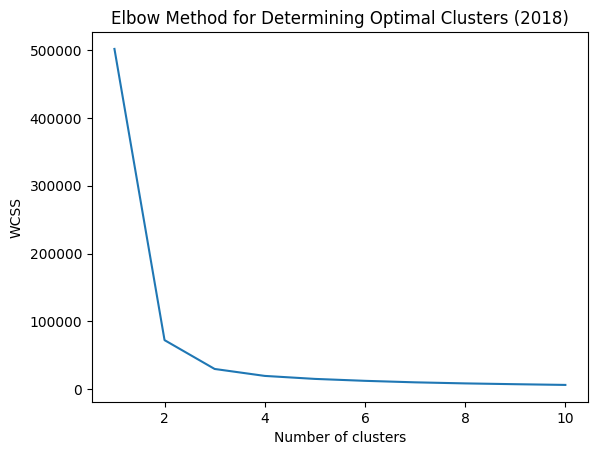

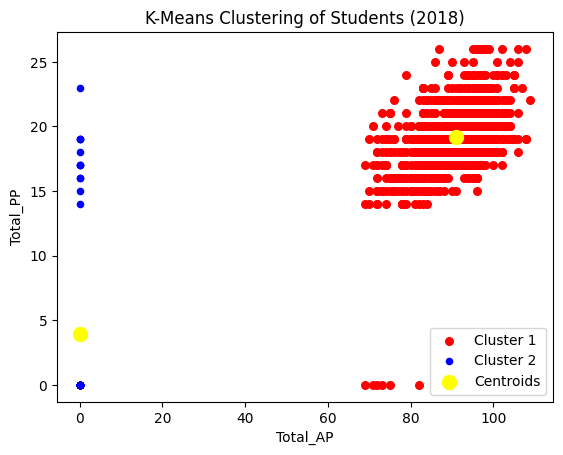

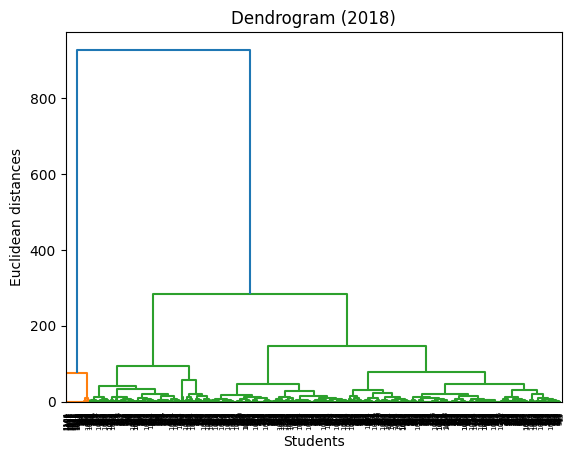

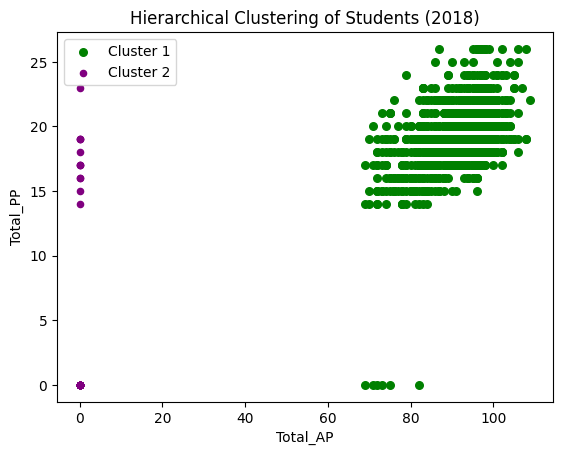

Clustering Analysis for 2019


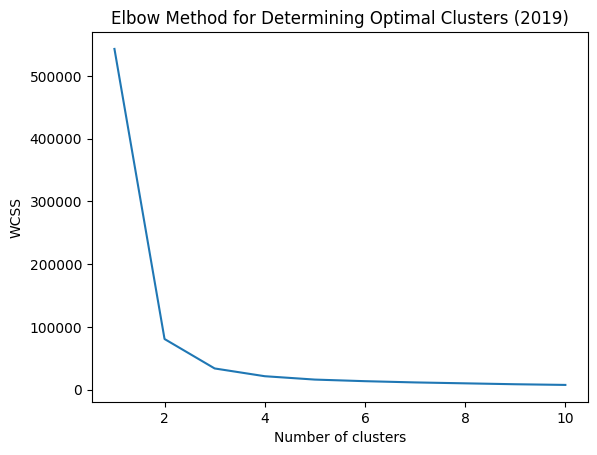

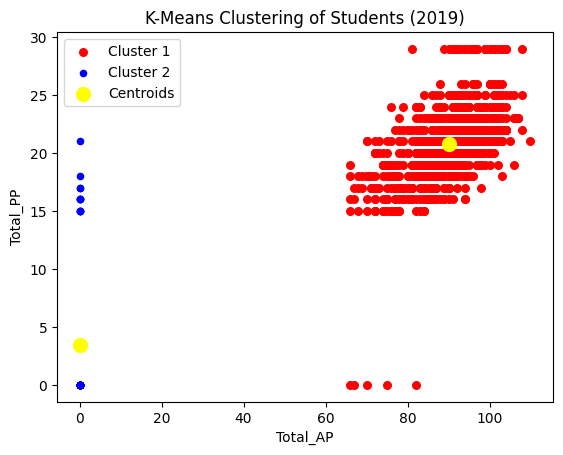

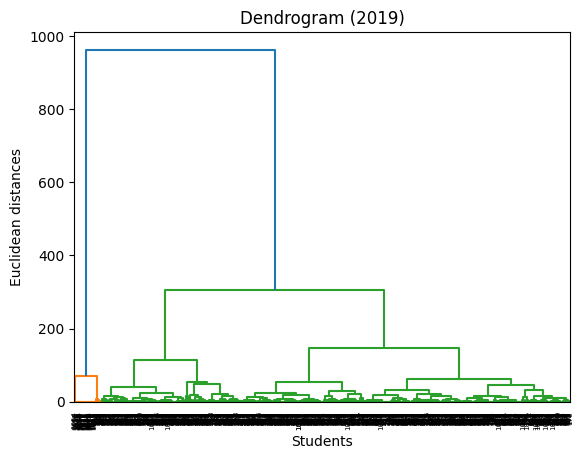

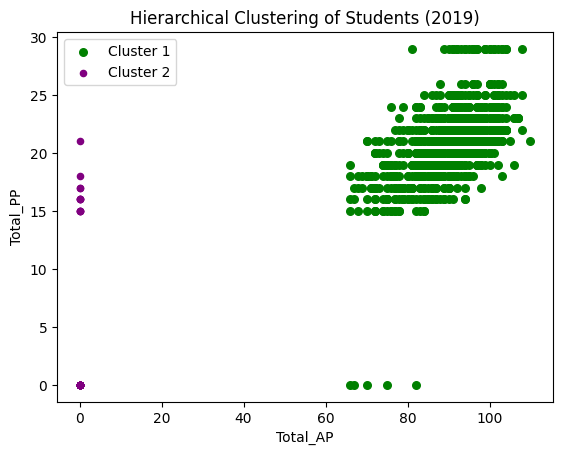

Clustering Analysis for 2022


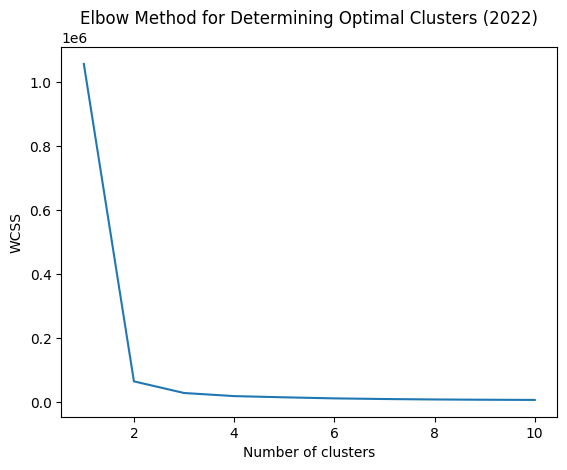

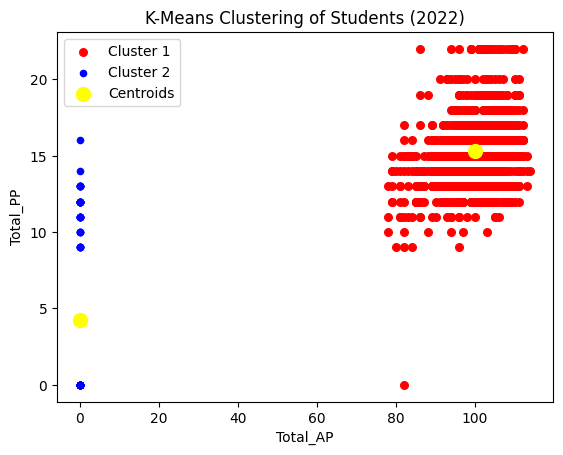

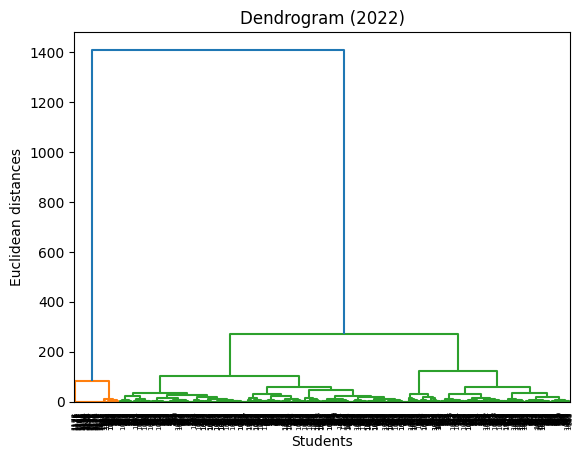

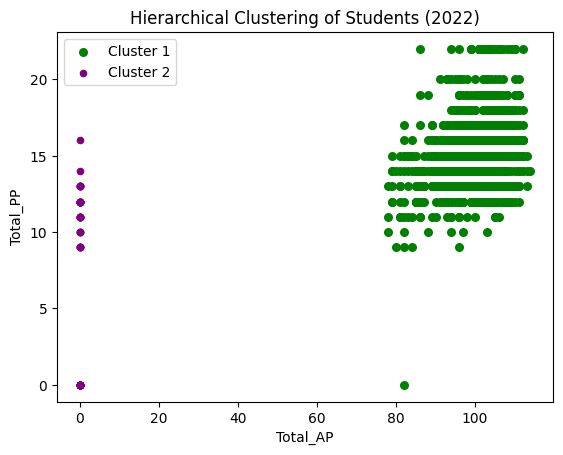

Clustering Analysis for 2023


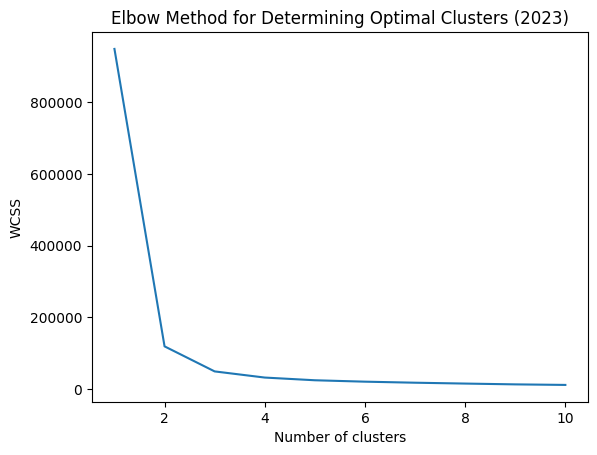

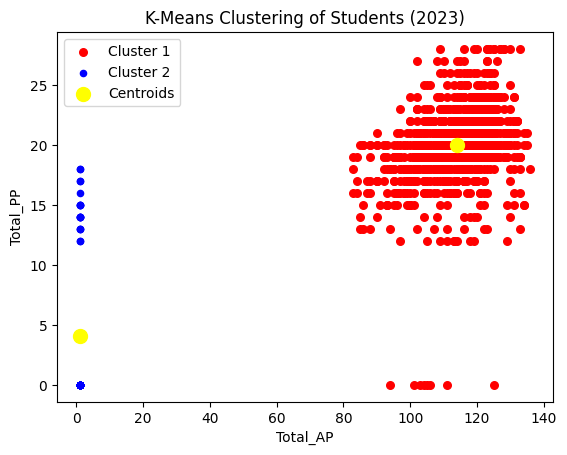

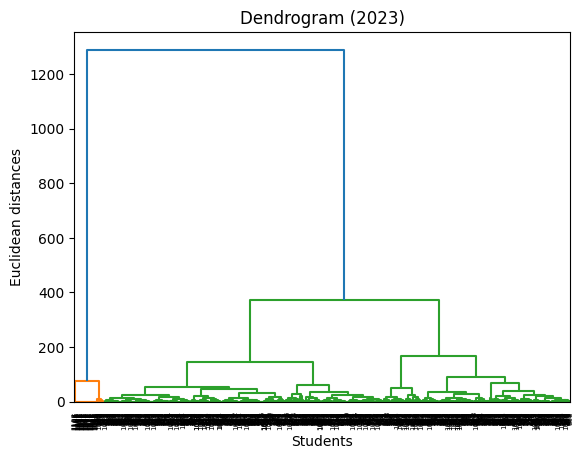

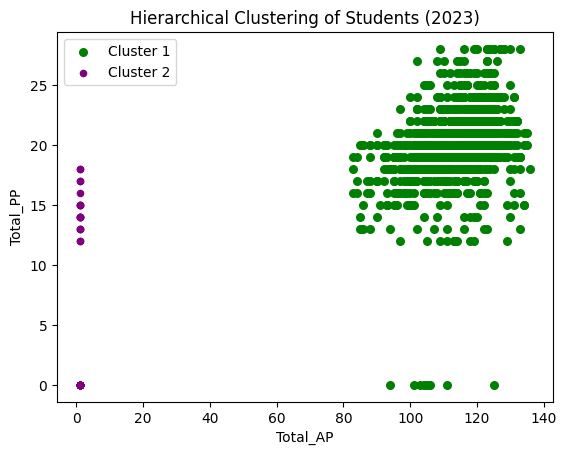

Clustering Analysis for 2024


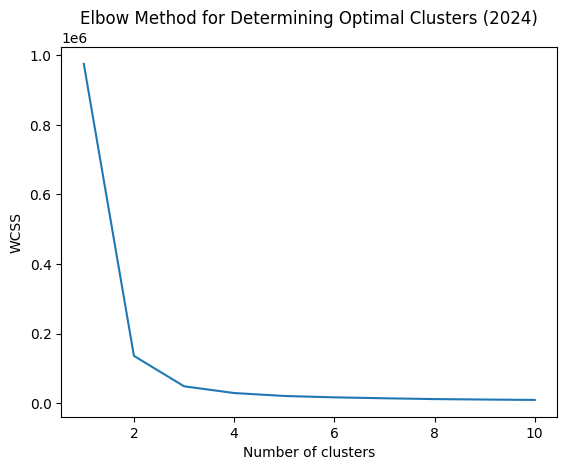

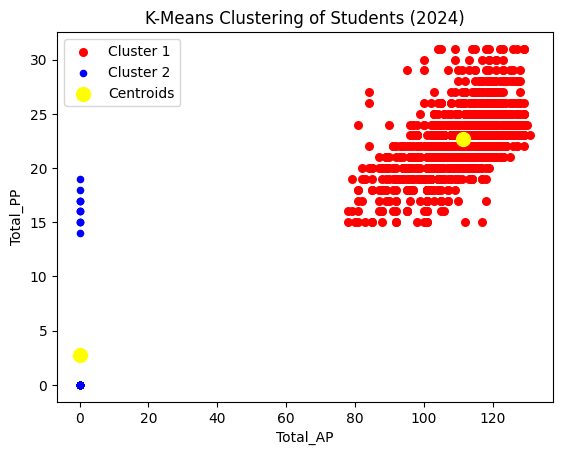

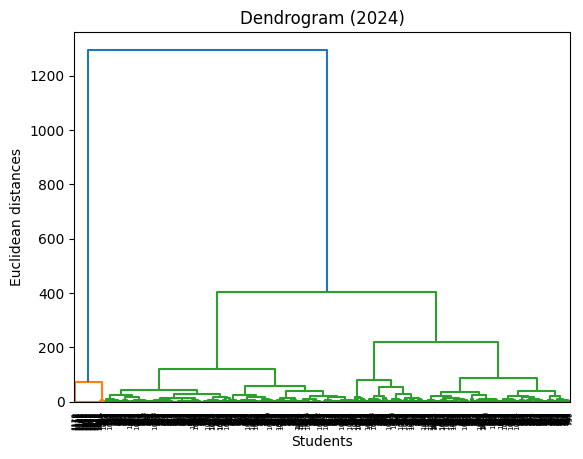

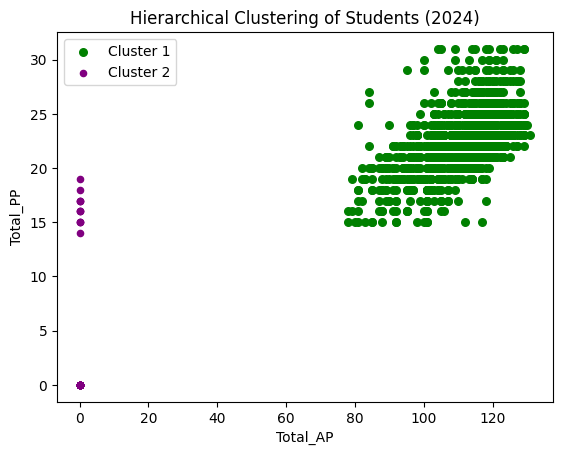

In [ ]:
dataset_years = datasets.keys()  # List of years you have data for

for year in dataset_years:
    print(f"Clustering Analysis for {year}")

    # Print the column names for the dataset of the current year
    #print(datasets[year].columns)

    # Define the features based on the available AP and PP data
    clustering_features = [
        'Total_AP', 'Total_PP'
    ]

    # Ensure all required columns are in the DataFrame
    if all(feature in datasets[year].columns for feature in clustering_features):
        # Adjust the feature list to include only those available in the dataset
        available_features = [feature for feature in clustering_features if feature in datasets[year].columns]
        clustering_analysis(datasets[year], available_features, year)
    else:
        print(f"Skipping year {year}: Required columns not found in dataset.")

Clustering Analysis for 2016


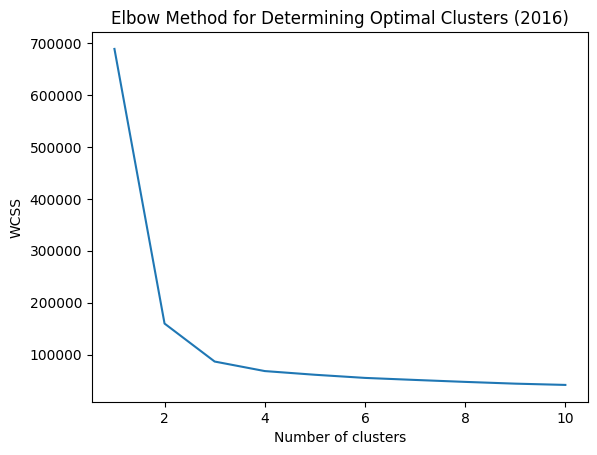

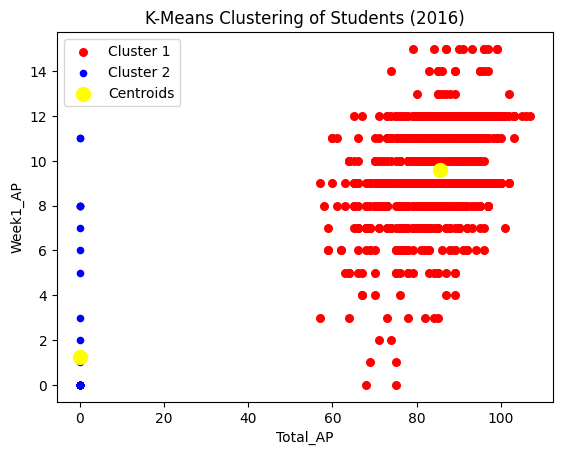

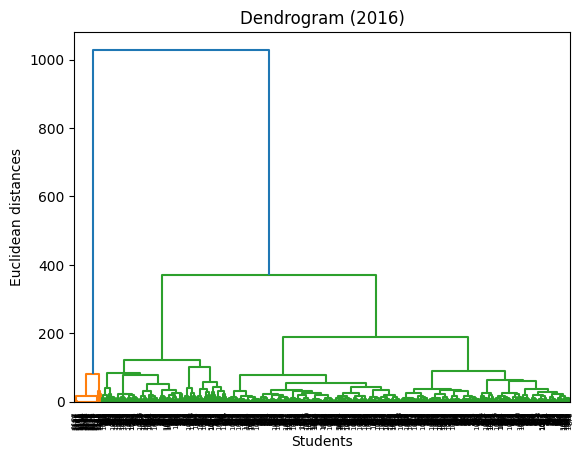

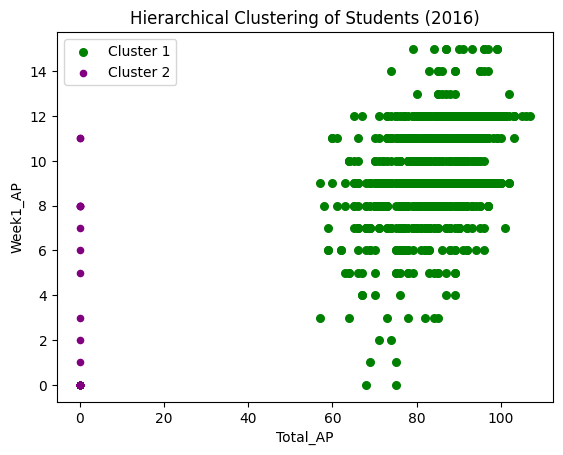

Clustering Analysis for 2017


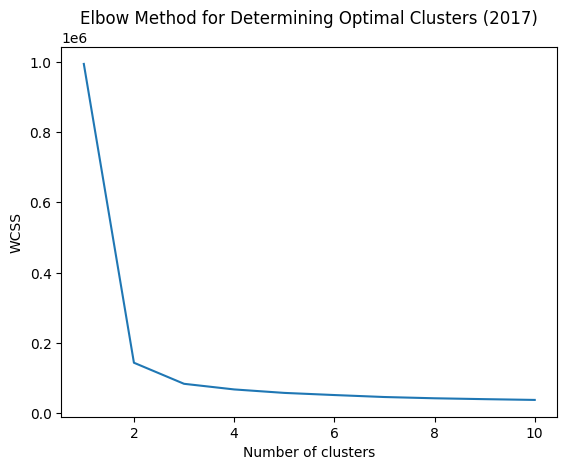

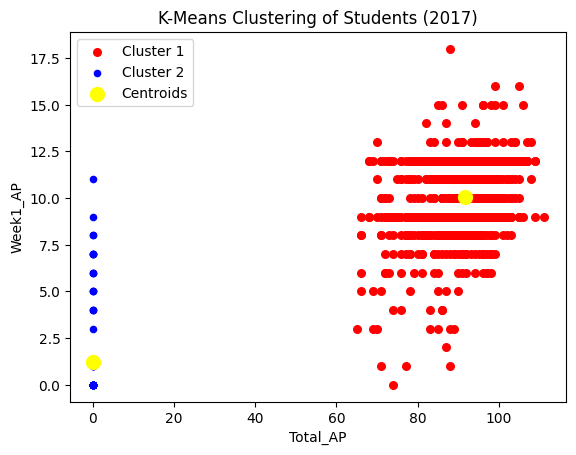

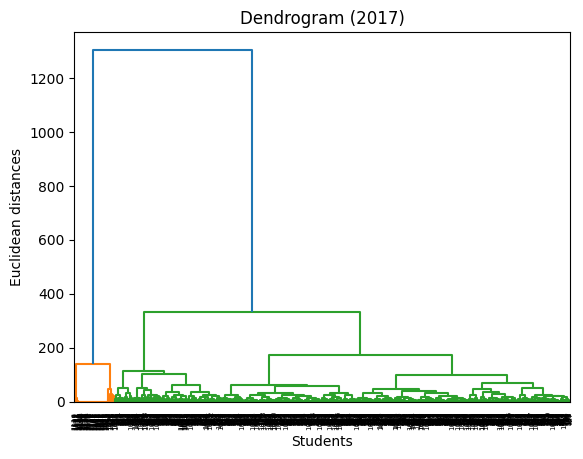

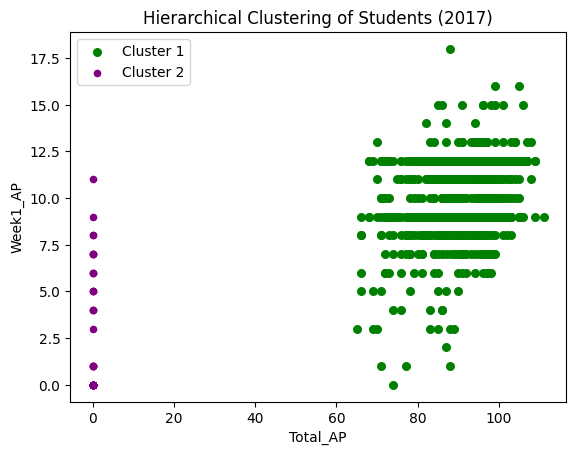

Clustering Analysis for 2018


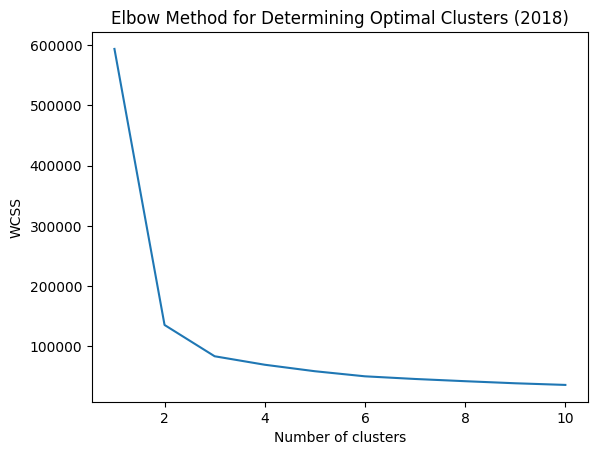

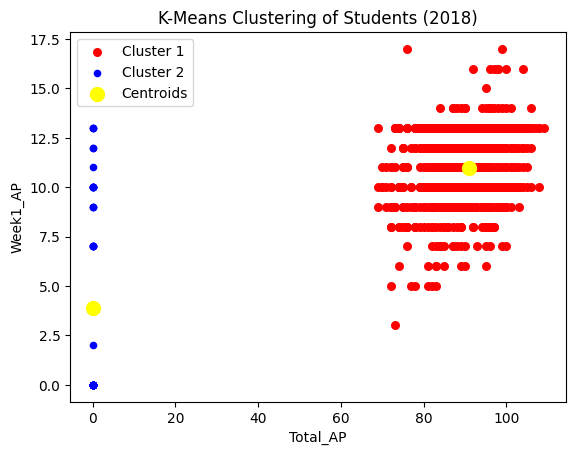

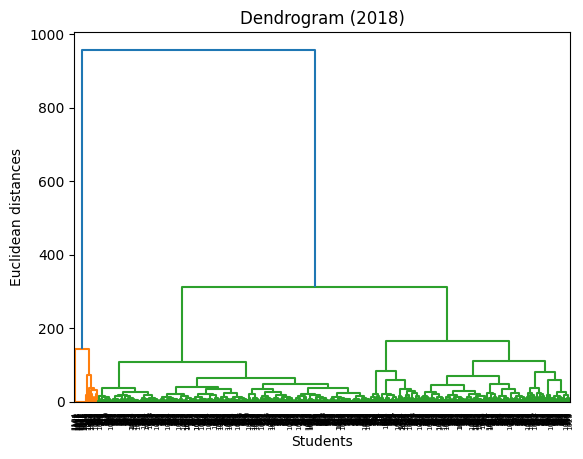

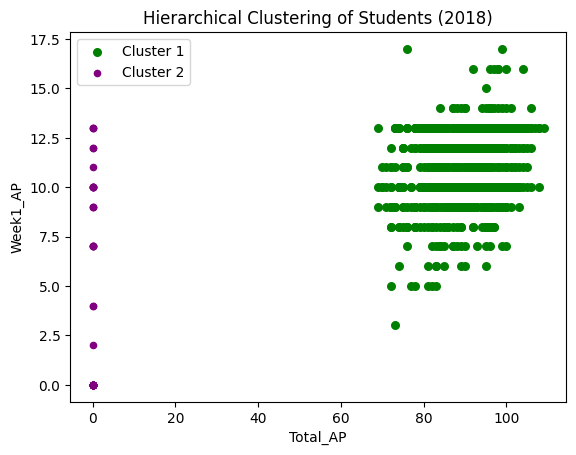

Clustering Analysis for 2019


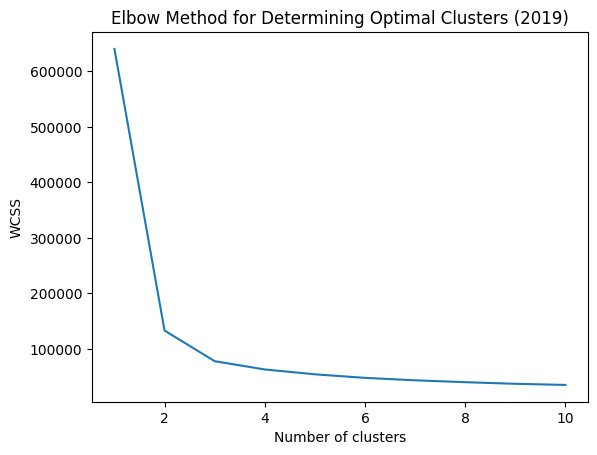

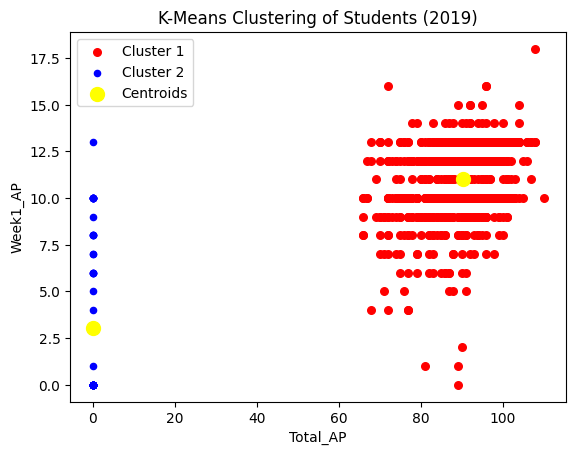

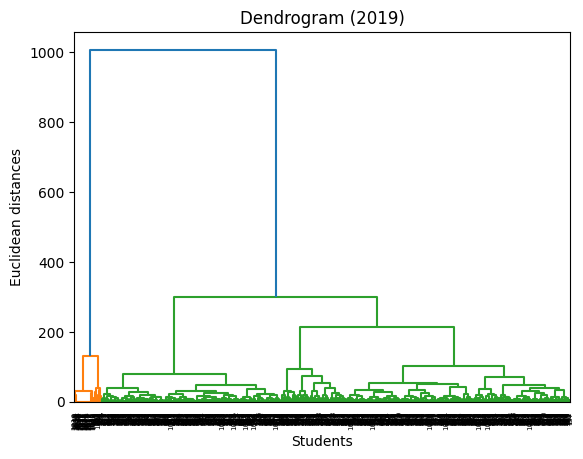

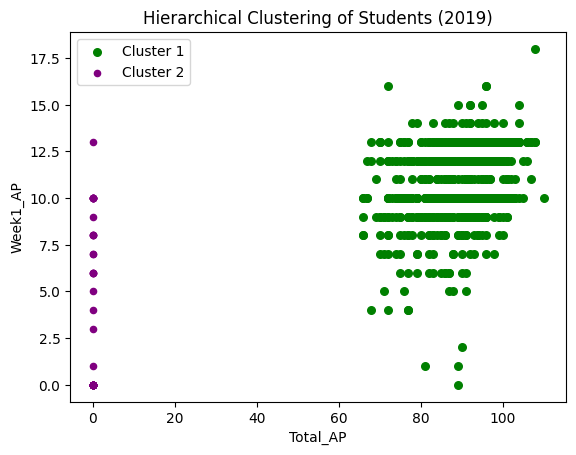

Clustering Analysis for 2022


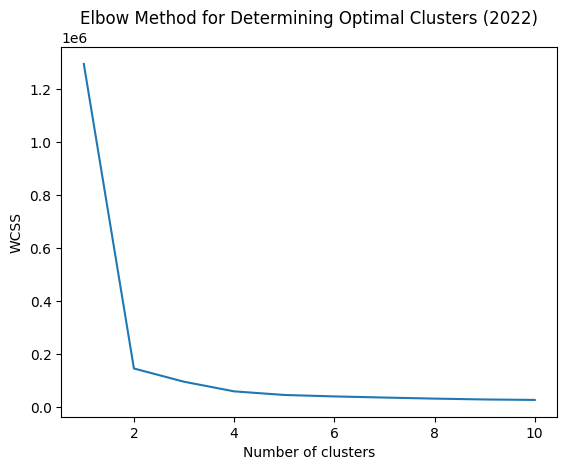

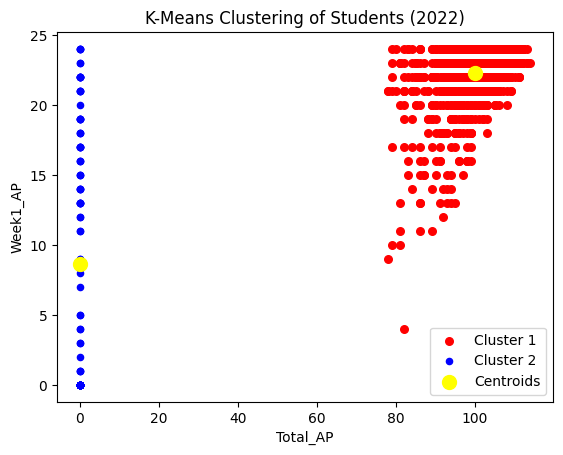

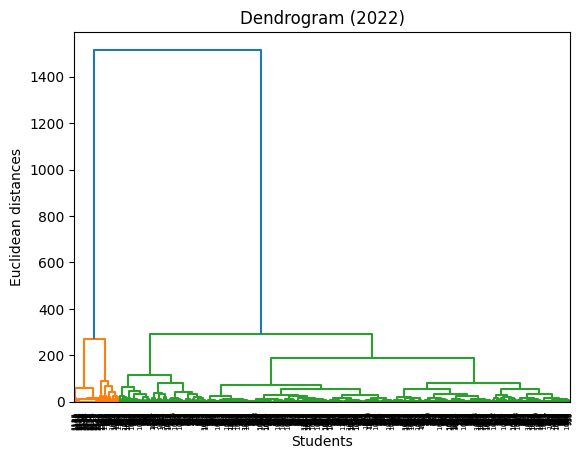

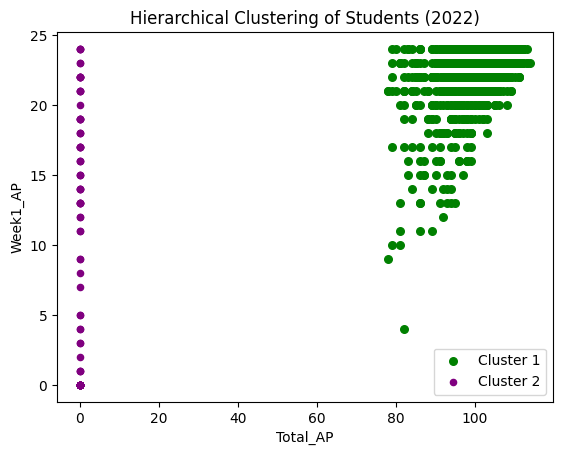

Clustering Analysis for 2023


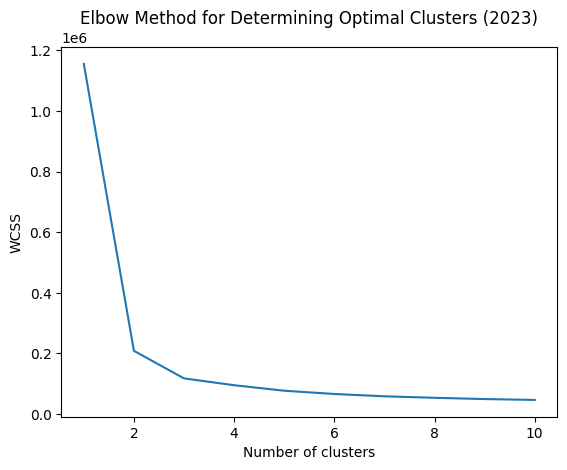

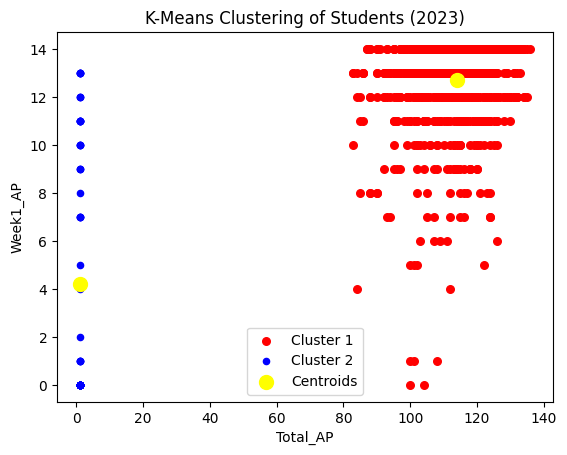

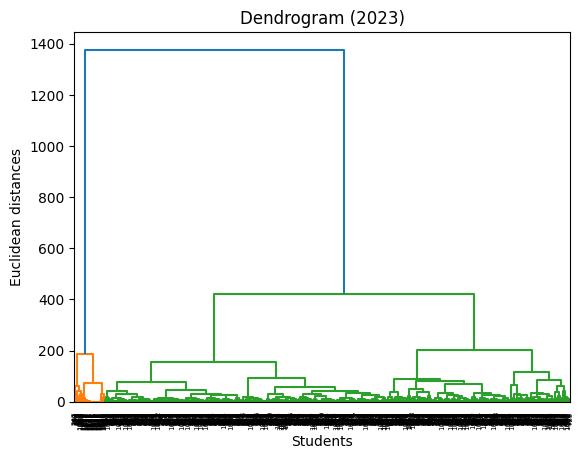

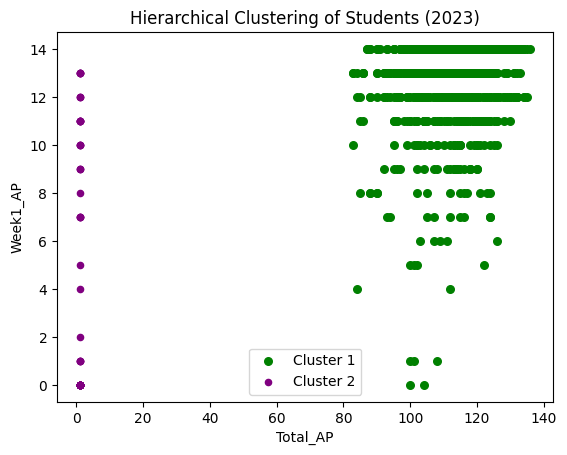

Clustering Analysis for 2024


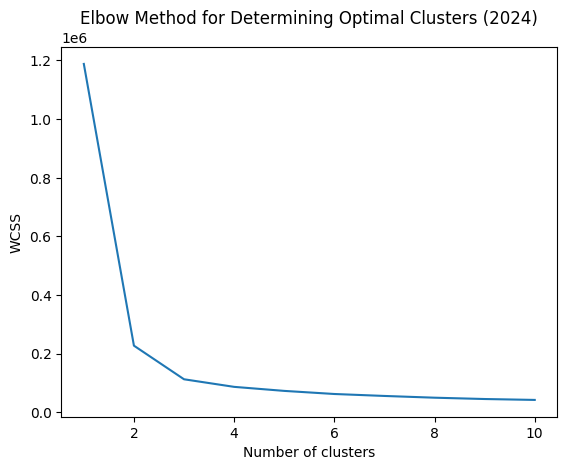

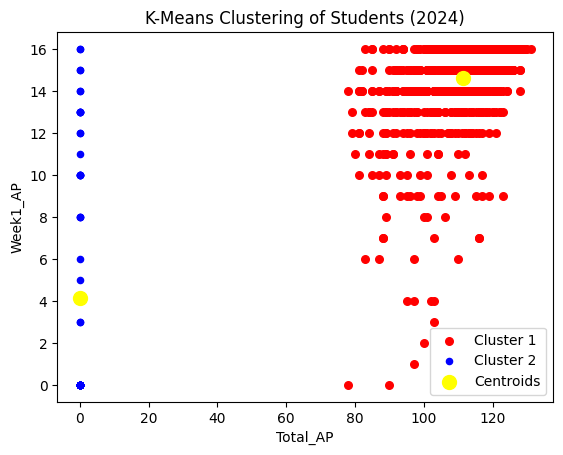

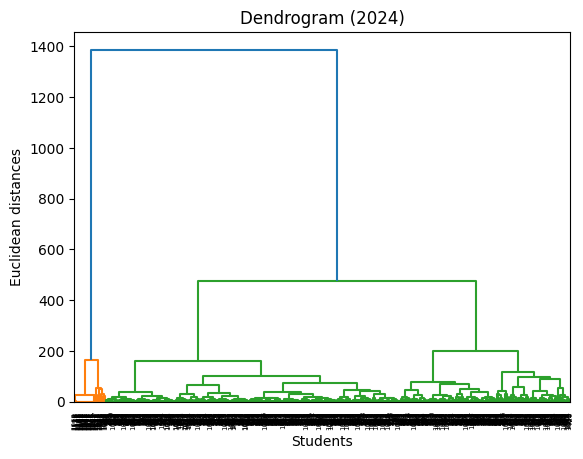

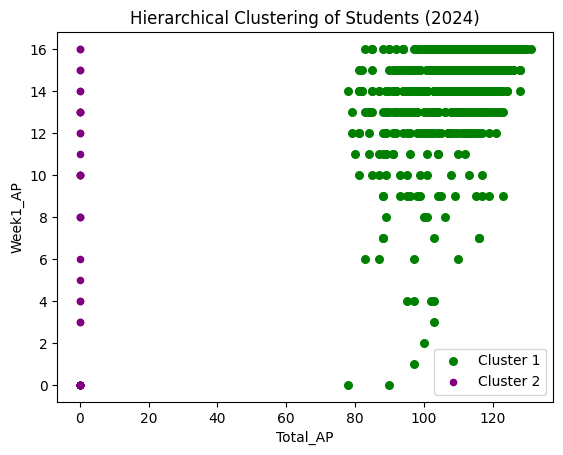

In [ ]:
dataset_years = datasets.keys()  # List of years you have data for

for year in dataset_years:
    print(f"Clustering Analysis for {year}")

    # Print the column names for the dataset of the current year
    #print(datasets[year].columns)

    # Define the features based on the available AP and PP data
    clustering_features = [
        'Total_AP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP'
    ]

    # Ensure all required columns are in the DataFrame
    if all(feature in datasets[year].columns for feature in clustering_features):
        # Adjust the feature list to include only those available in the dataset
        available_features = [feature for feature in clustering_features if feature in datasets[year].columns]
        clustering_analysis(datasets[year], available_features, year)
    else:
        print(f"Skipping year {year}: Required columns not found in dataset.")

Clustering Analysis for 2016


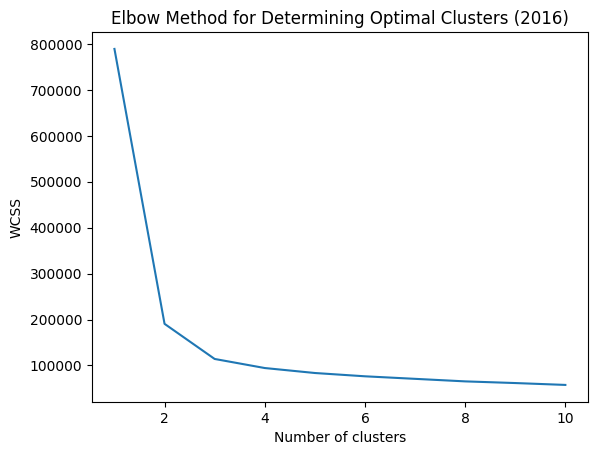

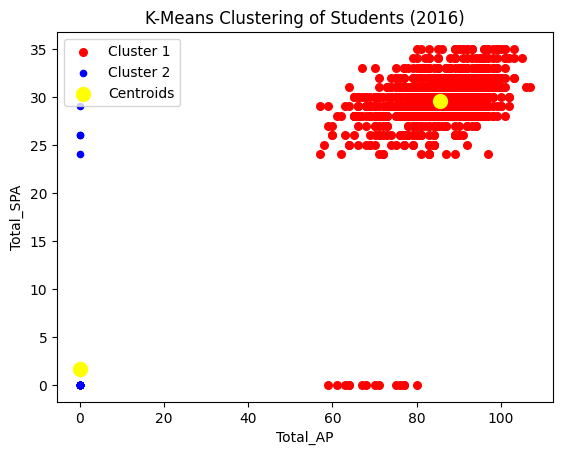

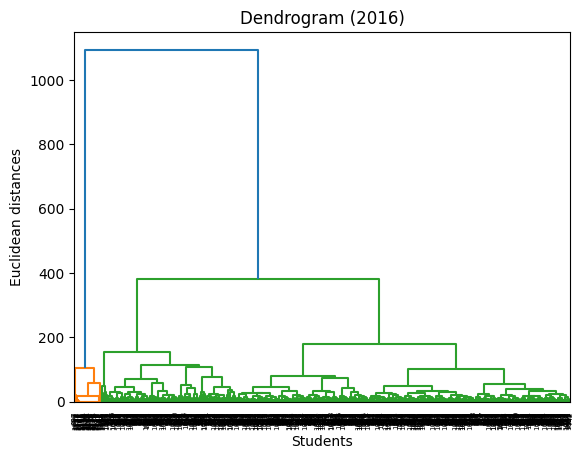

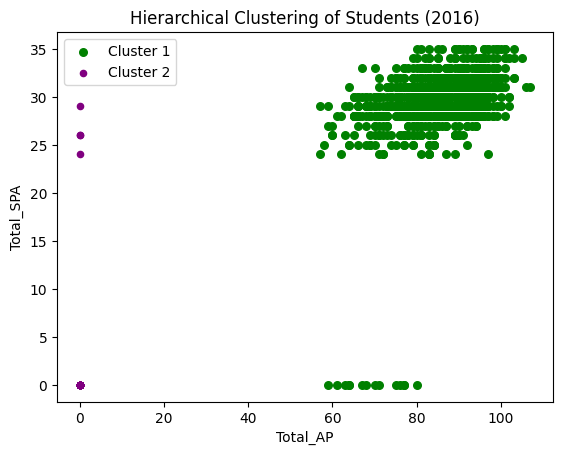

Clustering Analysis for 2017


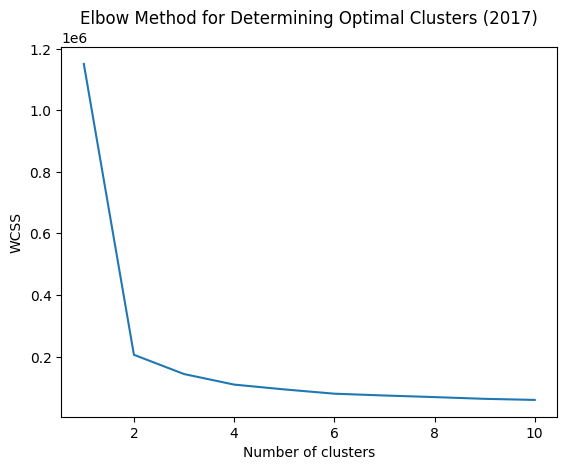

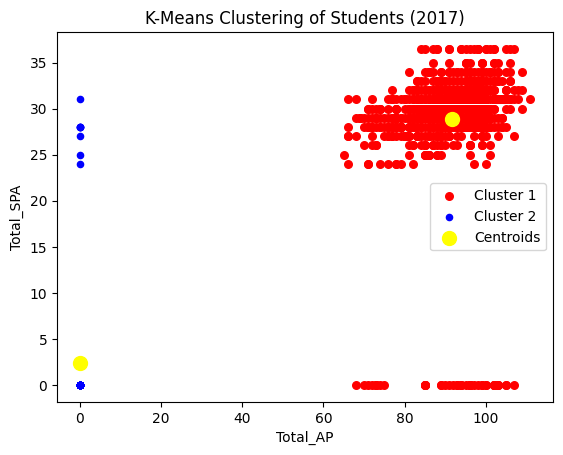

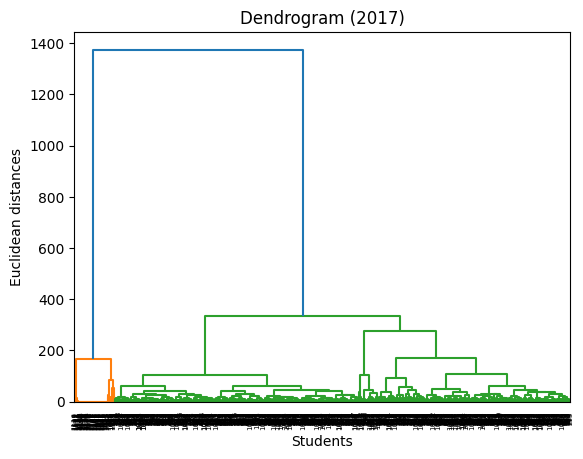

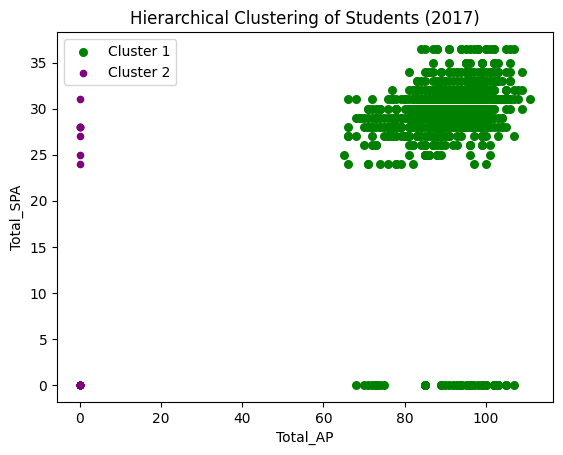

Clustering Analysis for 2018


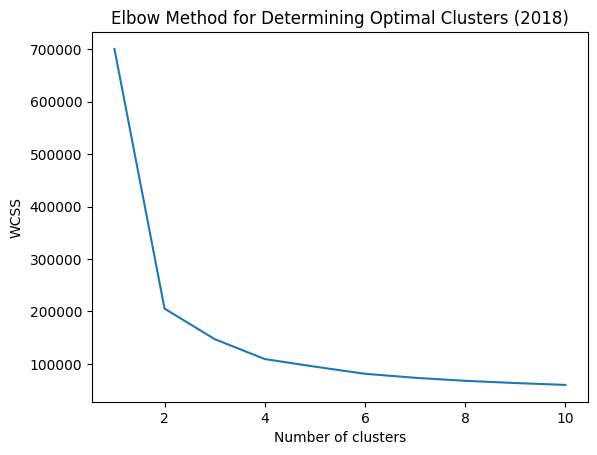

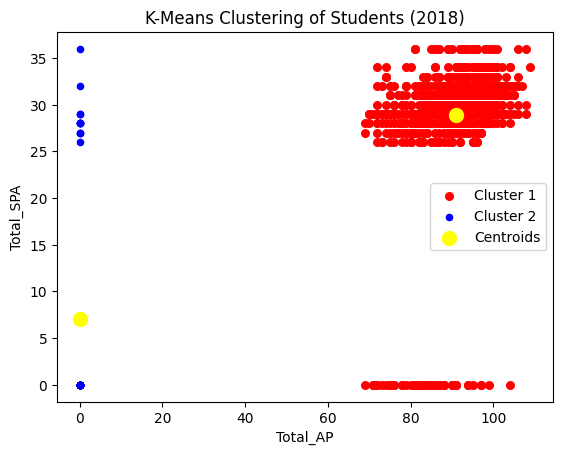

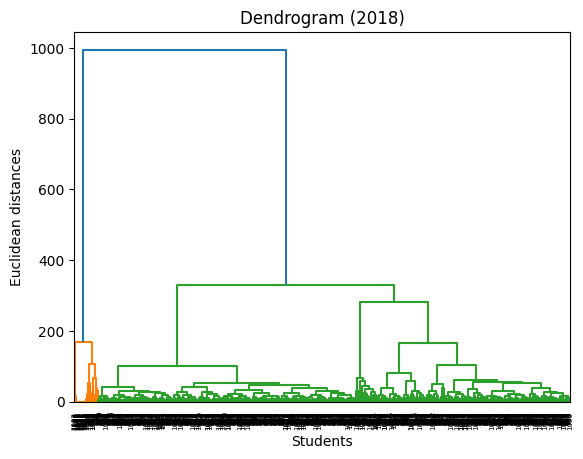

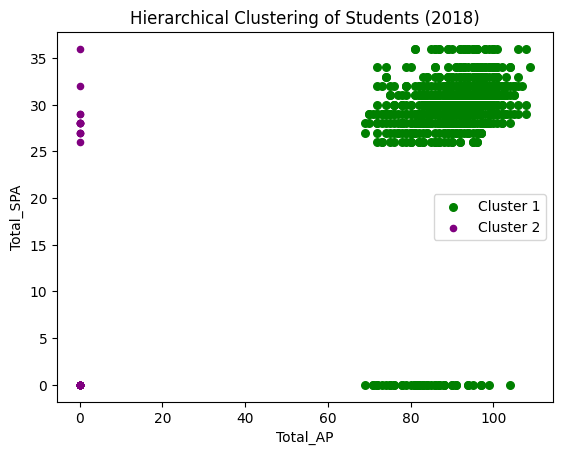

Clustering Analysis for 2019


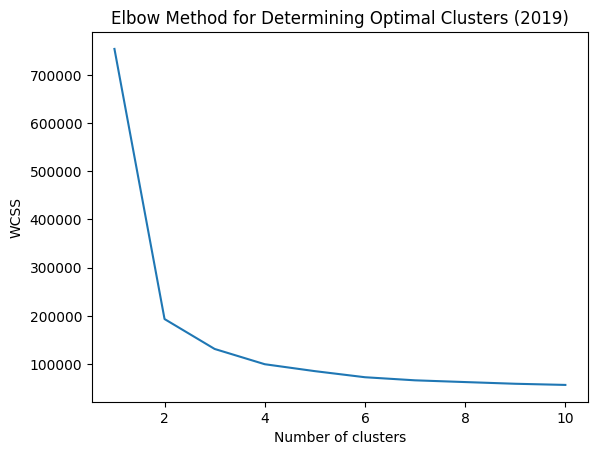

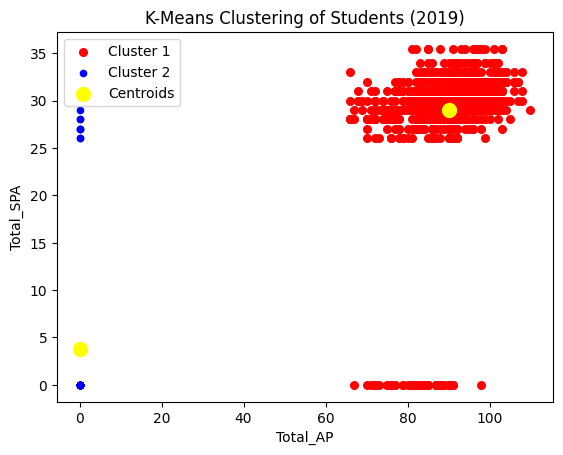

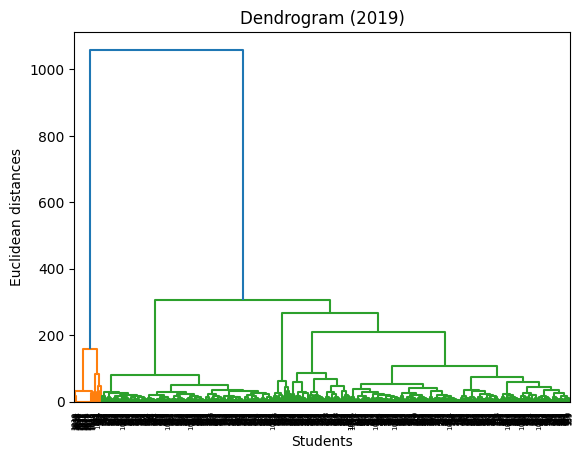

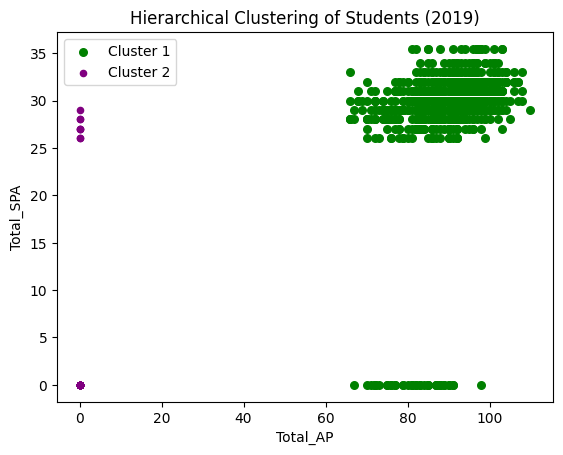

Clustering Analysis for 2022


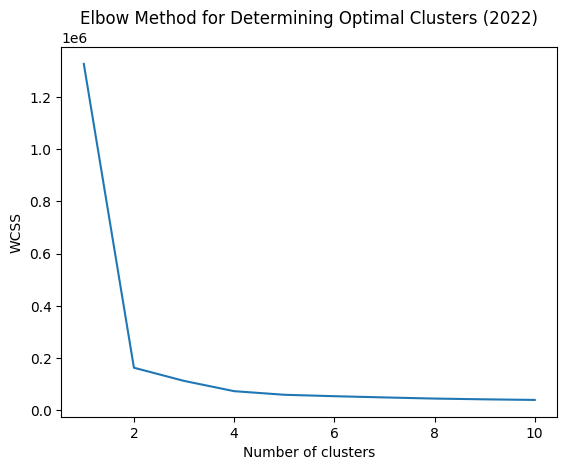

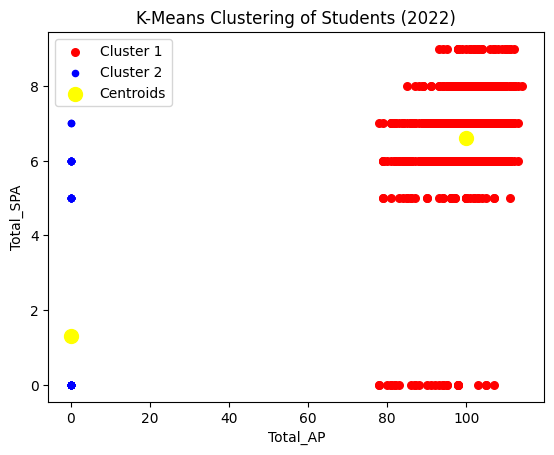

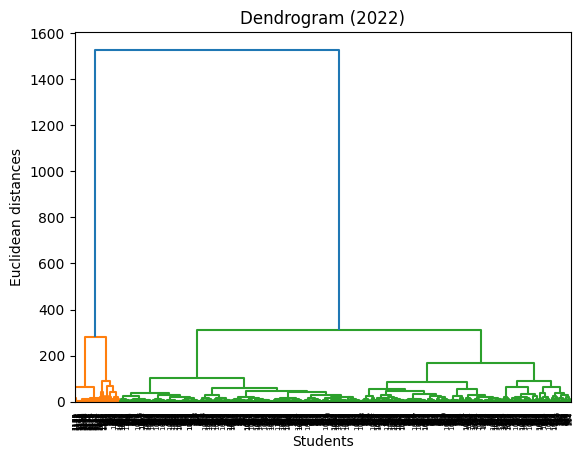

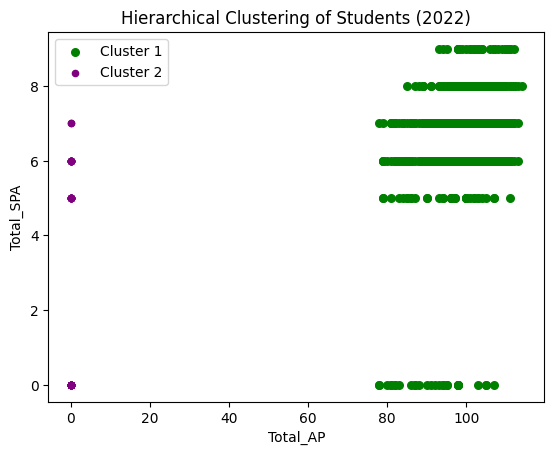

Clustering Analysis for 2023


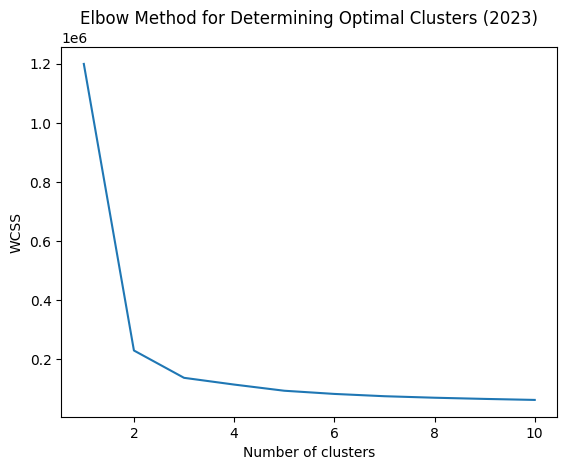

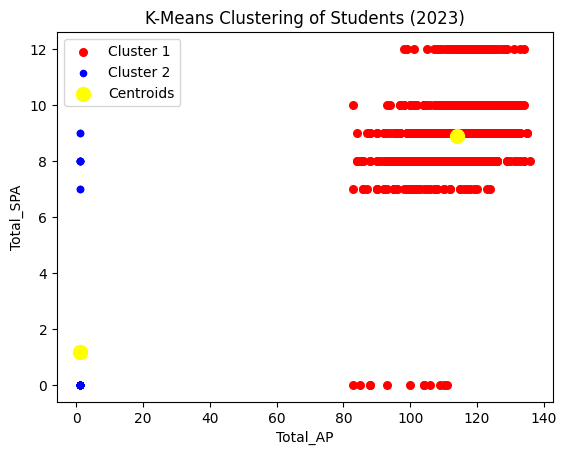

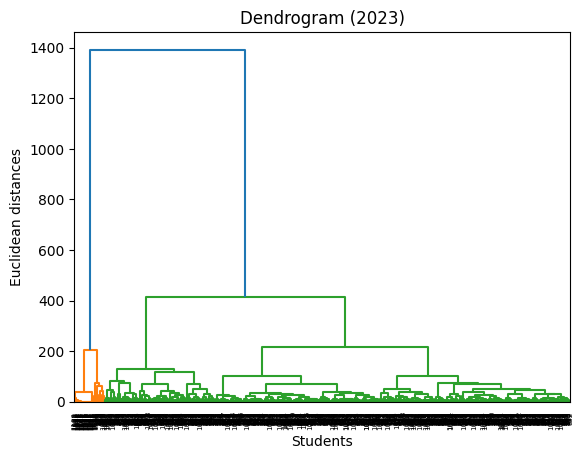

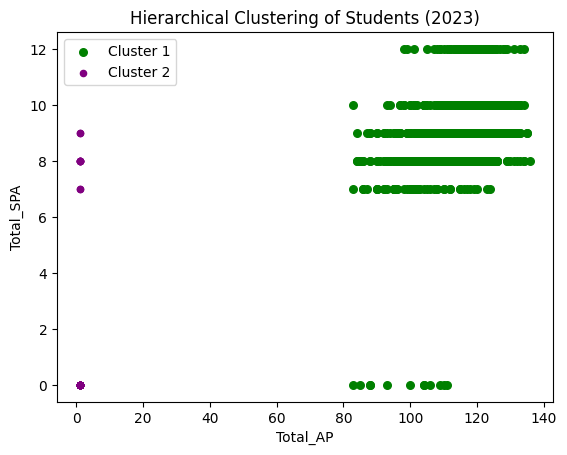

Clustering Analysis for 2024


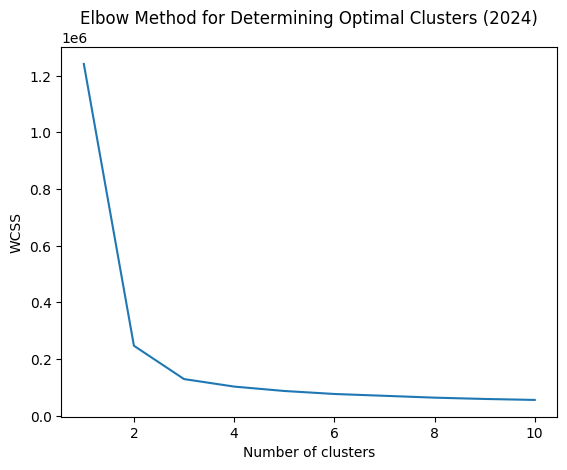

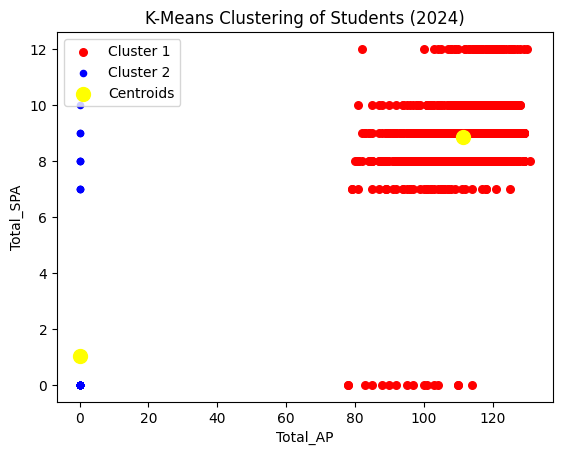

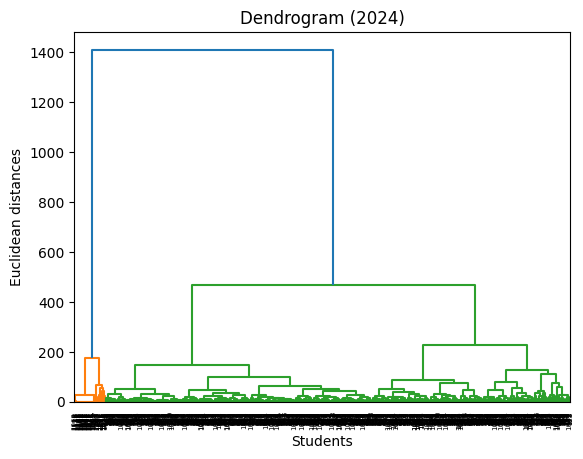

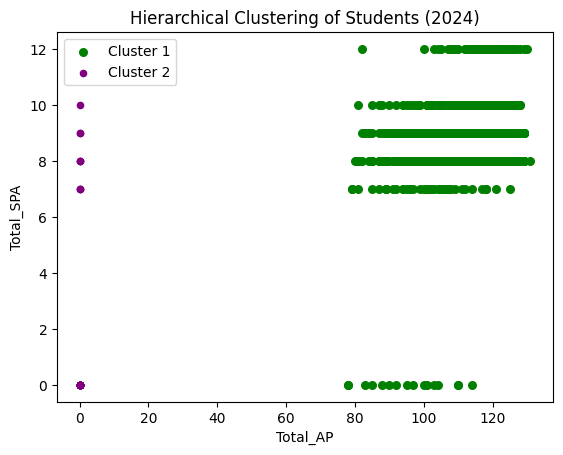

In [ ]:
dataset_years = datasets.keys()  # List of years you have data for

for year in dataset_years:
    print(f"Clustering Analysis for {year}")

    # Print the column names for the dataset of the current year
    #print(datasets[year].columns)

    # Define the features based on the available AP and PP data
    clustering_features = [
        'Total_AP', 'Total_SPA', 'Total_PP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP',
        'Week1_PP', 'Week2_PP', 'Week3_PP', 'Week4_PP', 'Week5_PP'
    ]

    # Ensure all required columns are in the DataFrame
    if all(feature in datasets[year].columns for feature in clustering_features):
        # Adjust the feature list to include only those available in the dataset
        available_features = [feature for feature in clustering_features if feature in datasets[year].columns]
        clustering_analysis(datasets[year], available_features, year)
    else:
        print(f"Skipping year {year}: Required columns not found in dataset.")


#### Feature Selection

In [ ]:
for year in dataset_years:
  top_features = select_features(datasets[year], target_column='FinalGrade')
  print(f"Top features selected for clustering: {top_features}")

Top features selected for clustering: ['Total_PP', 'Total_AP', 'PP3_1', 'PP3_2', 'PP1_3', 'PP1_2', 'PP4_1', 'PP2_3', 'PP5_2', 'PP5_3', 'PTP2', 'PP2_2', 'PP2_1', 'Week2_PP', 'Week1_PP', 'Week3_PP', '5_10', 'PP3_3', 'PP4_2', 'Week4_PP']
Top features selected for clustering: ['PP4_1', '3_6', 'PP3_1', 'PP1_3', '4_9a', 'PP1_2', 'PP2_2', '2_18a', 'PP5_2', 'PTP2', 'PP5_1', '4_4a', '3_8a', '4_3', 'PP1_1', 'PP3_3', 'PTP4', 'PP2_3', 'PP2_1', '2_13']
Top features selected for clustering: ['Total_AP', 'Total_PP', 'Week3_AP', 'PP4_2', 'PP5_2', 'PP2_2', 'PTP3', 'Week4_PP', 'Week2_PP', '3_6', '4_9a', '2_1', '4_3', '4_2', '2_3', '3_5', 'PP1_2', 'PP2_3', 'PP4_1', '4_4a']
Top features selected for clustering: ['Total_AP', 'Total_PP', 'Week3_AP', '3_6', '1_4a', 'PP4_2', 'PTP2', 'PP5_2', '2_13', 'Week4_PP', 'PP3_3', 'PP3_1', 'PP5_3', 'PTP3', 'Total_SPA', 'PP2_2', 'Week2_AP', 'Week1_AP', 'PP1_2', 'SPA2']
Top features selected for clustering: ['PP3_3', '3_3', 'PP2_3', 'PP3_4', 'PP2_4', '3_1', 'PP2_1', 'PP1_

Hierarchical Clustering Analysis for 2016
Running clustering analysis for 2016 with features: ['Total_AP', 'Total_SPA', 'Total_PP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP', 'Week1_PP', 'Week2_PP', 'Week3_PP', 'Week4_PP', 'Week5_PP']


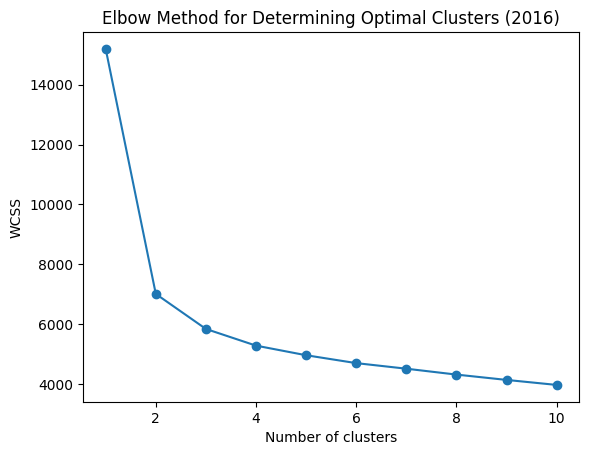

Year: 2016 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.4294391055015583
Davies-Bouldin Index: 0.7551743031593096
Calinski-Harabasz Index: 3042.383275941655


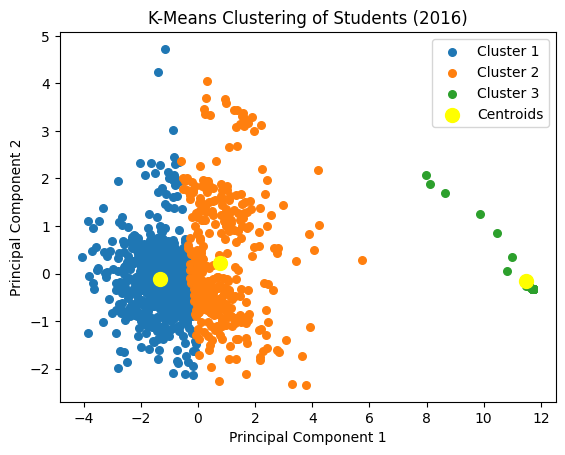

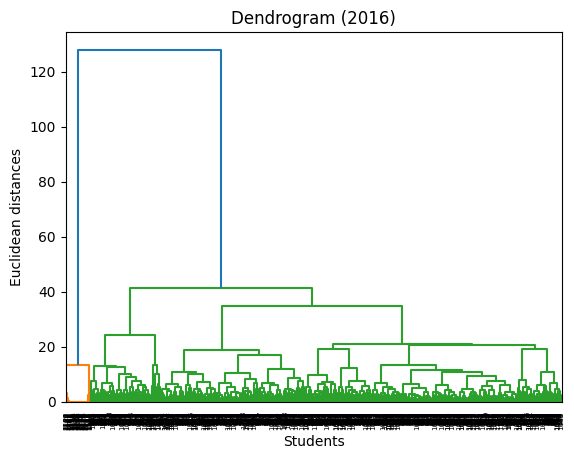

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2016 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.34073184654534966
Davies-Bouldin Index: 0.7602040102374331
Calinski-Harabasz Index: 2767.3802053984923


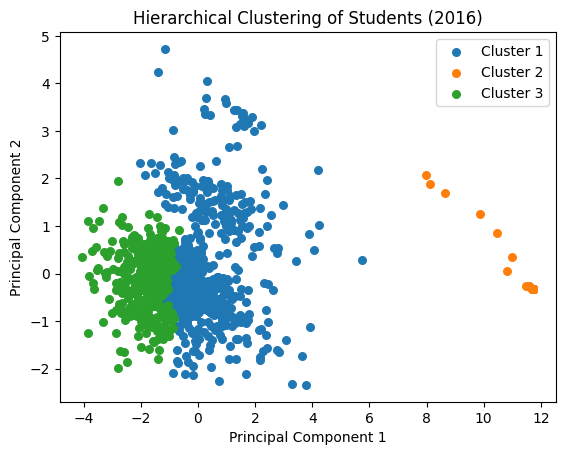

Hierarchical Clustering Analysis for 2017
Running clustering analysis for 2017 with features: ['Total_AP', 'Total_SPA', 'Total_PP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP', 'Week1_PP', 'Week2_PP', 'Week3_PP', 'Week4_PP', 'Week5_PP']


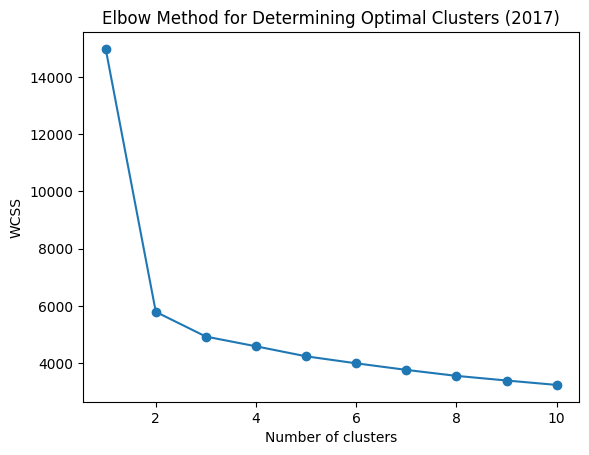

Year: 2017 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.4515306238972474
Davies-Bouldin Index: 0.745856100670833
Calinski-Harabasz Index: 4038.5092967284563


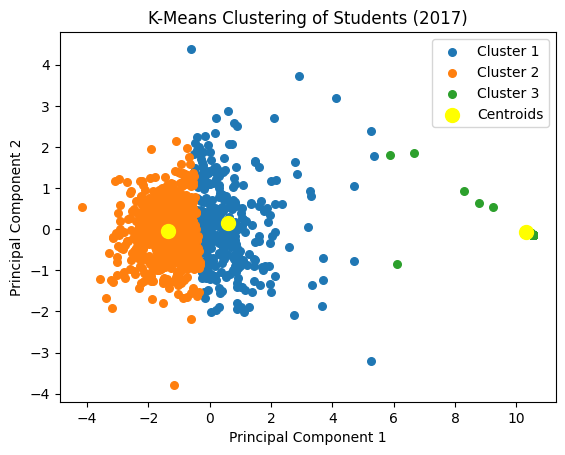

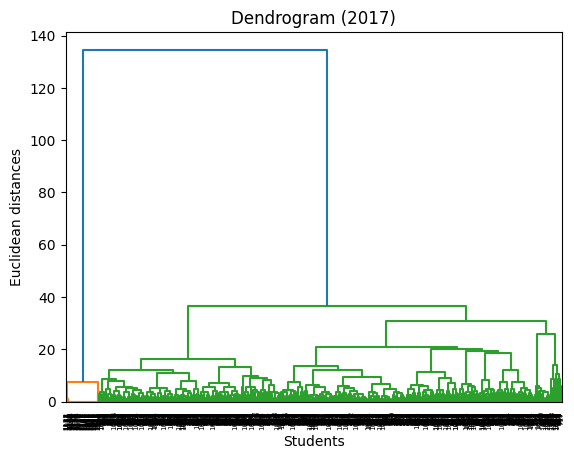

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2017 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.45756194467863254
Davies-Bouldin Index: 0.830176801774658
Calinski-Harabasz Index: 3572.4029643946087


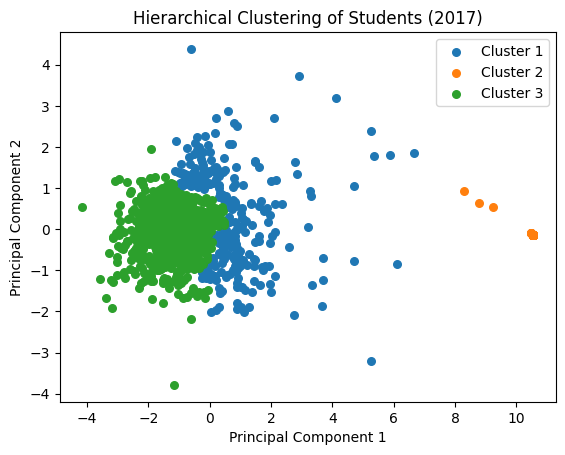

Hierarchical Clustering Analysis for 2018
Running clustering analysis for 2018 with features: ['Total_AP', 'Total_SPA', 'Total_PP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP', 'Week1_PP', 'Week2_PP', 'Week3_PP', 'Week4_PP', 'Week5_PP']


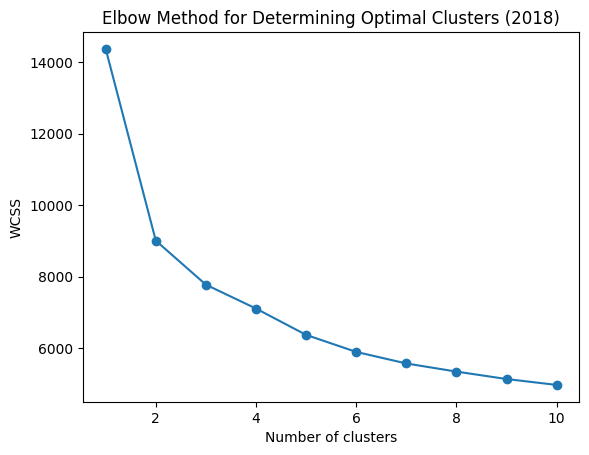

Year: 2018 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.48522774881359687
Davies-Bouldin Index: 0.8309019519953802
Calinski-Harabasz Index: 1485.6595534343026


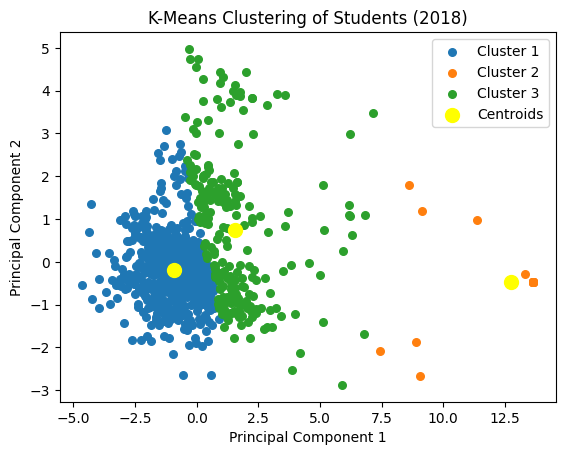

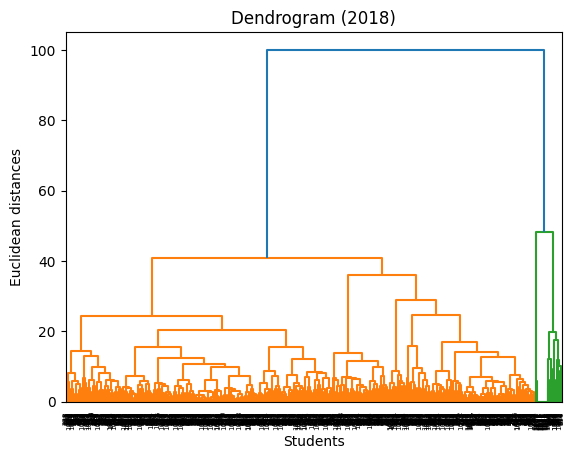

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2018 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.47969496852131677
Davies-Bouldin Index: 0.7357728763123353
Calinski-Harabasz Index: 1269.643010992299


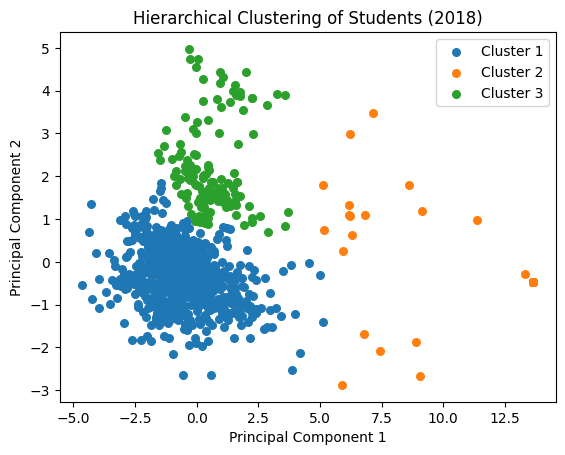

Hierarchical Clustering Analysis for 2019
Running clustering analysis for 2019 with features: ['Total_AP', 'Total_SPA', 'Total_PP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP', 'Week1_PP', 'Week2_PP', 'Week3_PP', 'Week4_PP', 'Week5_PP']


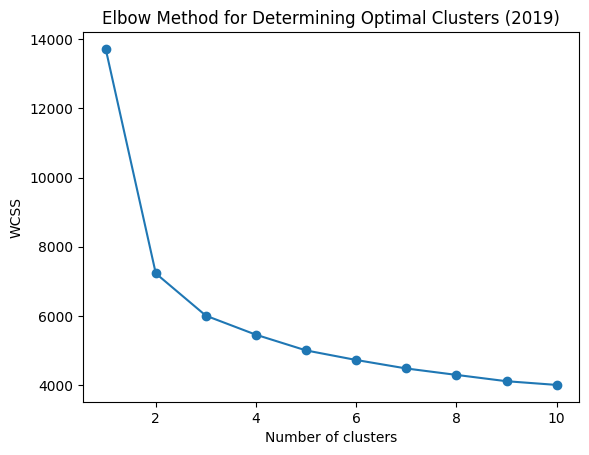

Year: 2019 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.4494903528530514
Davies-Bouldin Index: 0.7356504890093033
Calinski-Harabasz Index: 2278.6697377505798


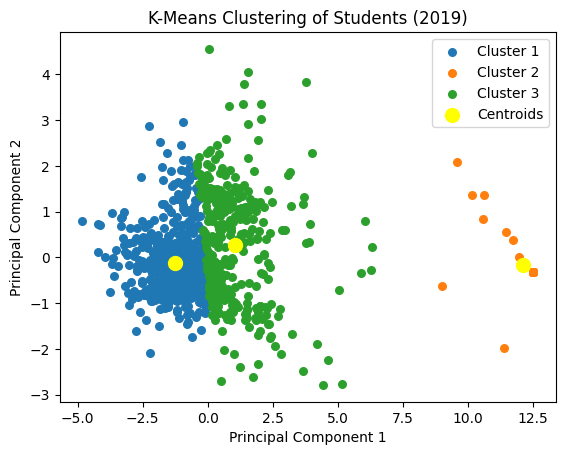

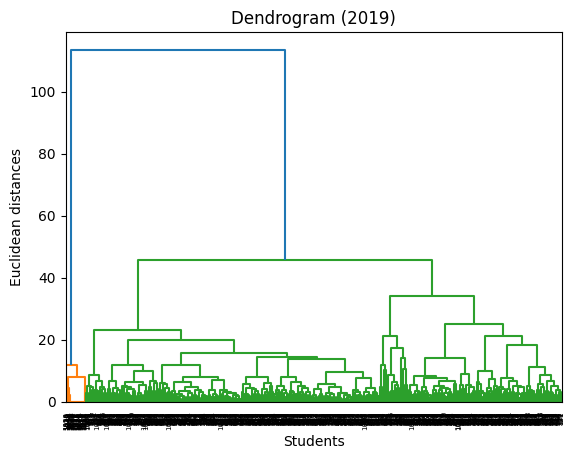

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2019 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.5254433336606693
Davies-Bouldin Index: 0.6859572944739464
Calinski-Harabasz Index: 2010.0998246480897


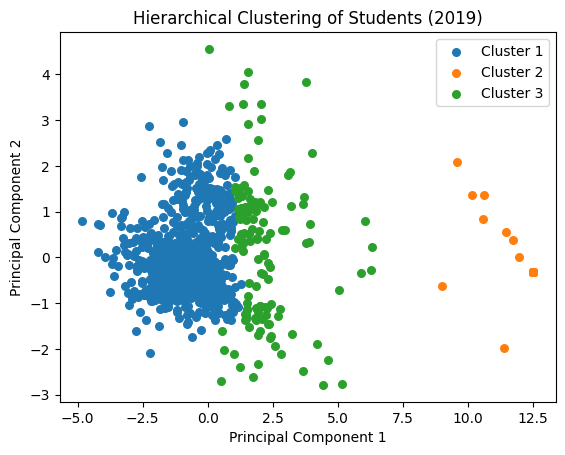

Hierarchical Clustering Analysis for 2022
Running clustering analysis for 2022 with features: ['Total_AP', 'Total_SPA', 'Total_PP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP', 'Week1_PP', 'Week2_PP', 'Week3_PP', 'Week4_PP', 'Week5_PP']


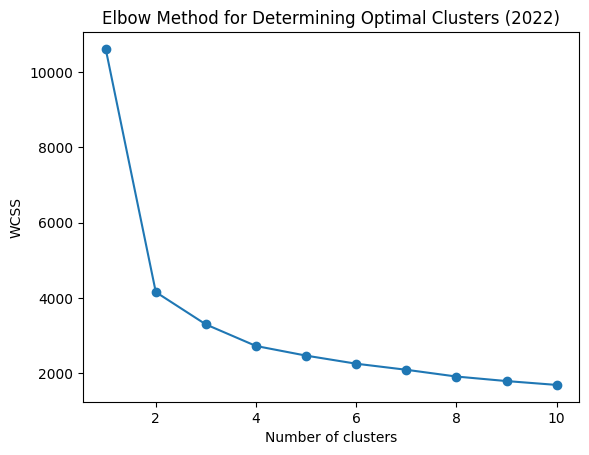

Year: 2022 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.6270833523086932
Davies-Bouldin Index: 0.6324832544082519
Calinski-Harabasz Index: 2793.971291280097


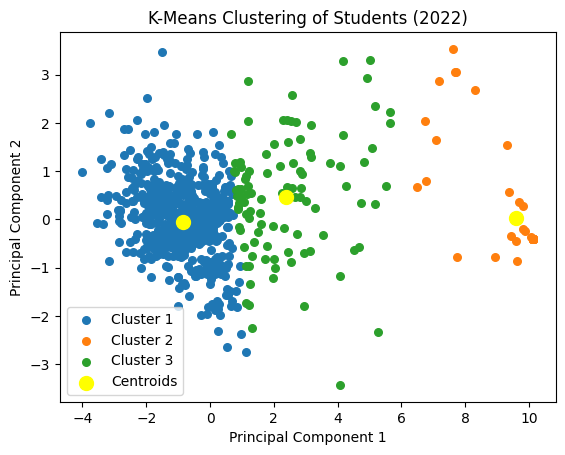

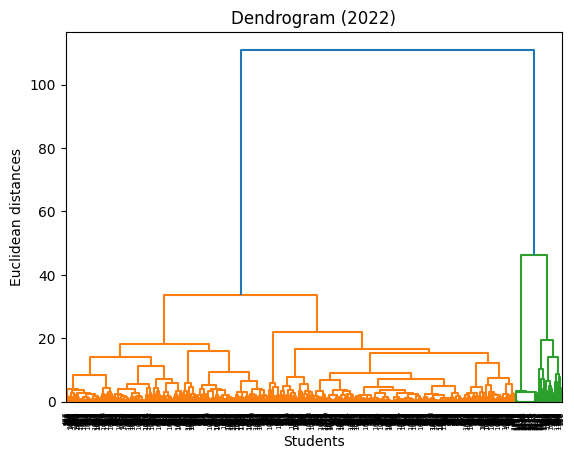

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2022 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.486661415040793
Davies-Bouldin Index: 0.7545781705442716
Calinski-Harabasz Index: 2433.3610139972475


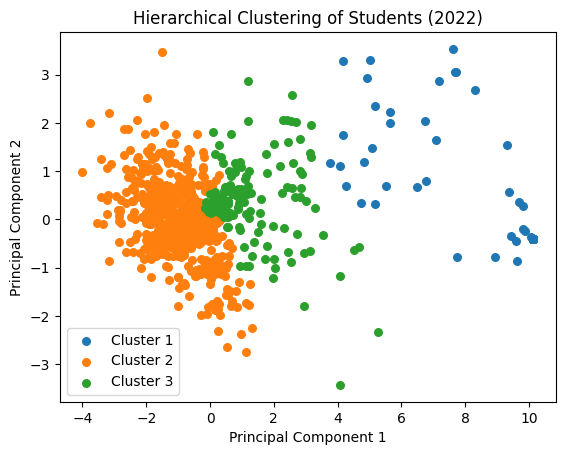

Hierarchical Clustering Analysis for 2023
Running clustering analysis for 2023 with features: ['Total_AP', 'Total_SPA', 'Total_PP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP', 'Week1_PP', 'Week2_PP', 'Week3_PP', 'Week4_PP', 'Week5_PP']


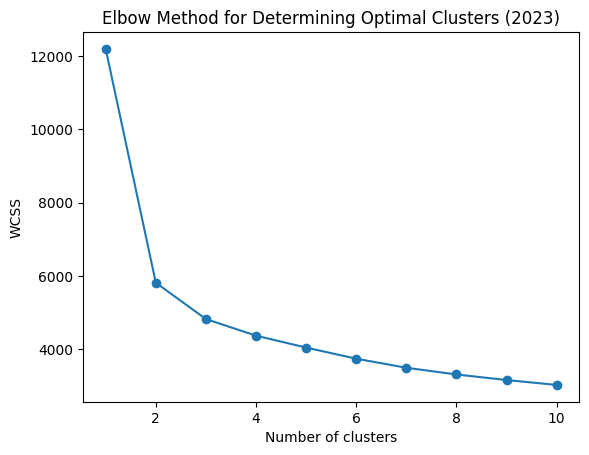

Year: 2023 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.43758685181985363
Davies-Bouldin Index: 0.750852561081142
Calinski-Harabasz Index: 2343.1561831906206


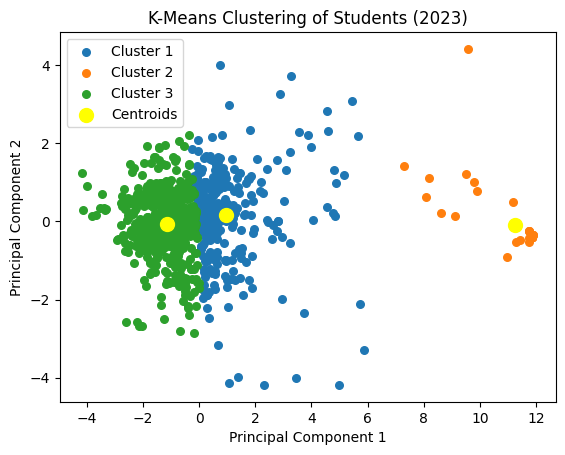

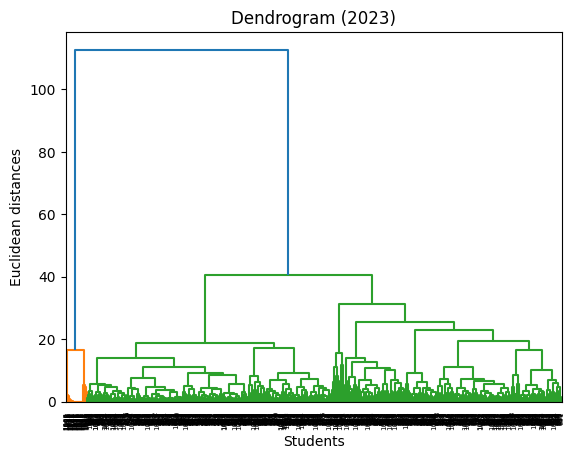

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2023 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.2944850902106537
Davies-Bouldin Index: 0.7891603285397647
Calinski-Harabasz Index: 1981.4887970344253


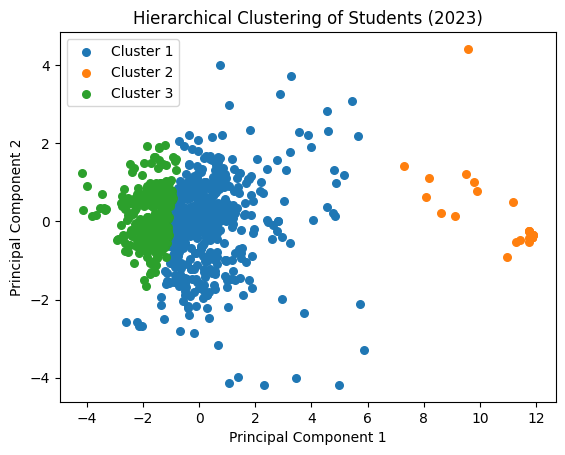

Hierarchical Clustering Analysis for 2024
Running clustering analysis for 2024 with features: ['Total_AP', 'Total_SPA', 'Total_PP', 'Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP', 'Week1_PP', 'Week2_PP', 'Week3_PP', 'Week4_PP', 'Week5_PP']


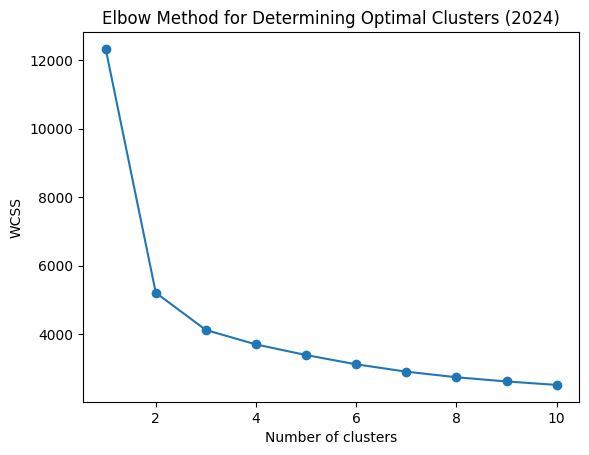

Year: 2024 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.4626494078919903
Davies-Bouldin Index: 0.7236355951604377
Calinski-Harabasz Index: 2779.191250016144


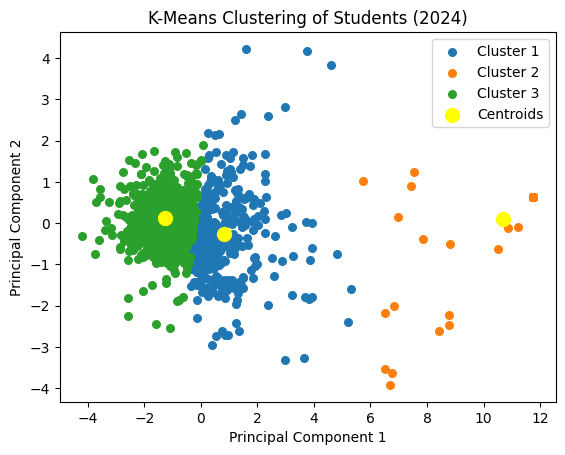

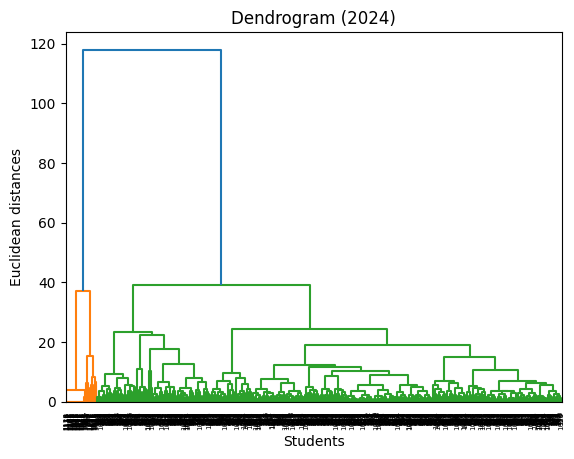

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2024 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.4226723392992092
Davies-Bouldin Index: 0.7648513825341877
Calinski-Harabasz Index: 2592.0449680462825


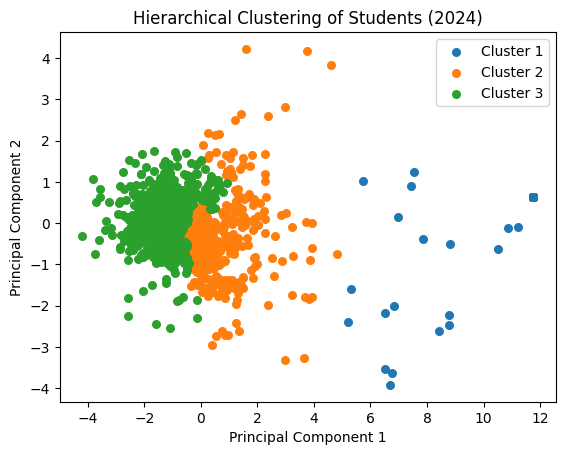

In [ ]:

# Test the enhanced clustering analysis with debugging messages
for year in dataset_years:
    print(f"Hierarchical Clustering Analysis for {year}")

    # Identify missing features
    missing_features = [feature for feature in clustering_features if feature not in datasets[year].columns]

    if not missing_features:
        available_features = [feature for feature in clustering_features if feature in datasets[year].columns]
        print(f"Running clustering analysis for {year} with features: {available_features}")
        extensive_clustering_analysis(datasets[year], available_features, year)
    else:
        print(f"Skipping year {year}: Required columns not found in dataset.")
        print(f"Missing features for year {year}: {missing_features}")

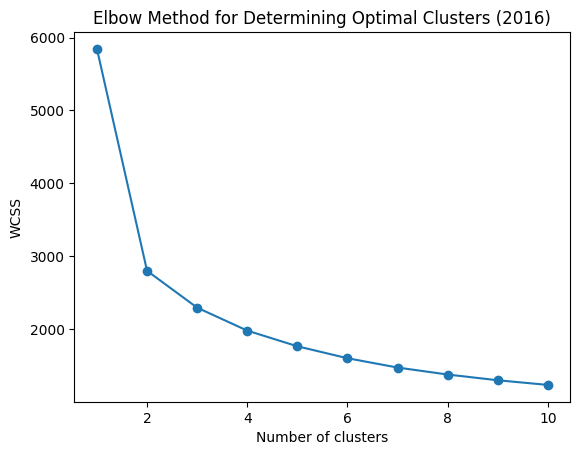

Year: 2016 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.3938196489358095
Davies-Bouldin Index: 0.8498970300334324
Calinski-Harabasz Index: 2191.34994786478


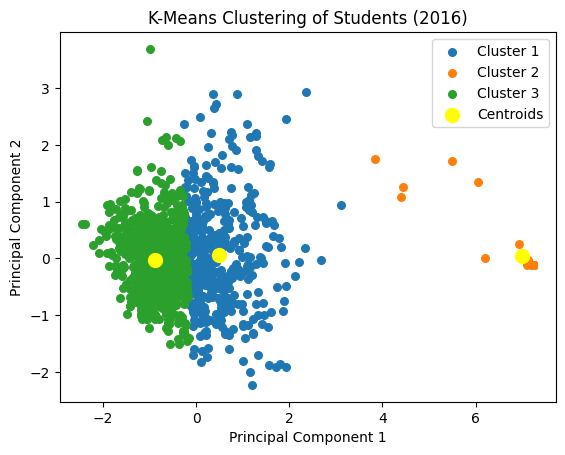

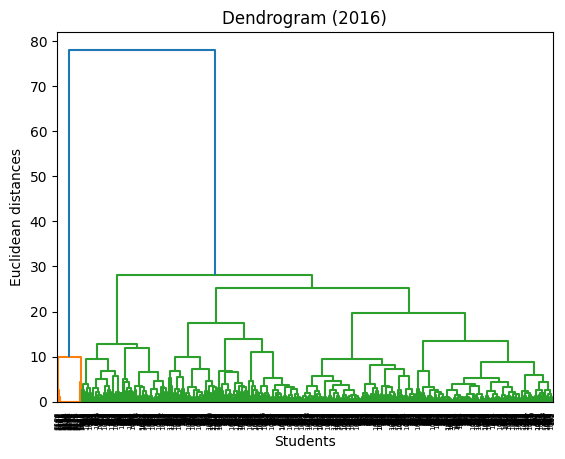

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2016 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.298380304457382
Davies-Bouldin Index: 1.044547377826541
Calinski-Harabasz Index: 1817.546555099288


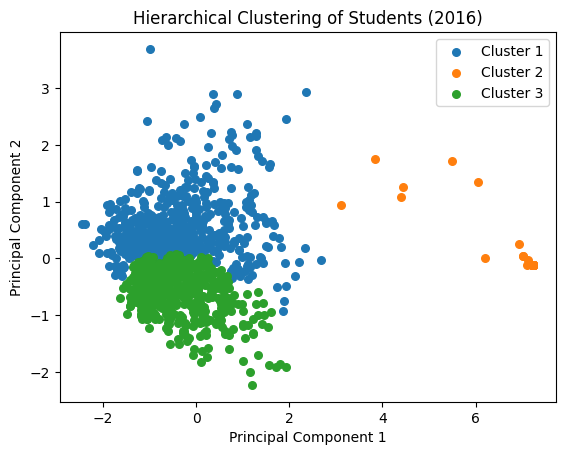

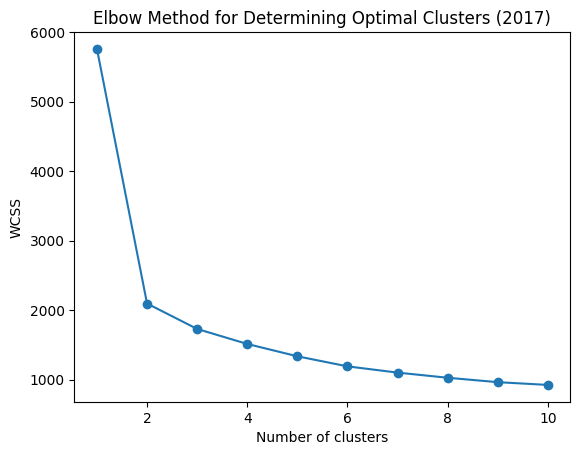

Year: 2017 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.39862926307631935
Davies-Bouldin Index: 0.8396123692002145
Calinski-Harabasz Index: 3171.89687144728


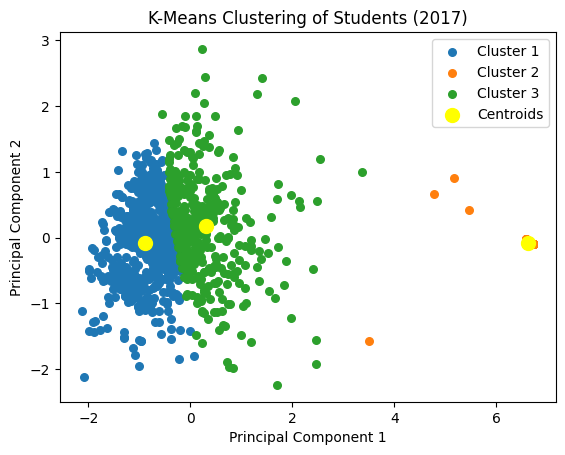

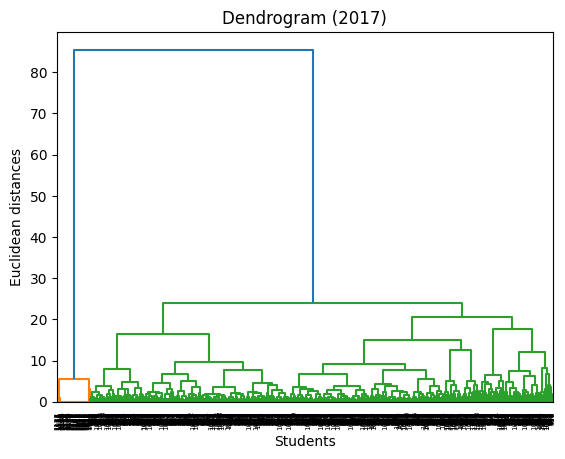

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2017 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.28355112871026544
Davies-Bouldin Index: 0.9183506744191293
Calinski-Harabasz Index: 2785.1019831363283


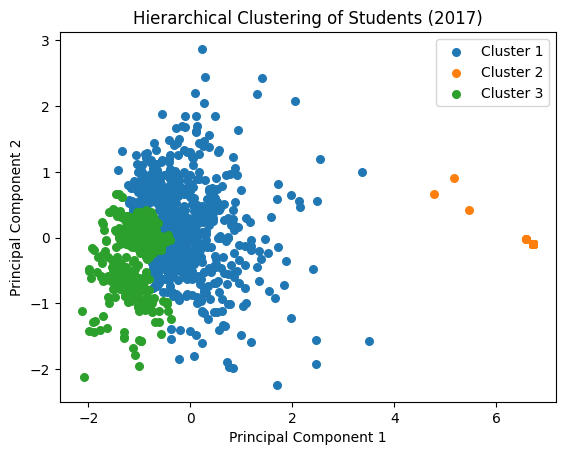

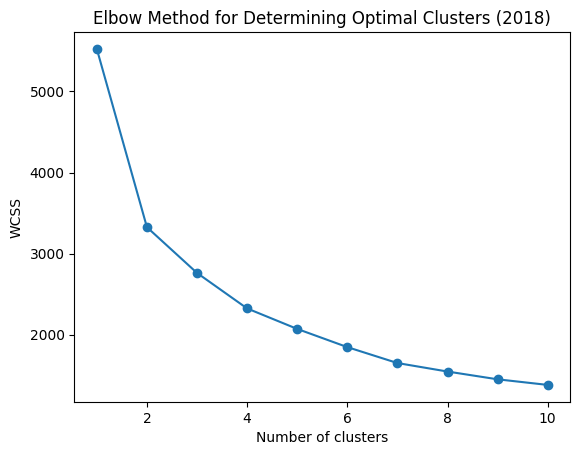

Year: 2018 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.4702647606299954
Davies-Bouldin Index: 0.7814447099394254
Calinski-Harabasz Index: 1321.4905063925758


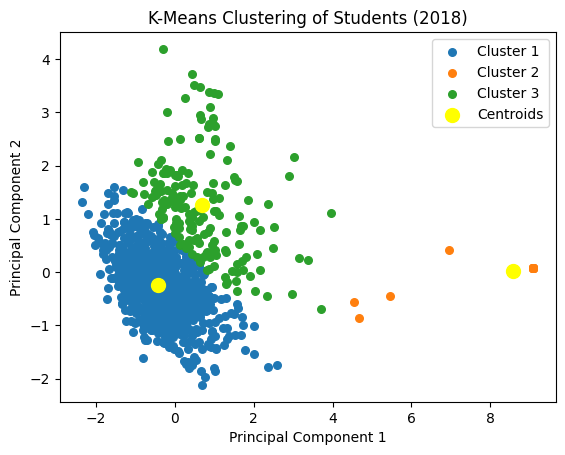

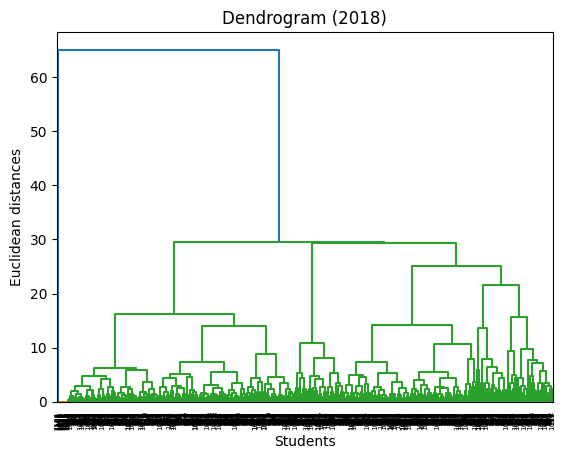

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2018 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.3773287285307898
Davies-Bouldin Index: 0.9834349772971184
Calinski-Harabasz Index: 1247.149241802295


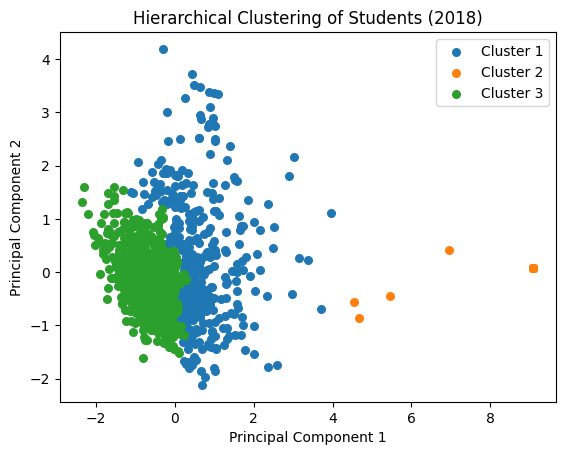

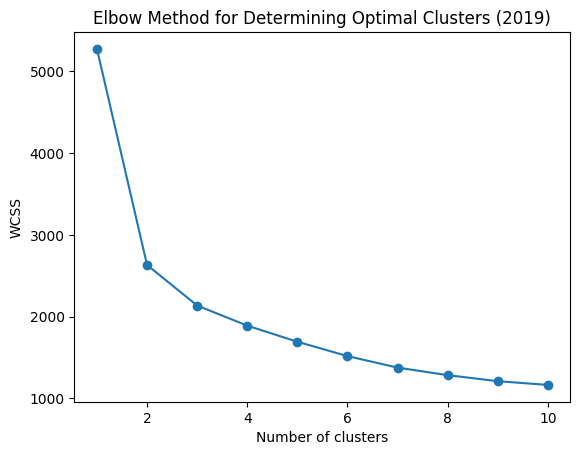

Year: 2019 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.3925860667813573
Davies-Bouldin Index: 0.8217369215894045
Calinski-Harabasz Index: 1930.478027404122


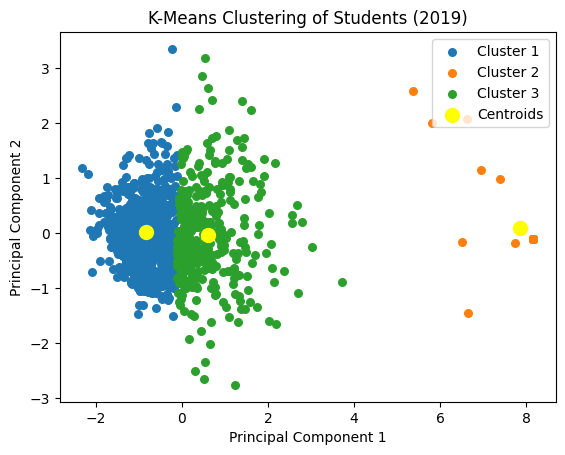

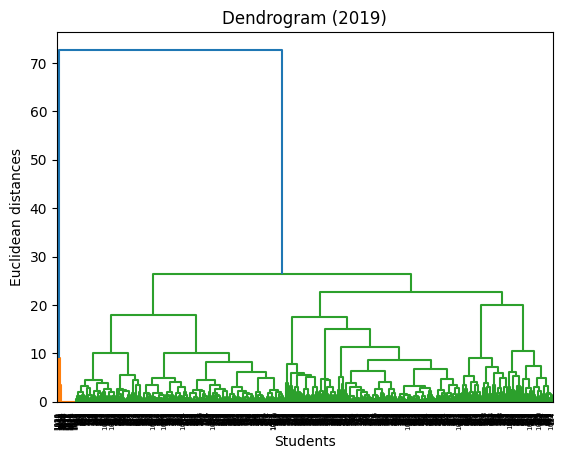

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2019 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.31297072843968965
Davies-Bouldin Index: 0.8852447125385156
Calinski-Harabasz Index: 1743.102351698106


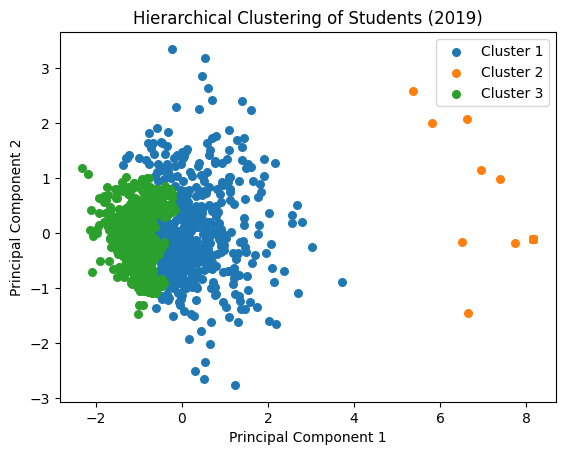

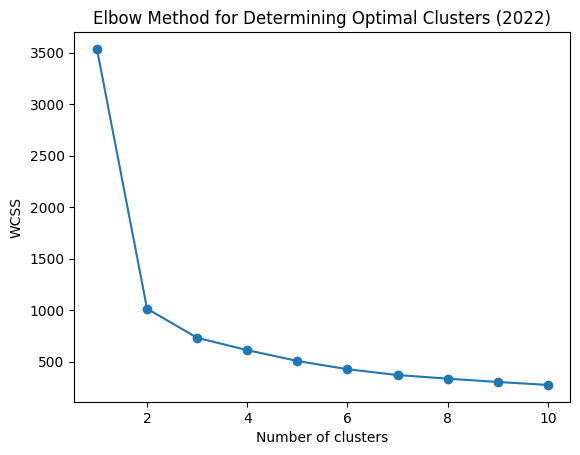

Year: 2022 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.5799457227364189
Davies-Bouldin Index: 0.7705345697892021
Calinski-Harabasz Index: 3263.025248275369


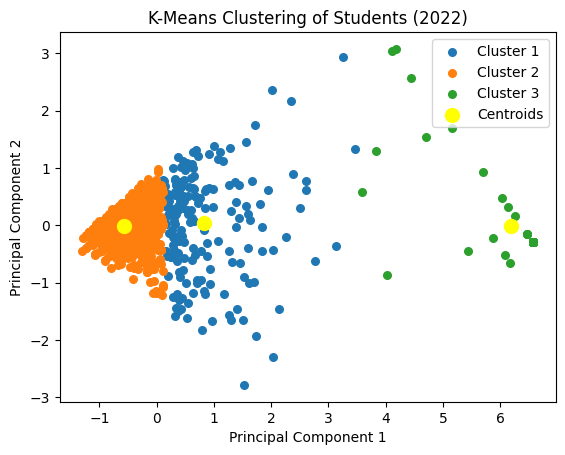

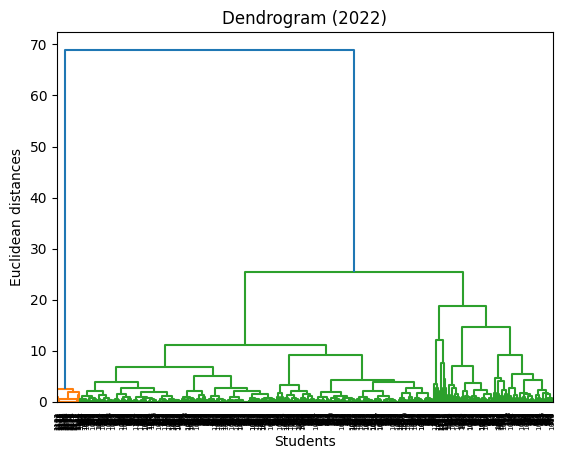

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2022 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.7139195510527852
Davies-Bouldin Index: 0.5780418625000884
Calinski-Harabasz Index: 2734.3701876092214


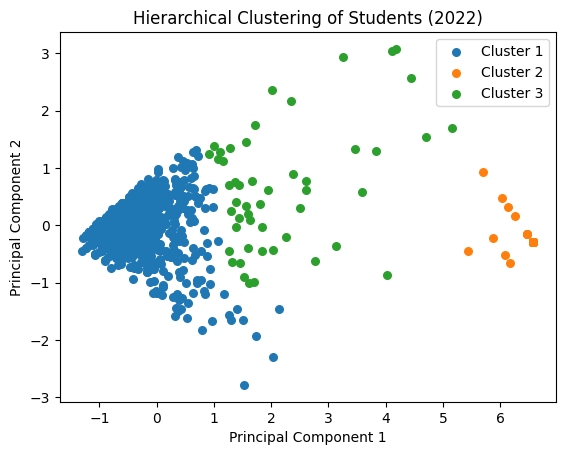

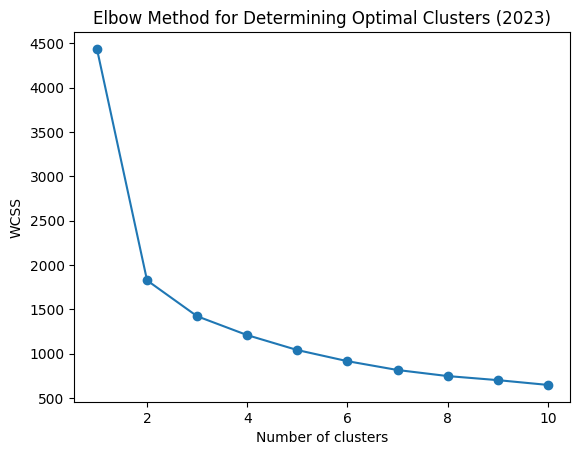

Year: 2023 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.4531321133045317
Davies-Bouldin Index: 0.7763463706657463
Calinski-Harabasz Index: 2207.377101501085


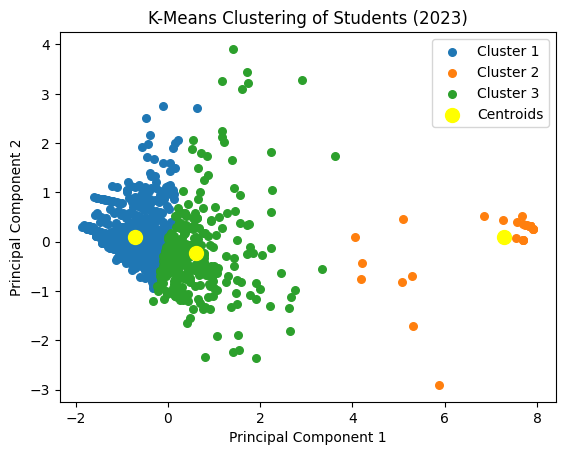

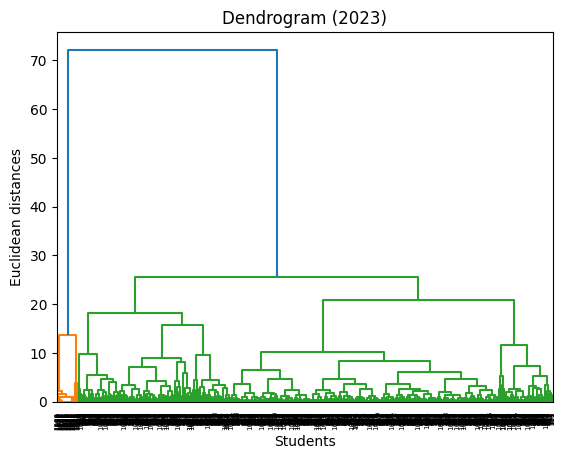

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2023 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.48714418397220427
Davies-Bouldin Index: 0.8598485095990922
Calinski-Harabasz Index: 2056.097130601047


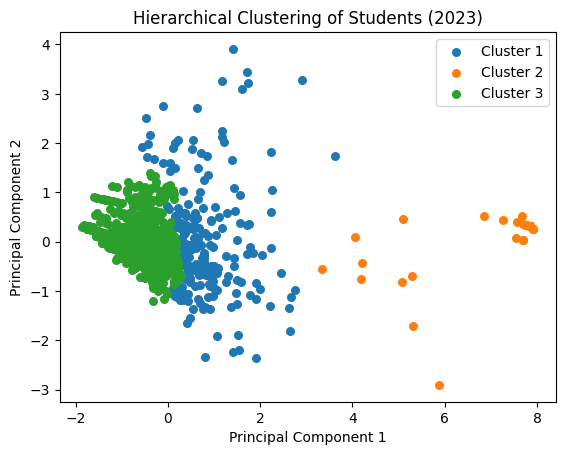

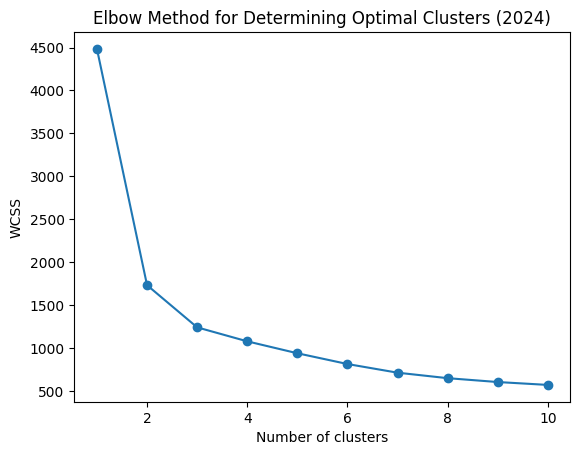

Year: 2024 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.49456195764542965
Davies-Bouldin Index: 0.7317415918728907
Calinski-Harabasz Index: 2602.817237833857


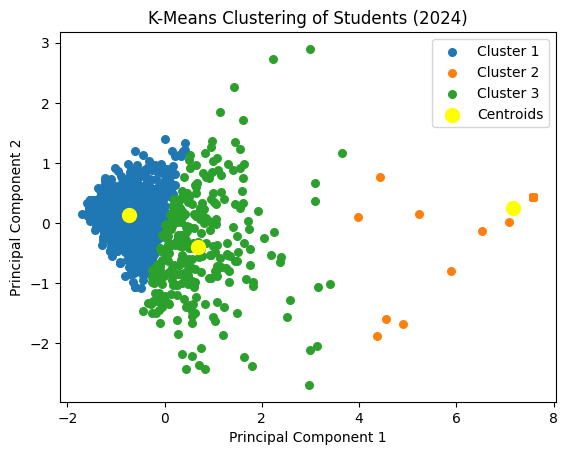

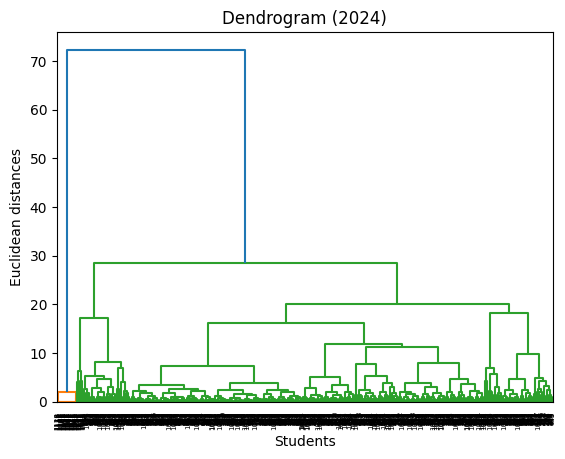

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2024 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.45094061904346355
Davies-Bouldin Index: 0.7271999238166041
Calinski-Harabasz Index: 2213.341807777722


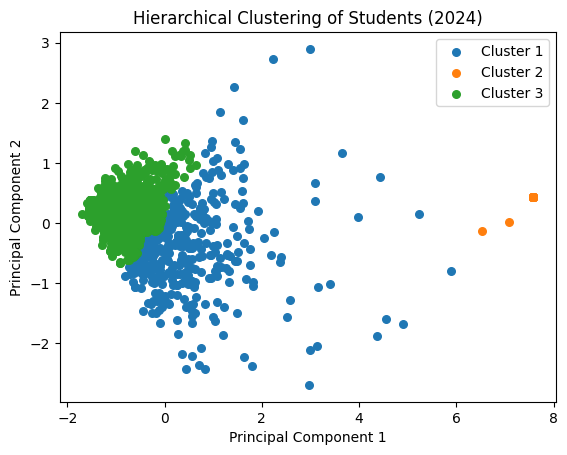

In [ ]:
weekly_features = ['Week1_AP', 'Week2_AP', 'Week3_AP', 'Week4_AP', 'Week5_AP']
for year in dataset_years:
  extensive_clustering_analysis(datasets[year], weekly_features, year)


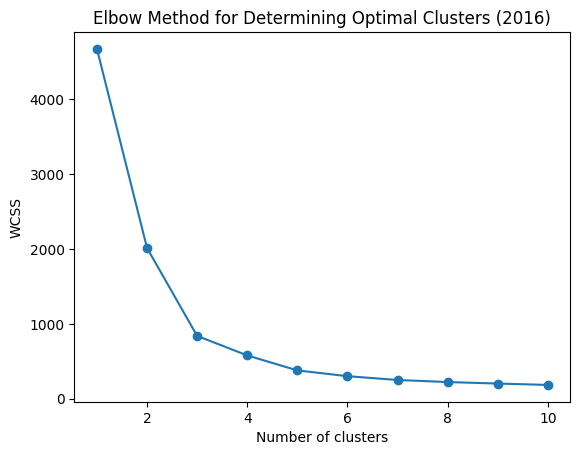

Year: 2016 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.8777013388200432
Davies-Bouldin Index: 0.2169720340761058
Calinski-Harabasz Index: 4354.325119749299


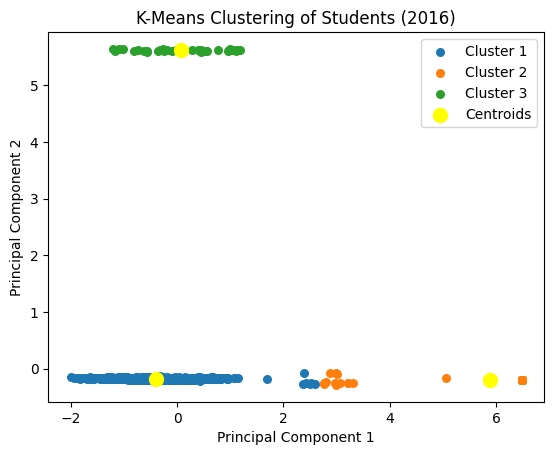

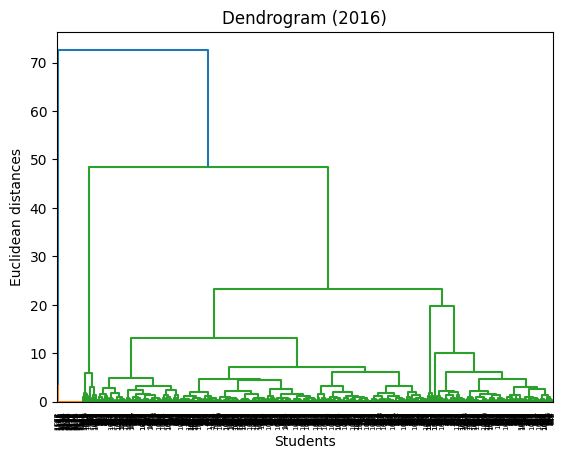

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2016 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.878770631856913
Davies-Bouldin Index: 0.15202688852422067
Calinski-Harabasz Index: 4191.880241176202


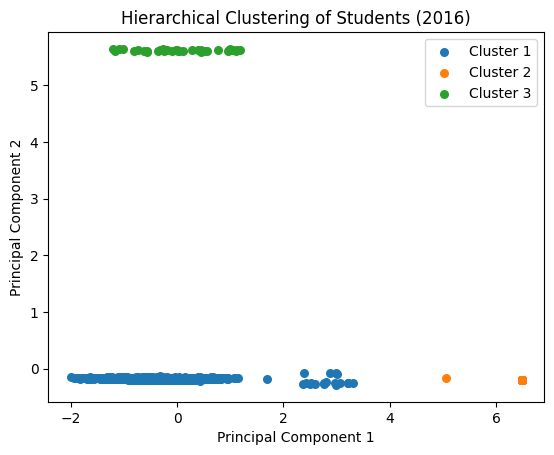

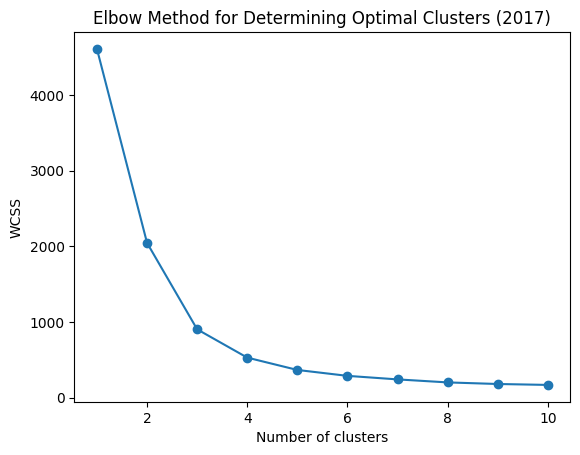

Year: 2017 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.8797969909032601
Davies-Bouldin Index: 0.17733821308697326
Calinski-Harabasz Index: 4814.203998169931


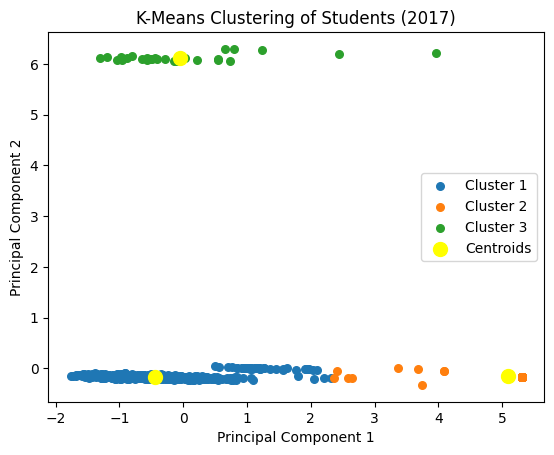

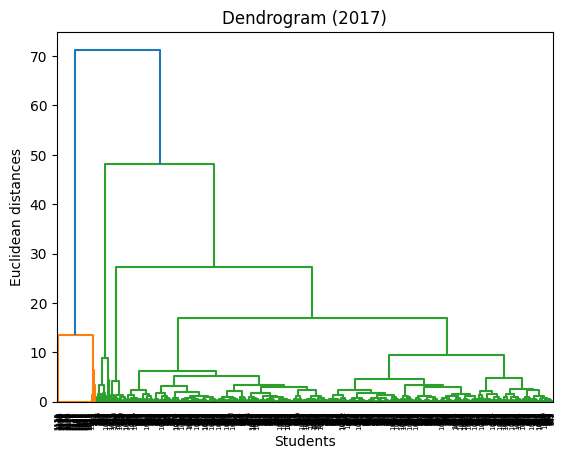

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2017 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.8817742302012438
Davies-Bouldin Index: 0.16817074862876147
Calinski-Harabasz Index: 4737.65173973935


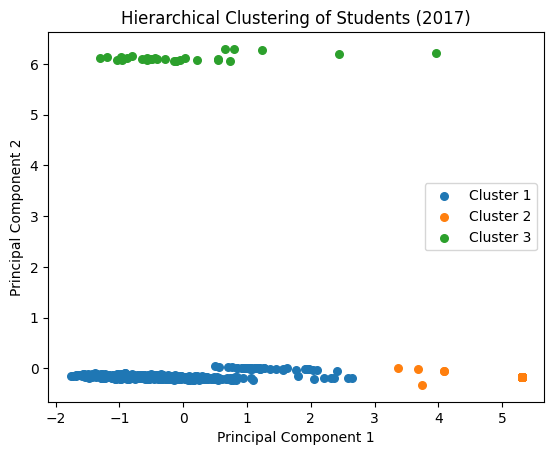

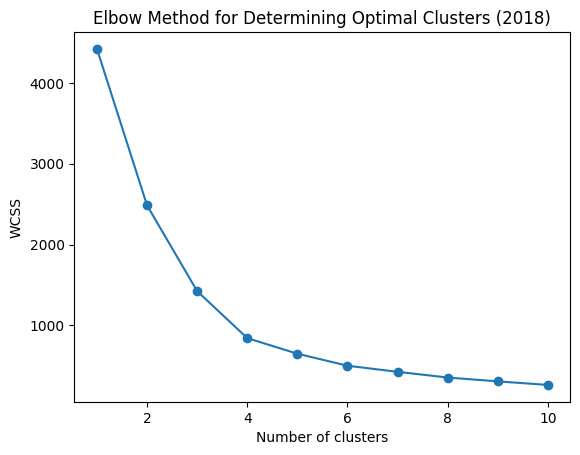

Year: 2018 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.8610666703434884
Davies-Bouldin Index: 0.23153641715078163
Calinski-Harabasz Index: 2346.8100886638777


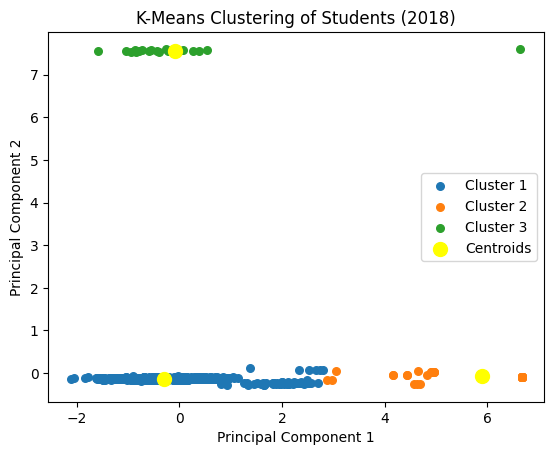

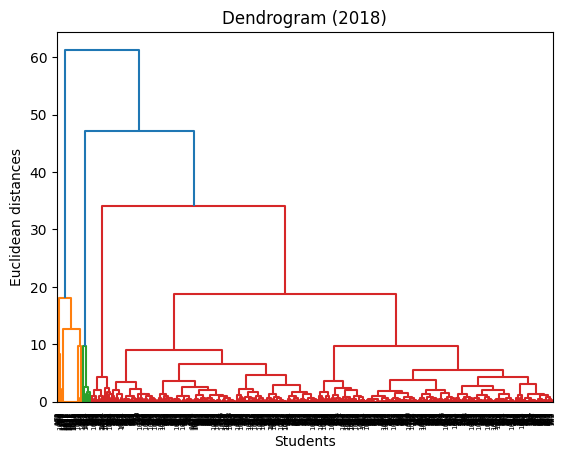

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2018 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.8647418481199829
Davies-Bouldin Index: 0.20284283011692814
Calinski-Harabasz Index: 2329.141155357989


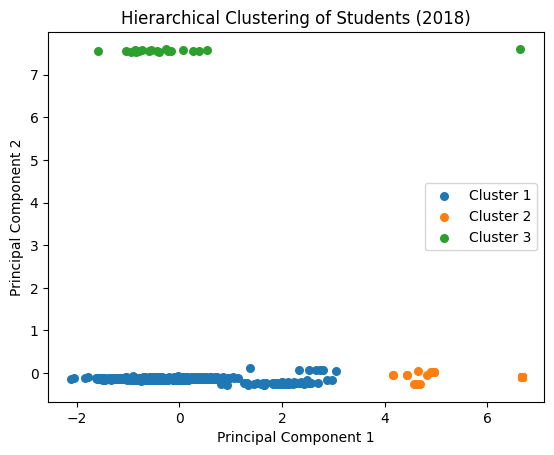

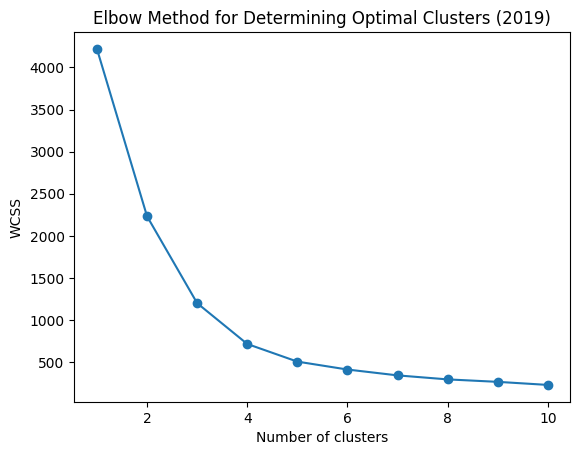

Year: 2019 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.862635900882909
Davies-Bouldin Index: 0.21647544509123387
Calinski-Harabasz Index: 2449.1109109265576


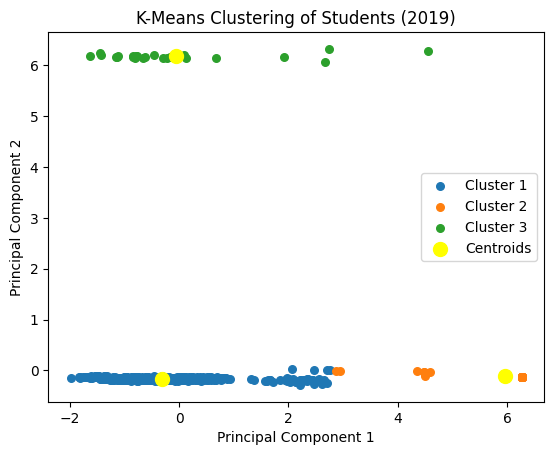

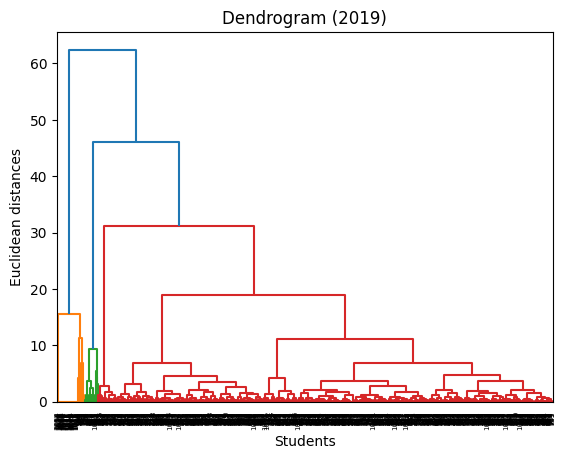

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2019 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.8646202916092174
Davies-Bouldin Index: 0.20908016052201808
Calinski-Harabasz Index: 2443.434919179086


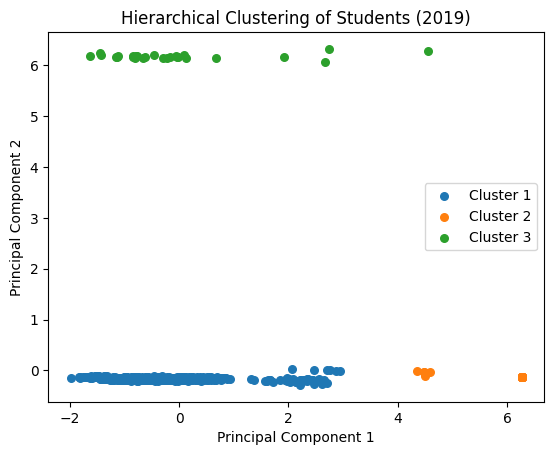

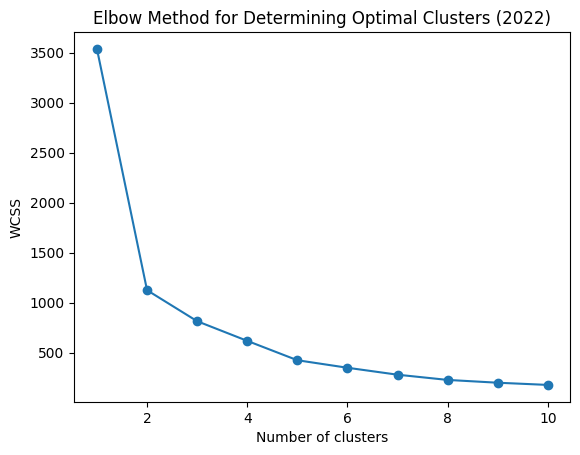

Year: 2022 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.7497905275041369
Davies-Bouldin Index: 0.7568418893908758
Calinski-Harabasz Index: 2680.363207529565


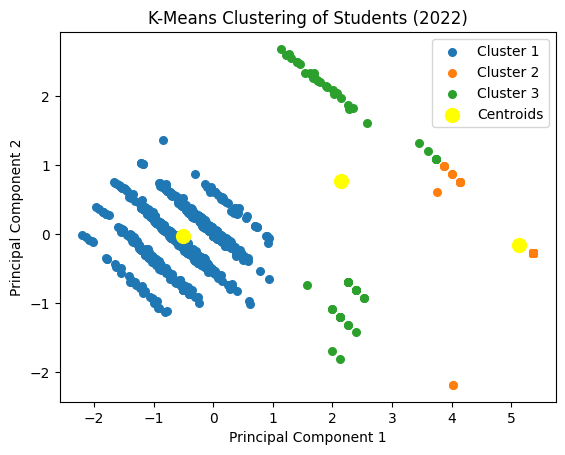

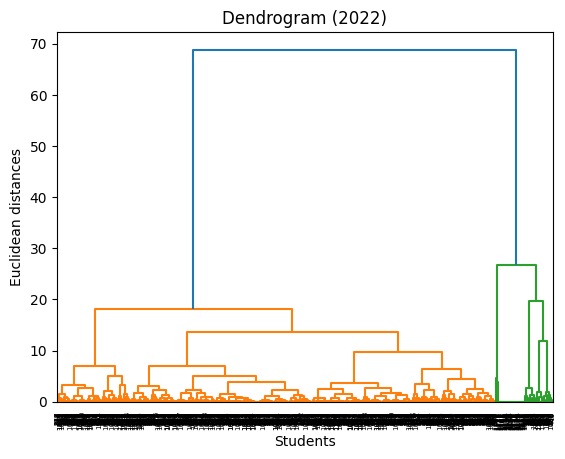

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2022 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.7469737178325405
Davies-Bouldin Index: 0.8337570055370103
Calinski-Harabasz Index: 2566.6317995115314


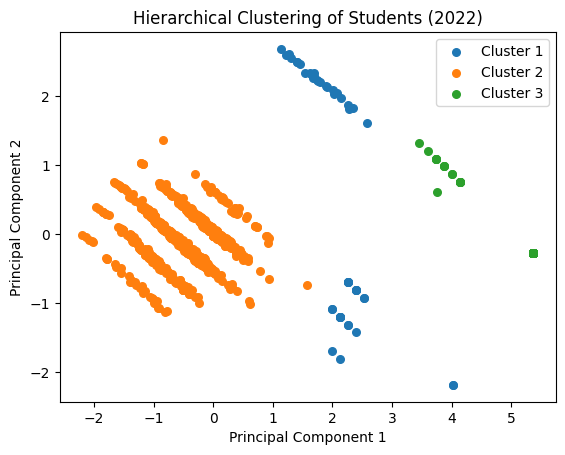

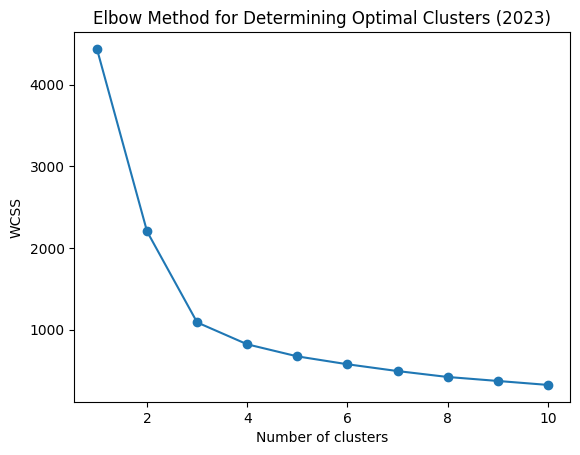

Year: 2023 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.8644579328288036
Davies-Bouldin Index: 0.24155503952108695
Calinski-Harabasz Index: 3285.26282976211


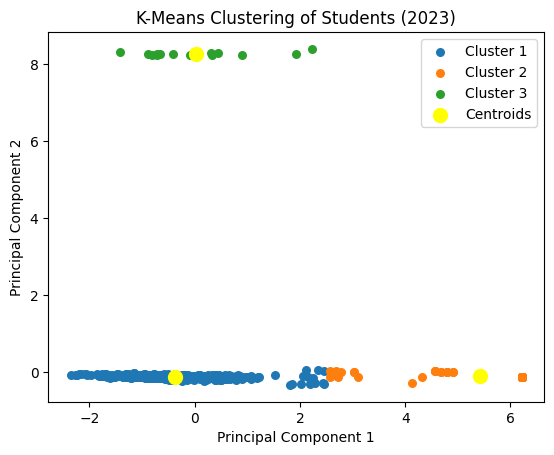

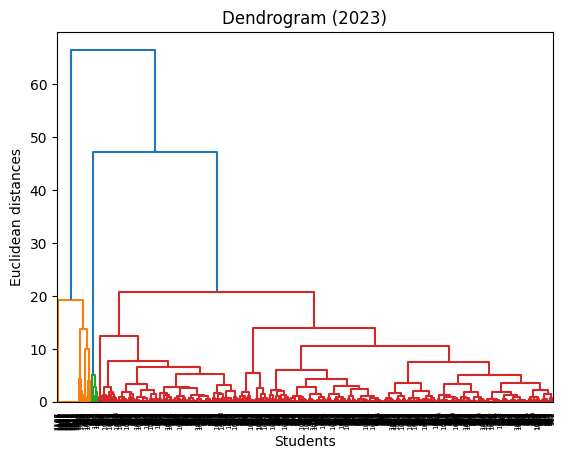

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2023 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.8726796782344991
Davies-Bouldin Index: 0.1583370096216361
Calinski-Harabasz Index: 3181.8544480084684


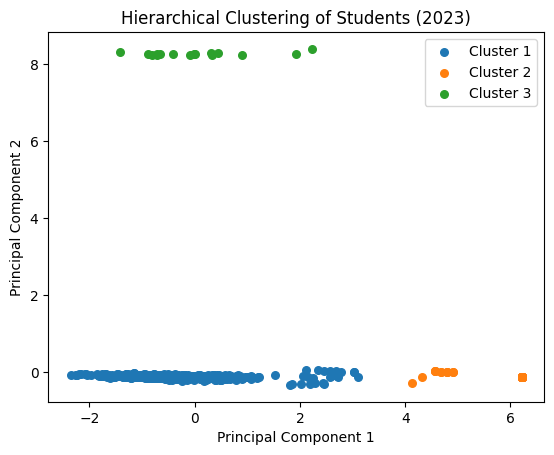

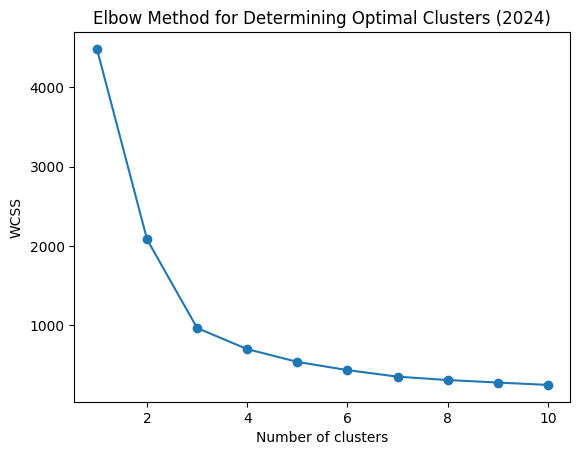

Year: 2024 | K-Means Clustering | Clusters: 3
Silhouette Score: 0.8207772405631621
Davies-Bouldin Index: 0.27126787332148944
Calinski-Harabasz Index: 3435.170368788349


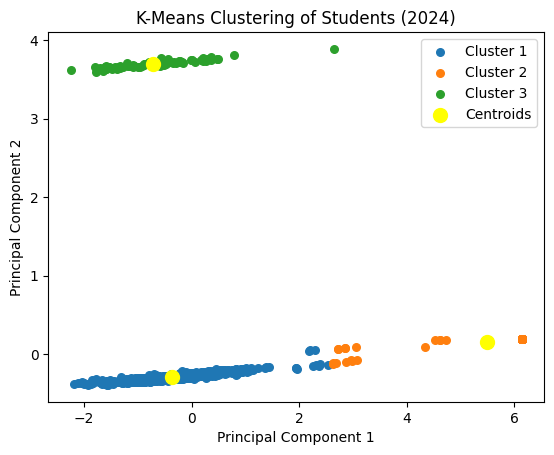

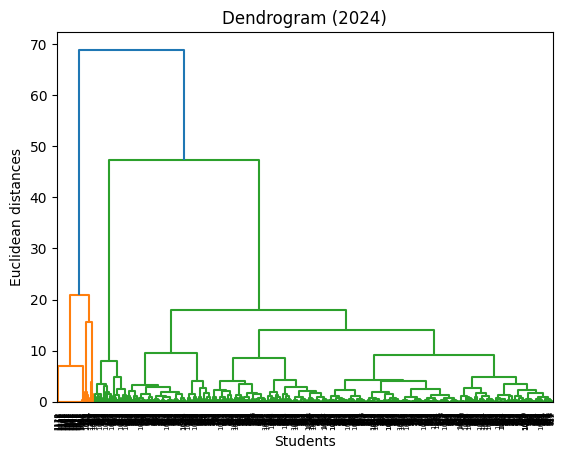

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Year: 2024 | Hierarchical Clustering | Clusters: 3
Silhouette Score: 0.8181191104144496
Davies-Bouldin Index: 0.23336642242663871
Calinski-Harabasz Index: 3296.550832926526


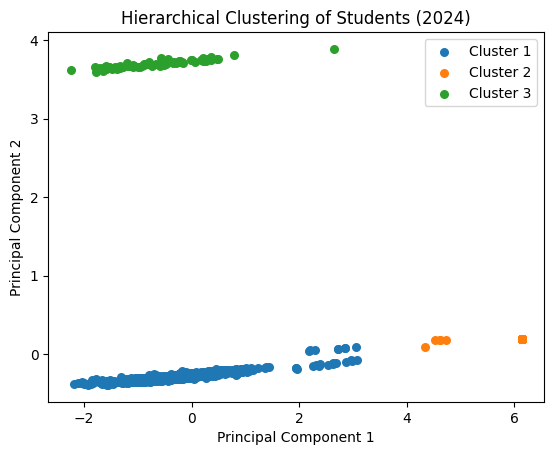

In [ ]:
total_features = ['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon']
for year in dataset_years:
  extensive_clustering_analysis(datasets[year], total_features, year)

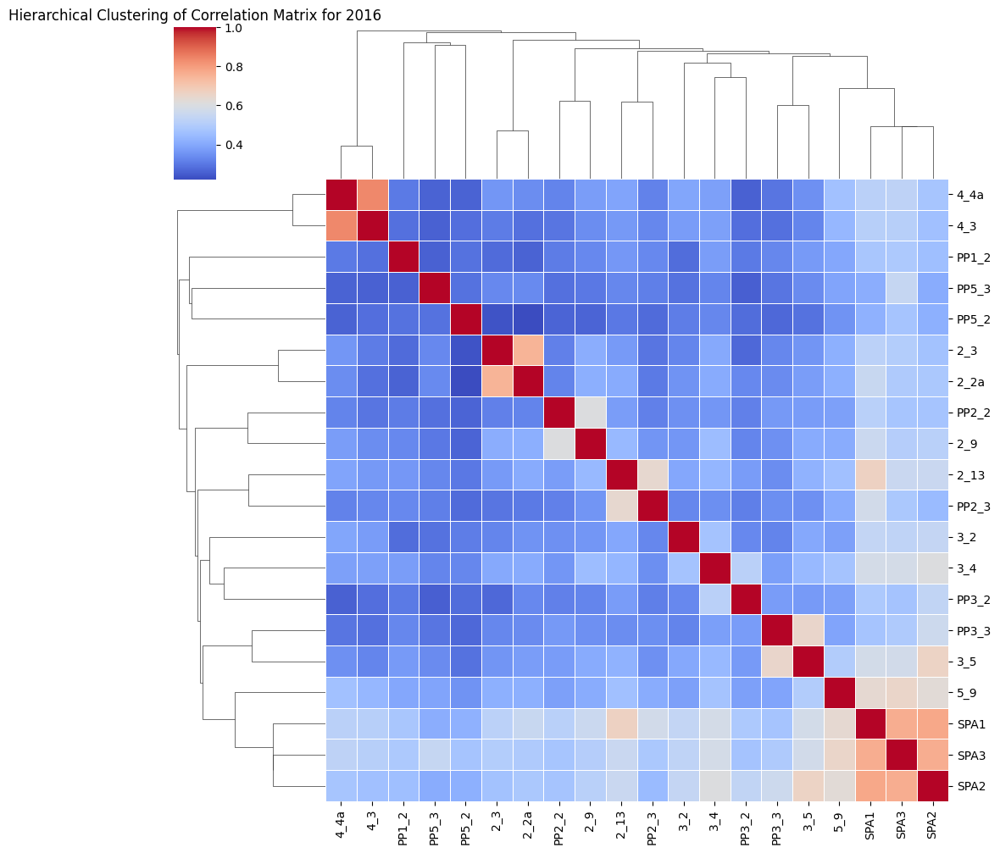

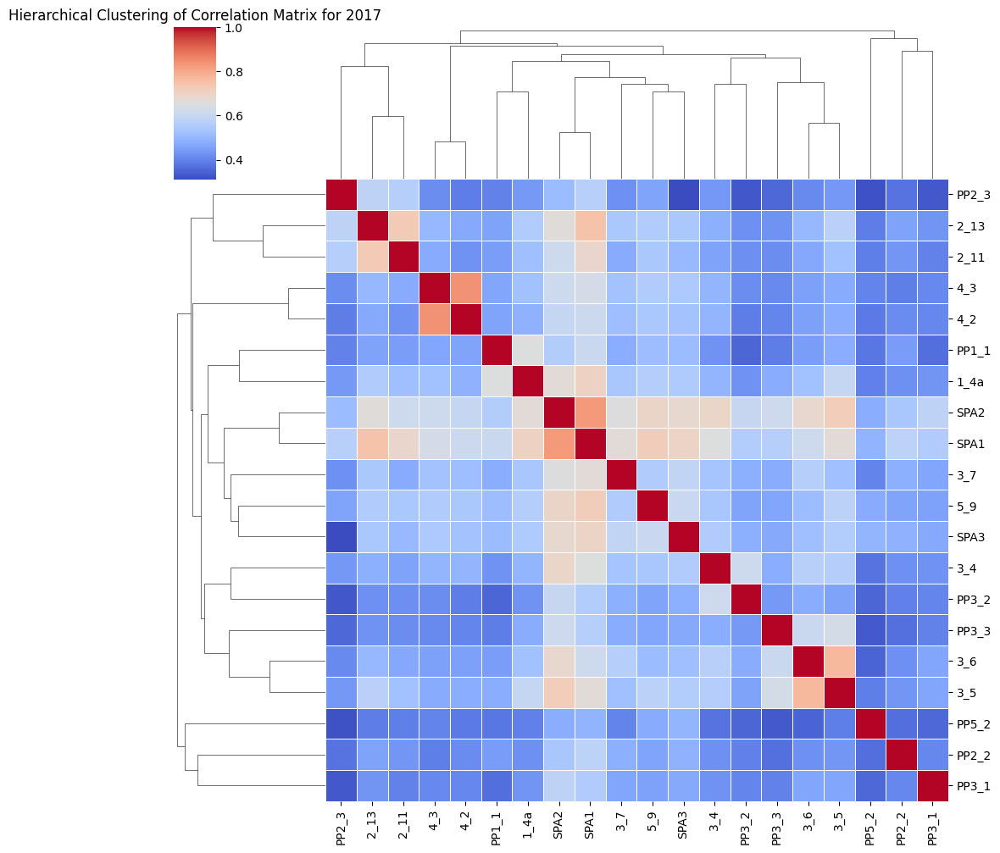

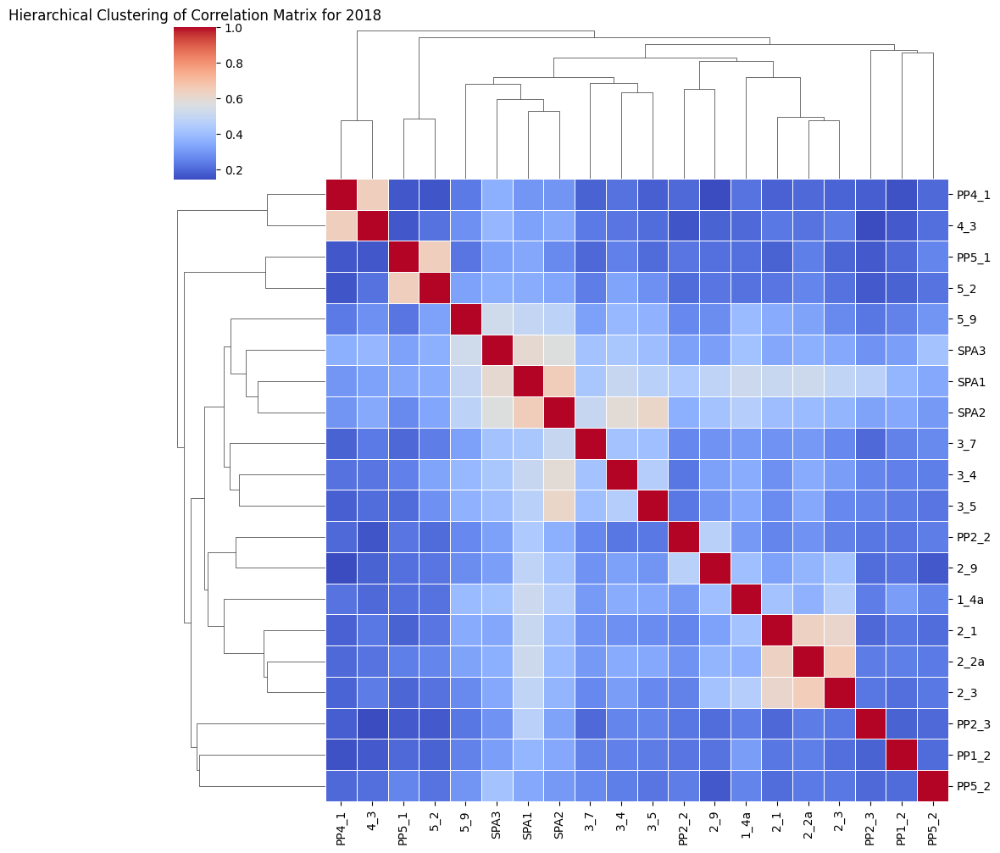

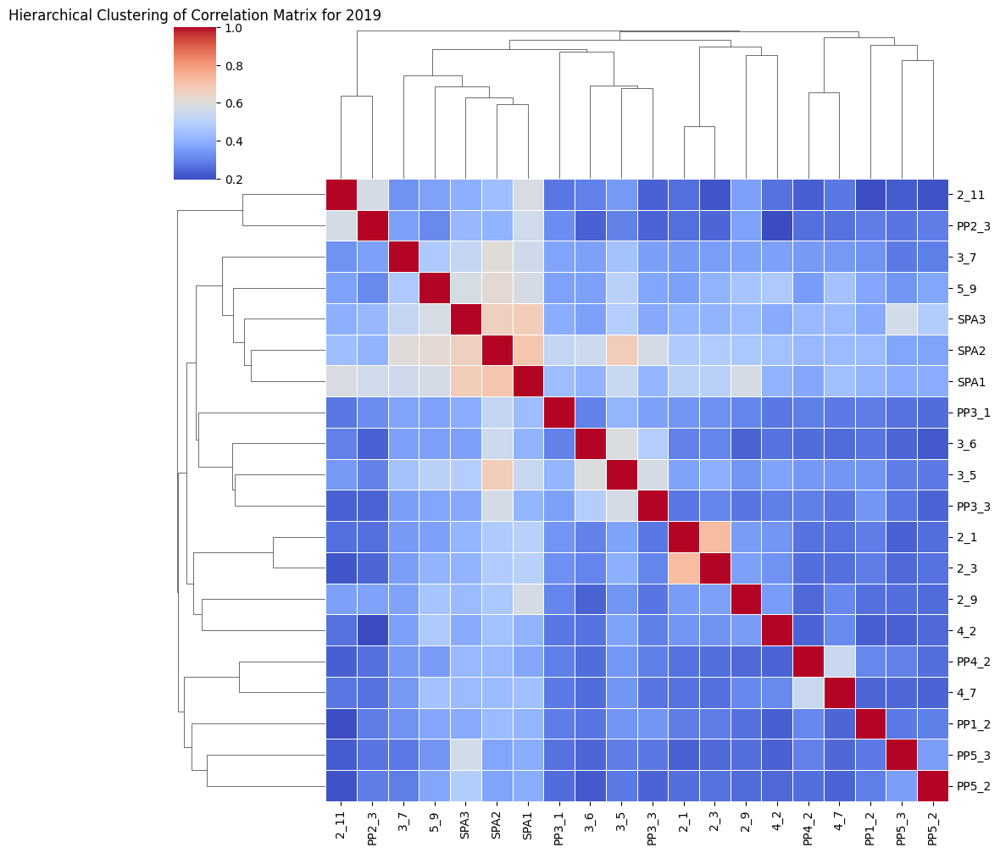

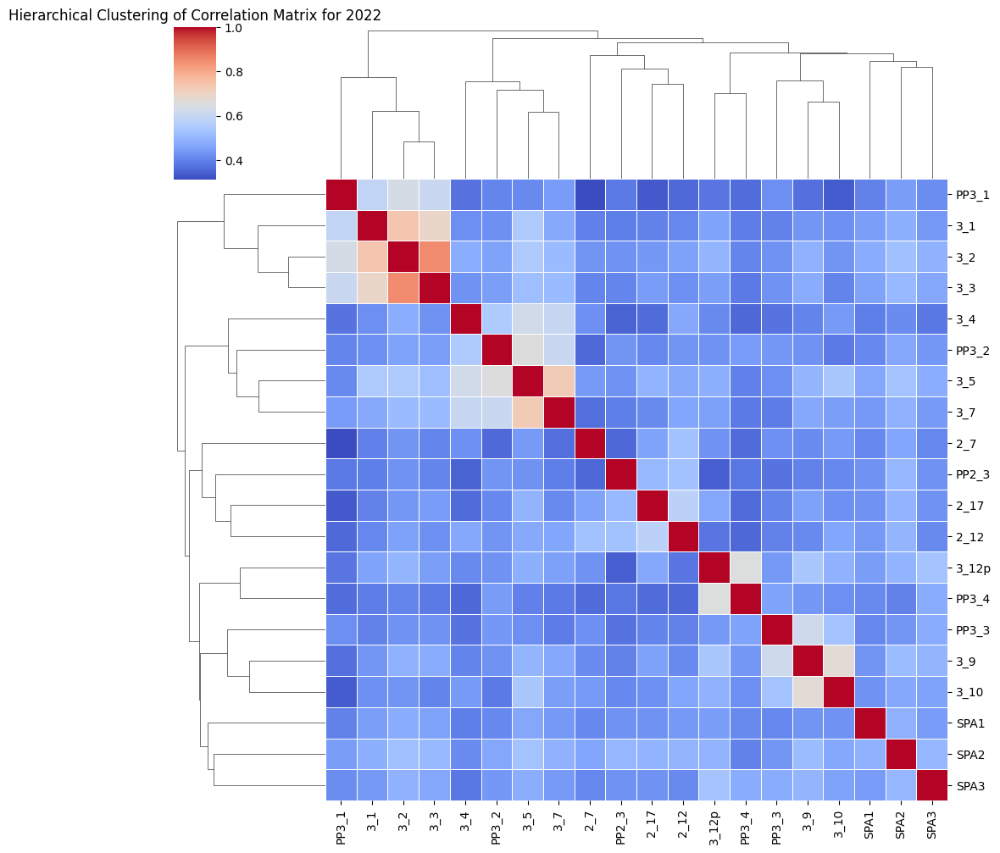

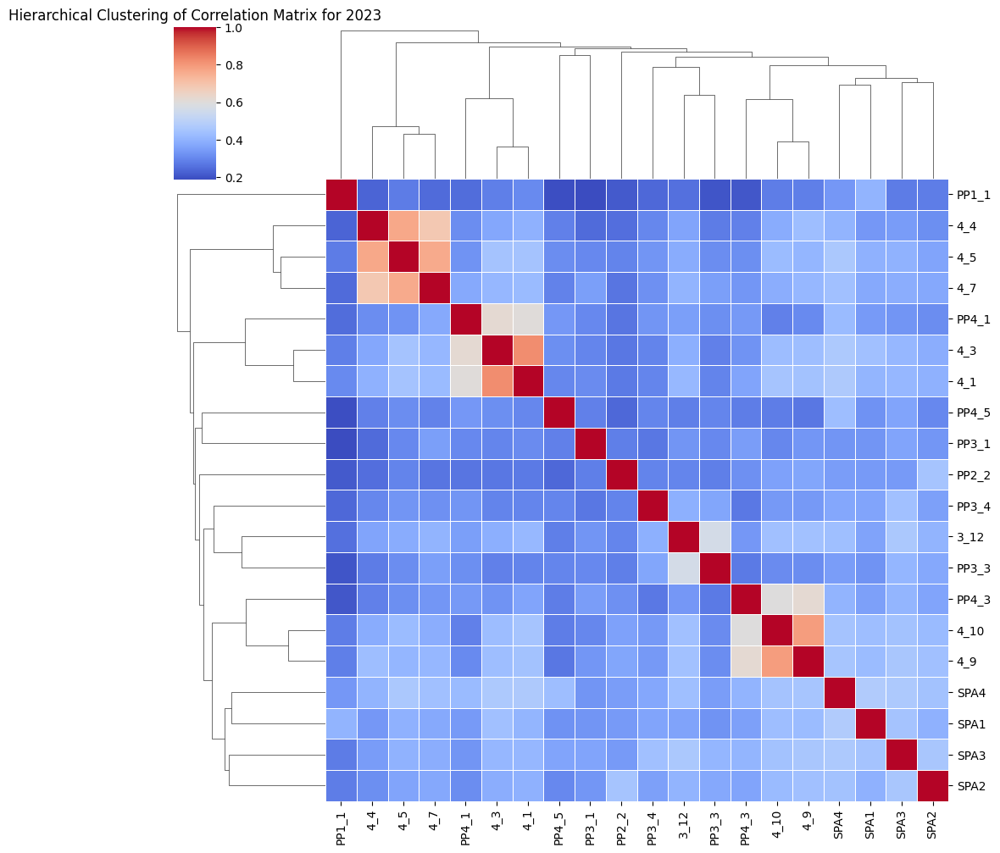

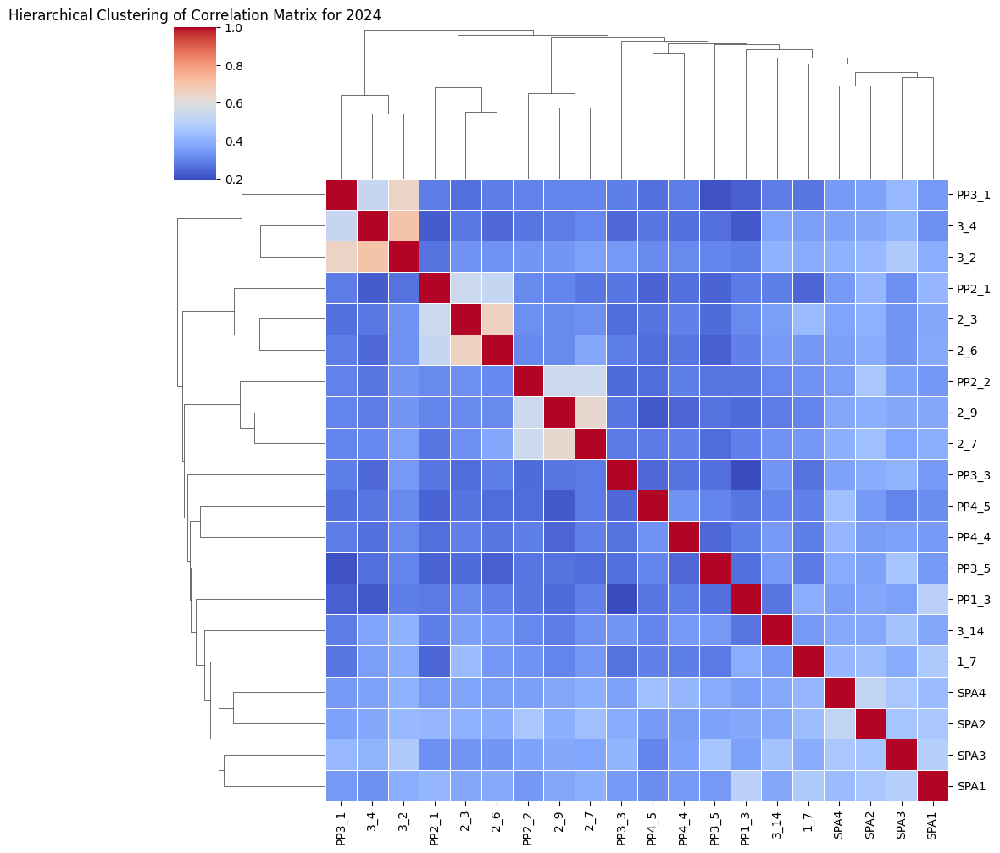

In [ ]:
# Clustering Analysis
for year in dataset_years:
    top_features = feature_selection(datasets[year], 'Passed')
    print_to_doc(doc, f"Top Features for {year}: {top_features}")
    hierarchical_clustering_heatmap(datasets[year], year, top_features)


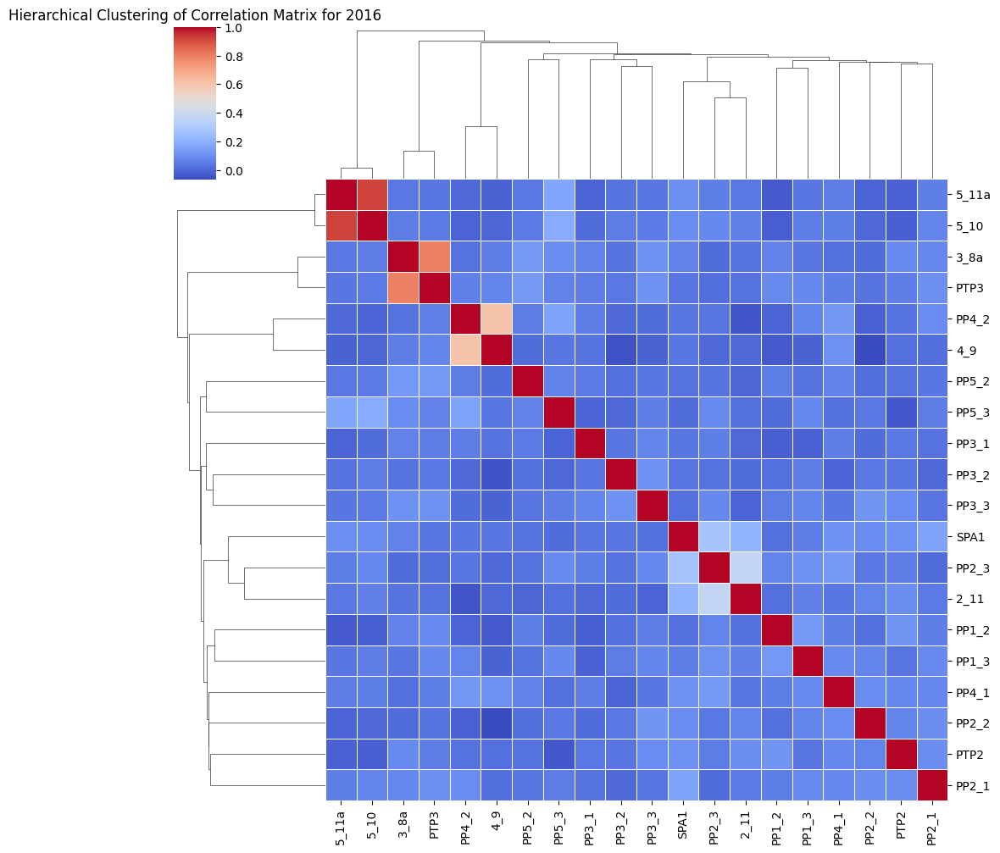

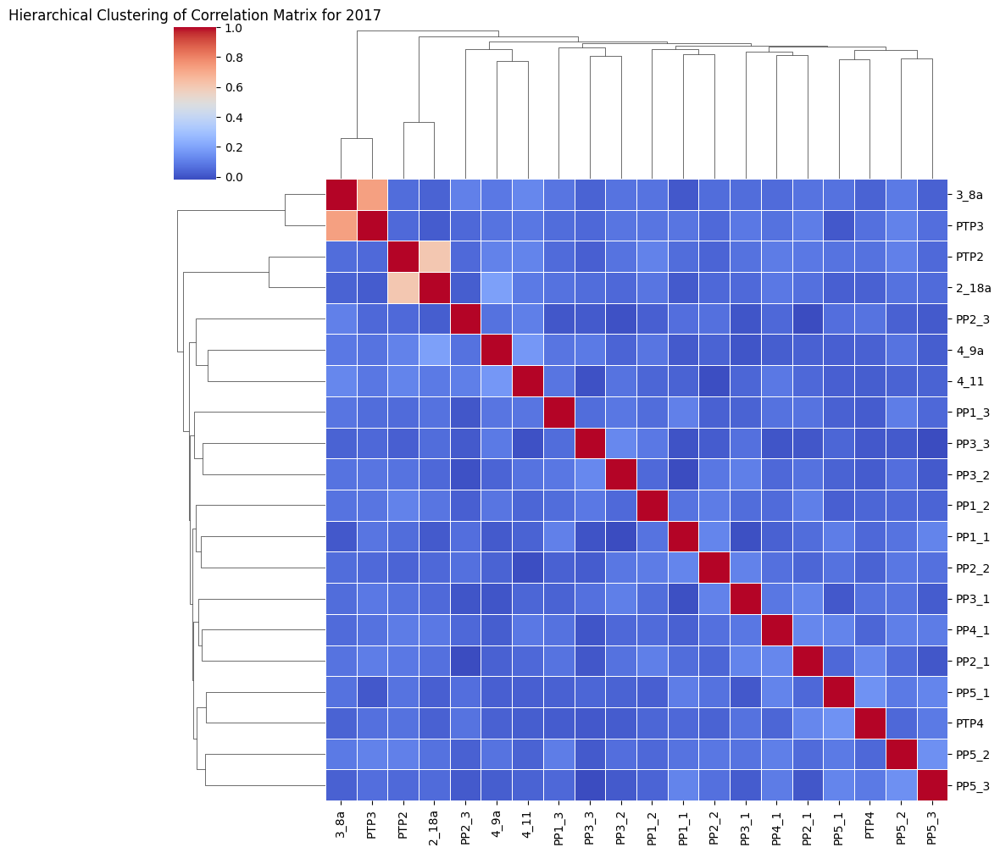

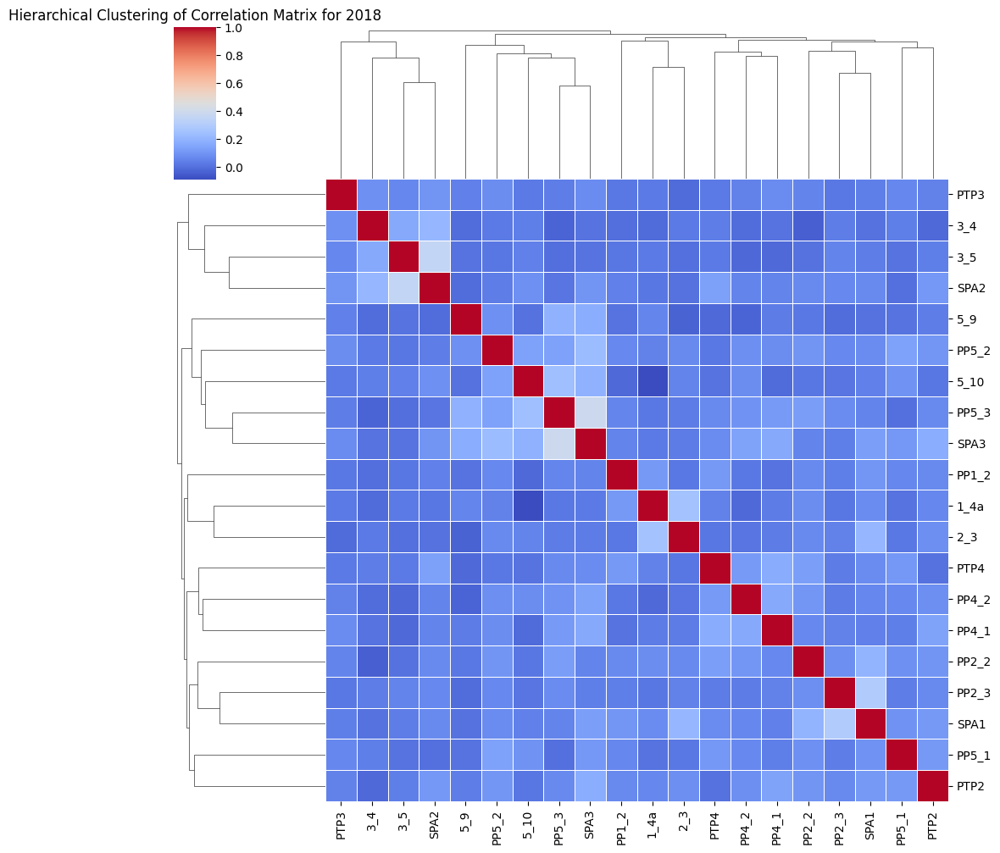

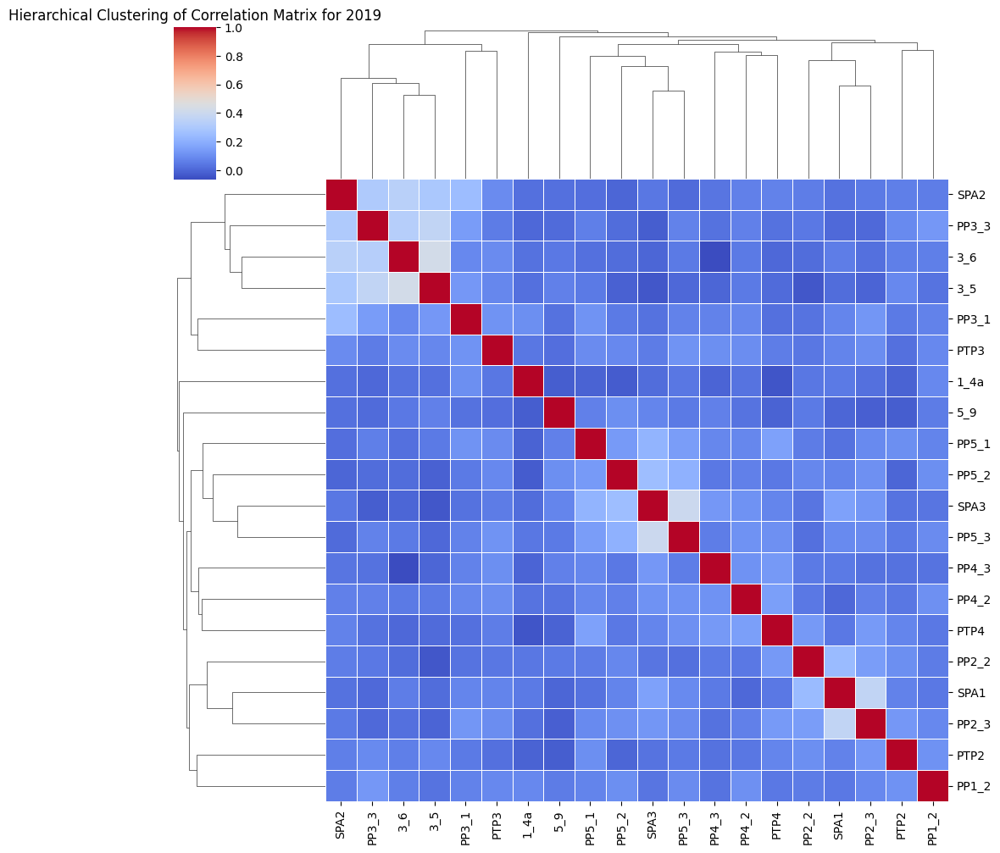

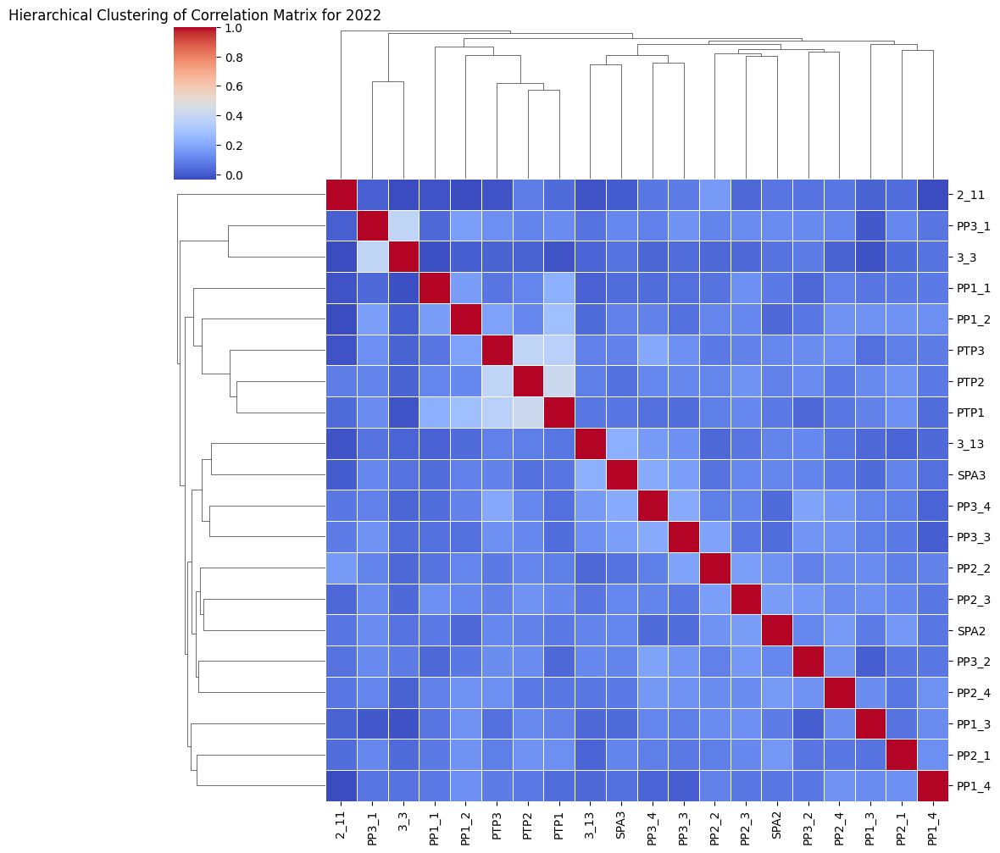

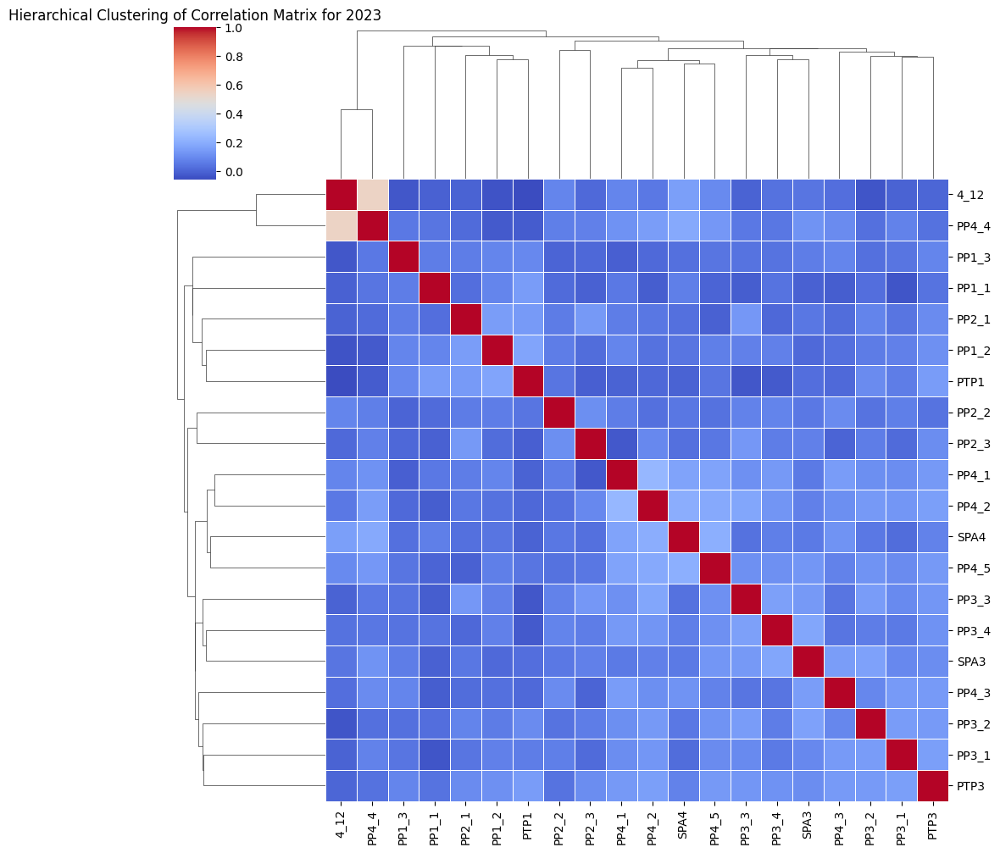

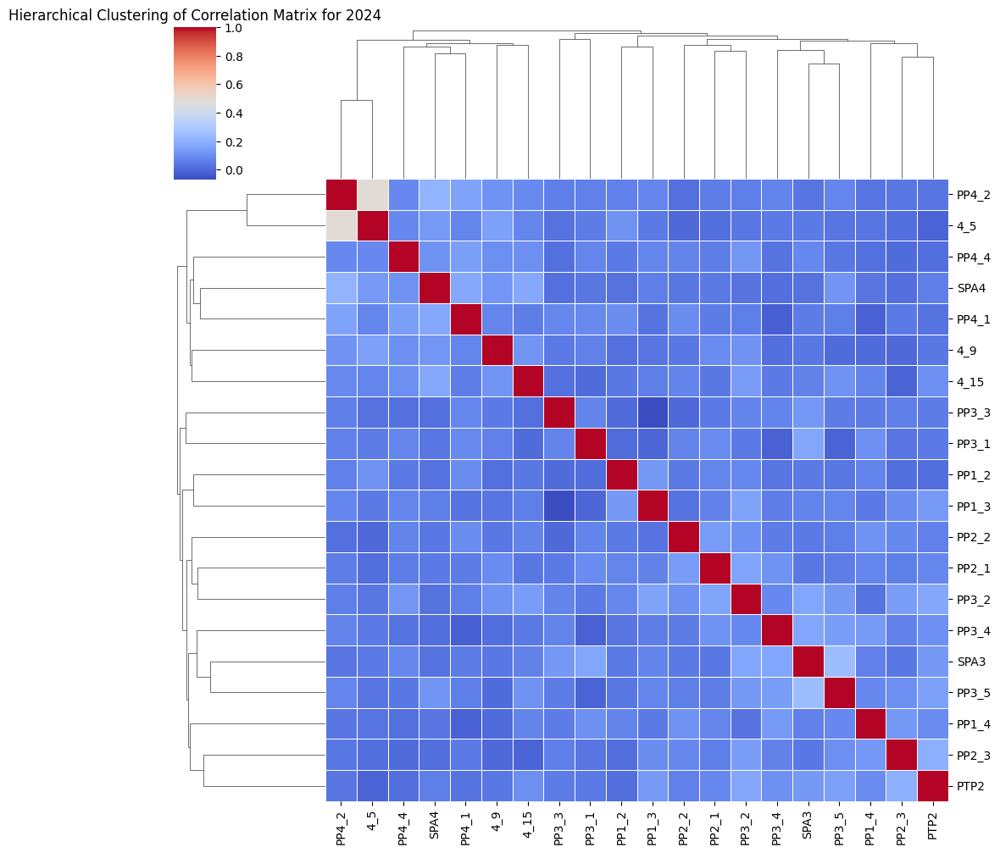

In [ ]:
# Clustering Analysis
for year in dataset_years:
    top_features = feature_selection(datasets[year], 'FinalGrade')
    print_to_doc(doc, f"Top Features for {year}: {top_features}")
    hierarchical_clustering_heatmap(datasets[year][datasets[year]['FinalGrade']>=10], year, top_features)


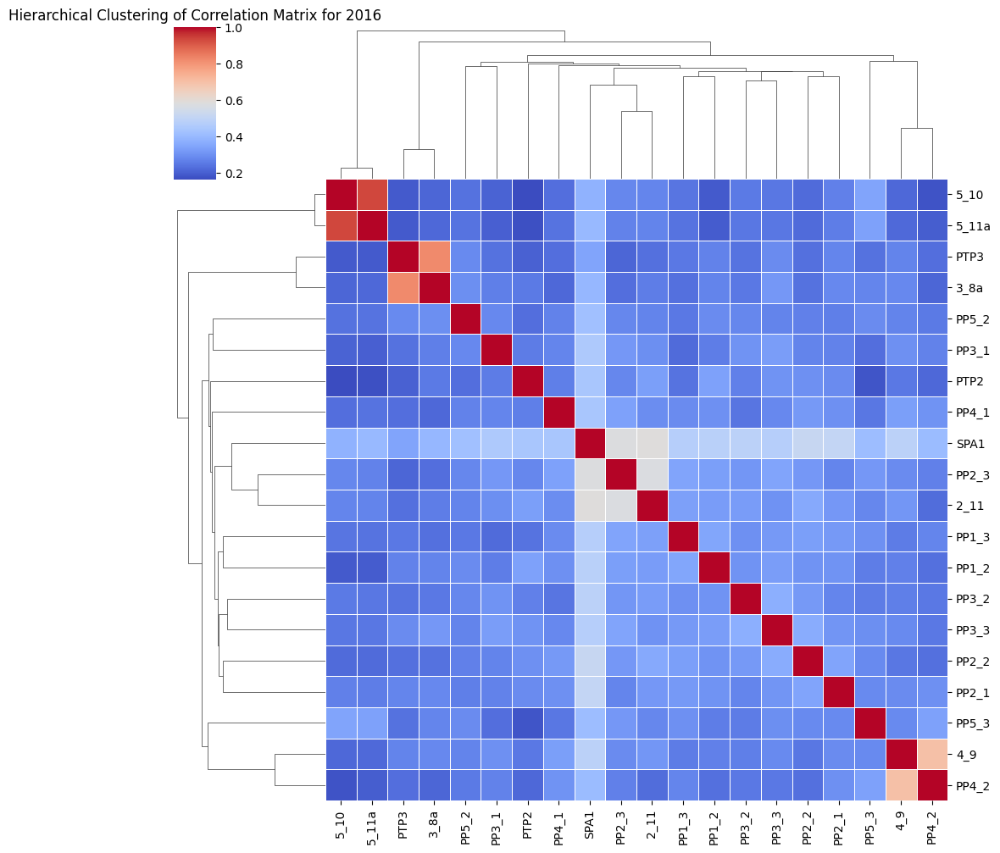

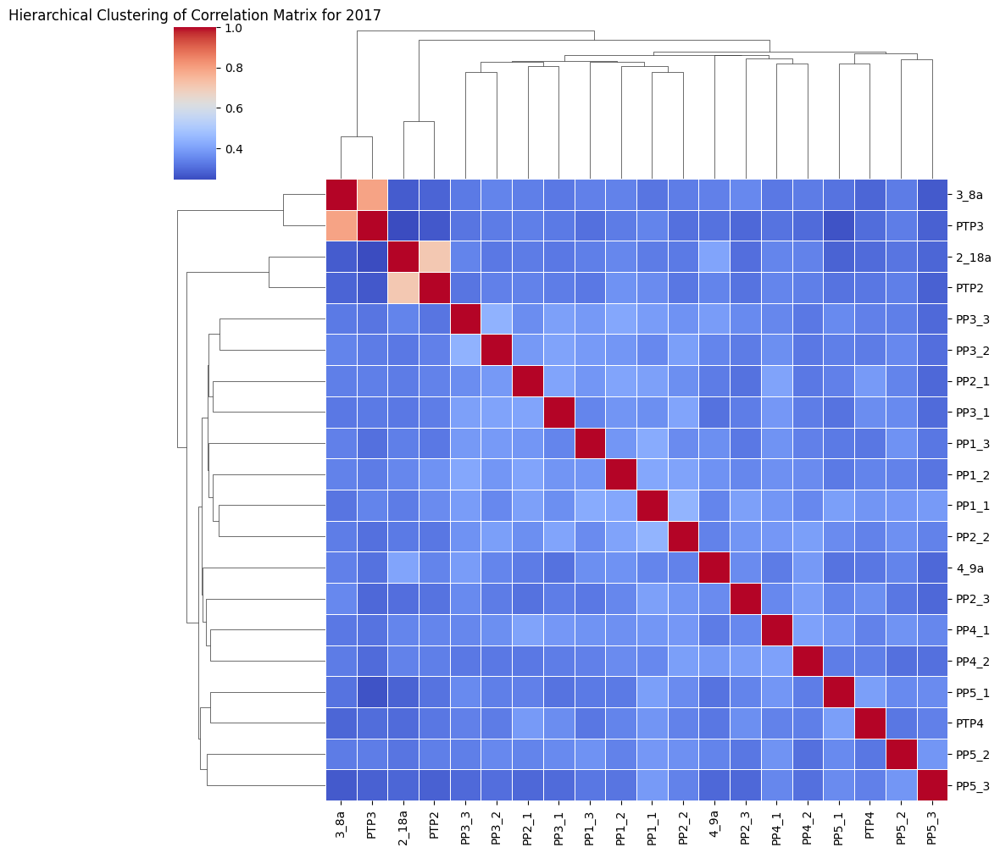

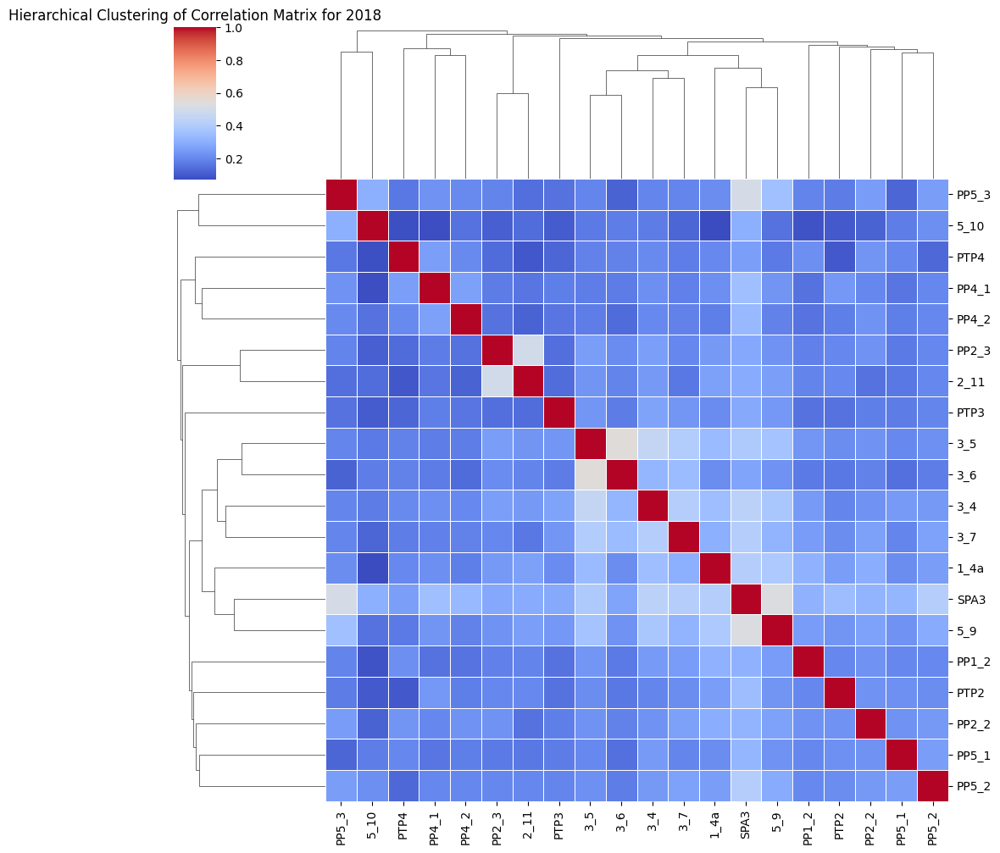

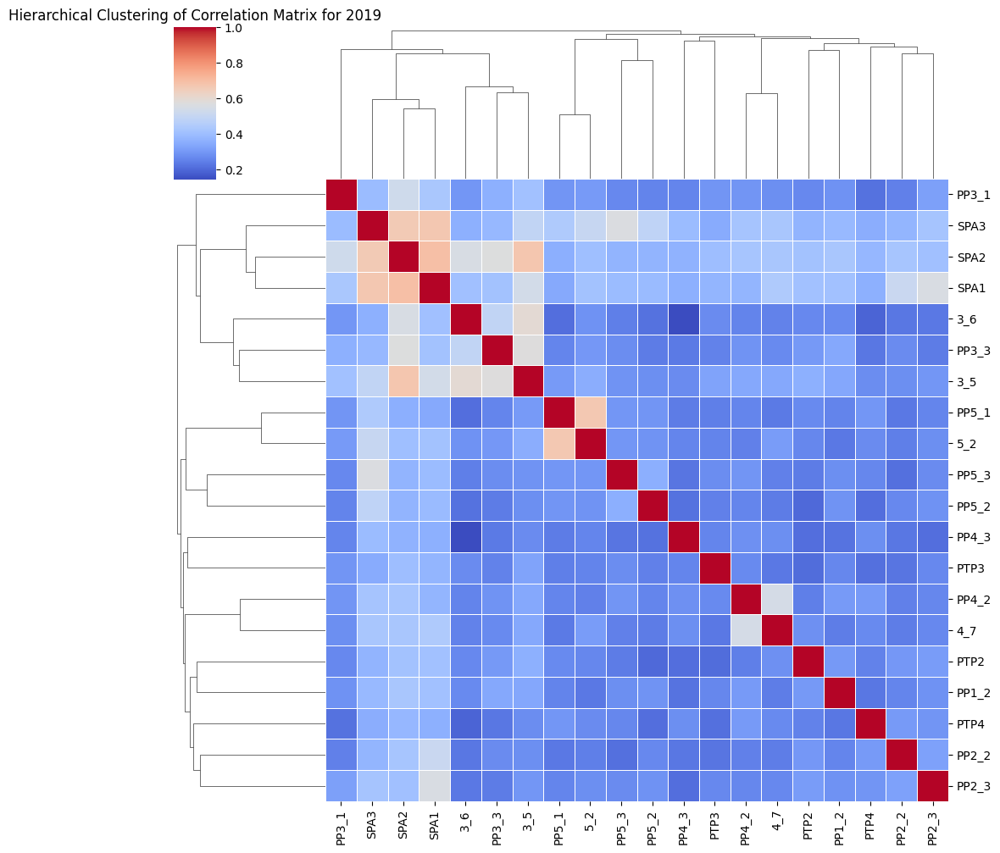

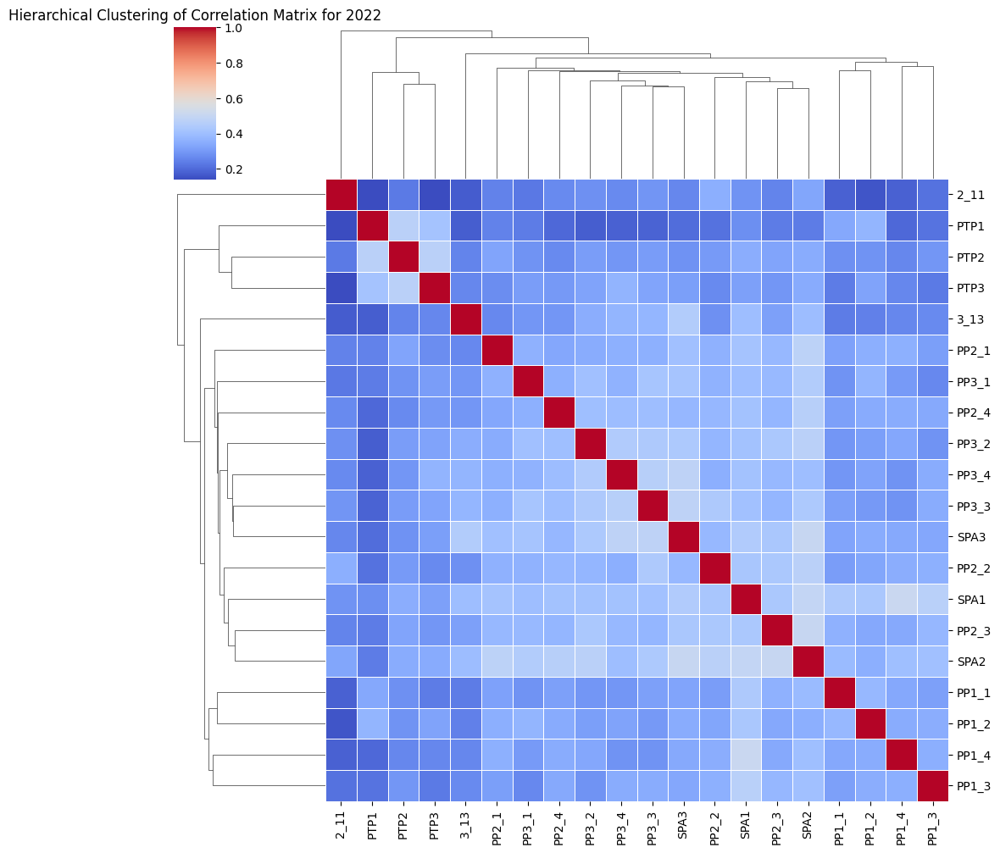

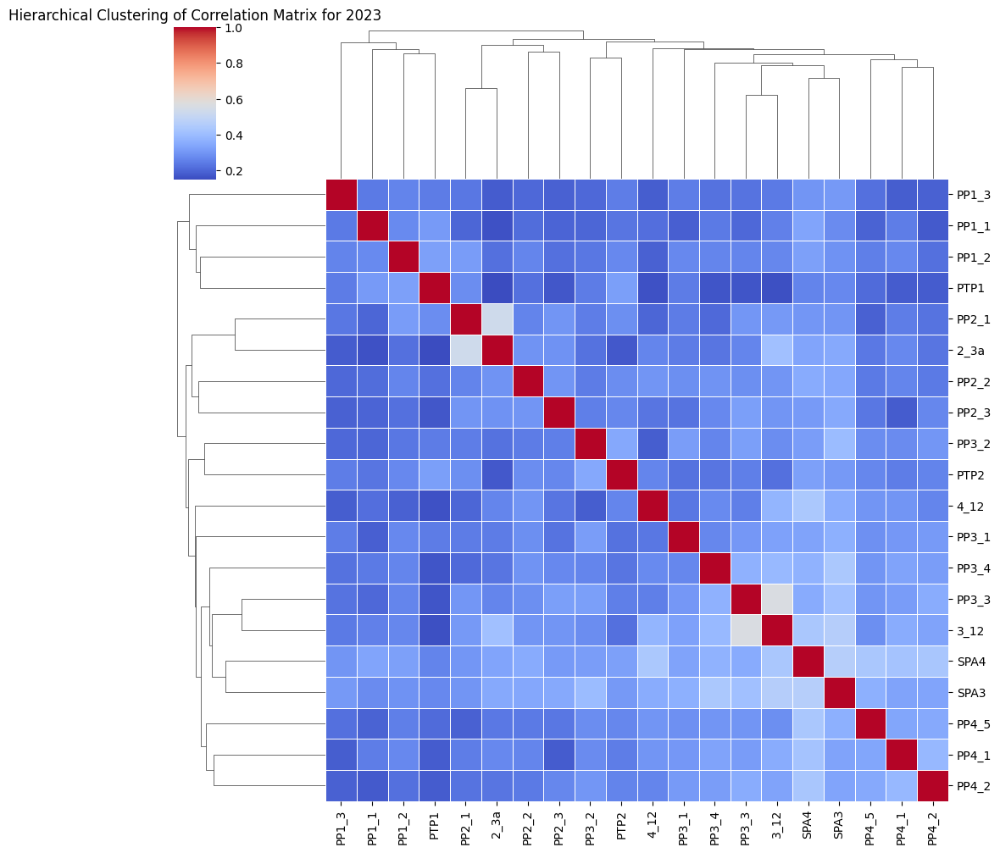

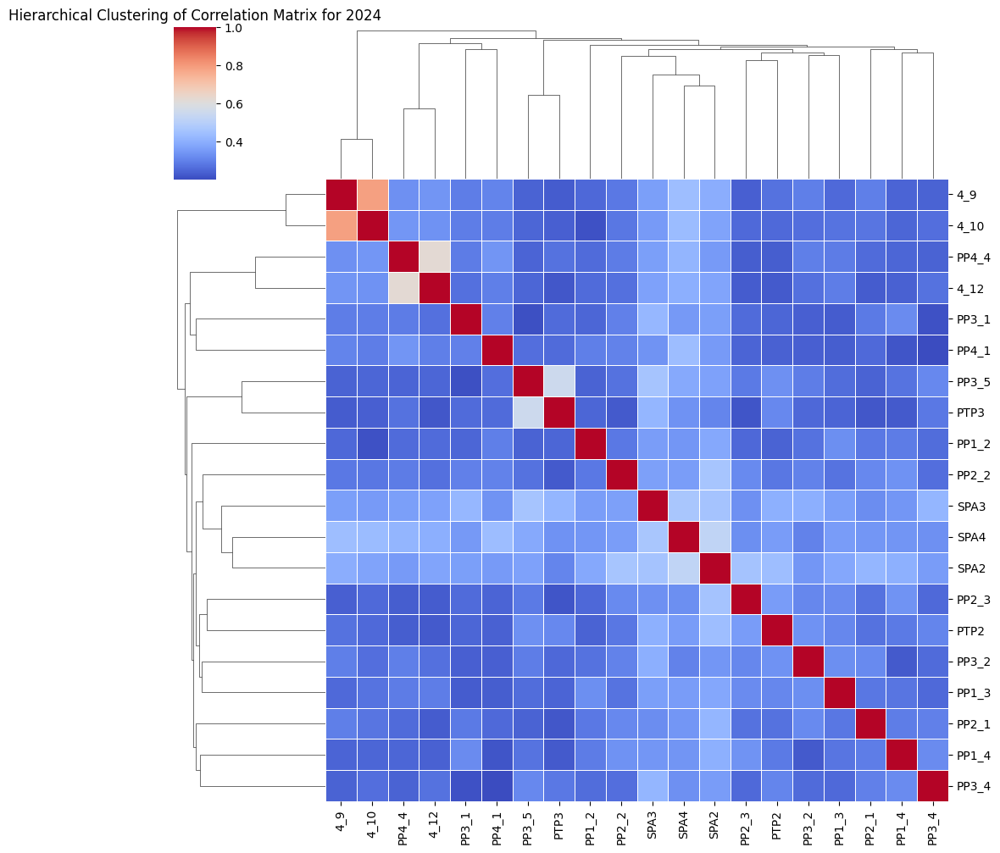

In [ ]:
# Clustering Analysis
for year in dataset_years:
    top_features = feature_selection(datasets[year], 'FinalGrade')
    print_to_doc(doc, f"Top Features for {year}: {top_features}")
    hierarchical_clustering_heatmap(datasets[year], year, top_features)

In [ ]:
doc.add_heading('RQ5: Can early performance in a specific theme or week of the course predict student outcomes in later themes or weeks? Furthermore, how predictive is early performance of the final grade achieved in the course?', 1)

### **RQ5:** Can early performance in a specific theme or week of the course predict student outcomes in later themes or weeks? Furthermore, how predictive is early performance of the final grade achieved in the course?


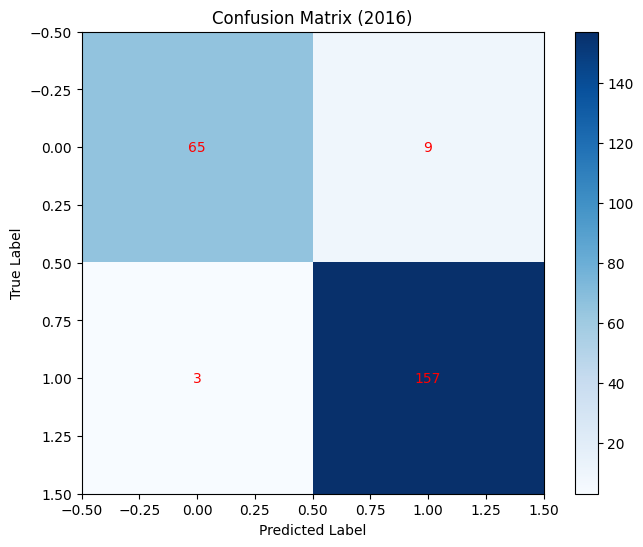

Logistic Regression Analysis for 2016:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs FinalGrade_binary:
Accuracy: 0.9487179487179487
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92        74
           1       0.95      0.98      0.96       160

    accuracy                           0.95       234
   macro avg       0.95      0.93      0.94       234
weighted avg       0.95      0.95      0.95       234




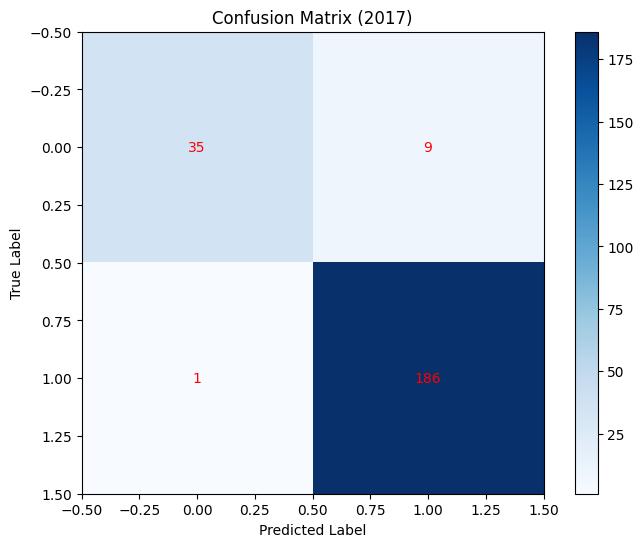

Logistic Regression Analysis for 2017:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs FinalGrade_binary:
Accuracy: 0.9567099567099567
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.80      0.88        44
           1       0.95      0.99      0.97       187

    accuracy                           0.96       231
   macro avg       0.96      0.90      0.92       231
weighted avg       0.96      0.96      0.95       231




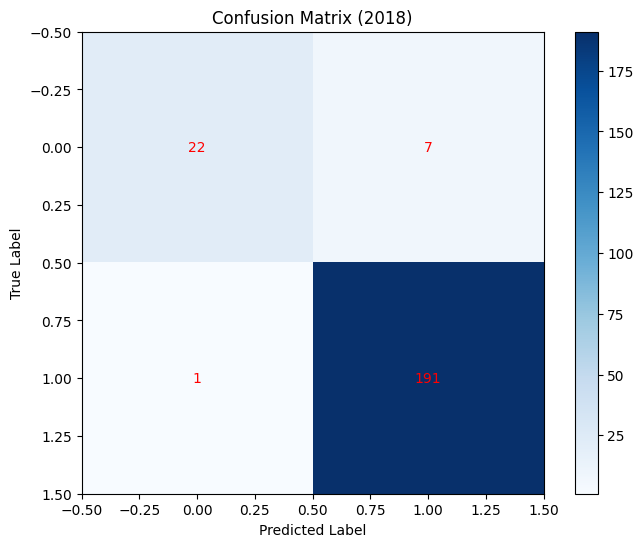

Logistic Regression Analysis for 2018:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs FinalGrade_binary:
Accuracy: 0.9638009049773756
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.76      0.85        29
           1       0.96      0.99      0.98       192

    accuracy                           0.96       221
   macro avg       0.96      0.88      0.91       221
weighted avg       0.96      0.96      0.96       221




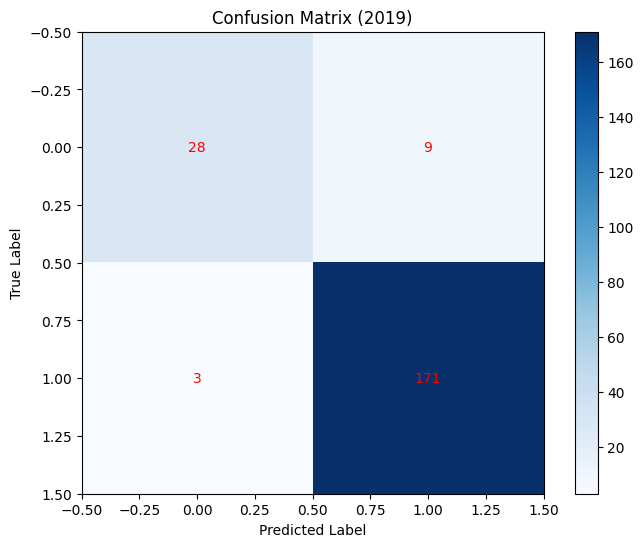

Logistic Regression Analysis for 2019:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs FinalGrade_binary:
Accuracy: 0.943127962085308
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.76      0.82        37
           1       0.95      0.98      0.97       174

    accuracy                           0.94       211
   macro avg       0.93      0.87      0.89       211
weighted avg       0.94      0.94      0.94       211




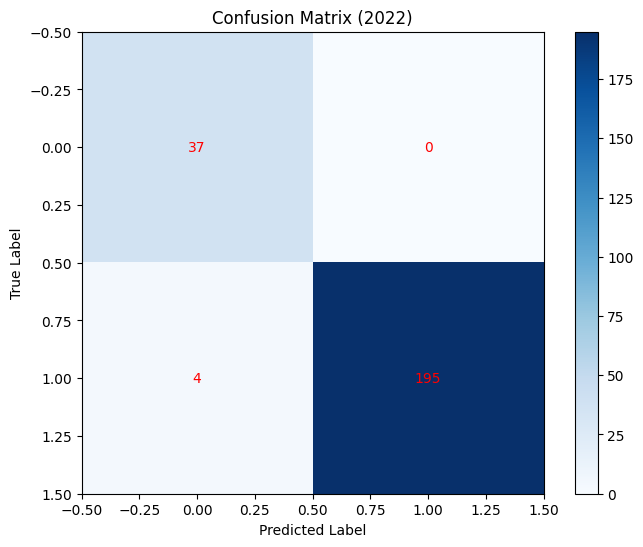

Logistic Regression Analysis for 2022:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs FinalGrade_binary:
Accuracy: 0.9830508474576272
Classification Report:
              precision    recall  f1-score   support

           0       0.90      1.00      0.95        37
           1       1.00      0.98      0.99       199

    accuracy                           0.98       236
   macro avg       0.95      0.99      0.97       236
weighted avg       0.98      0.98      0.98       236




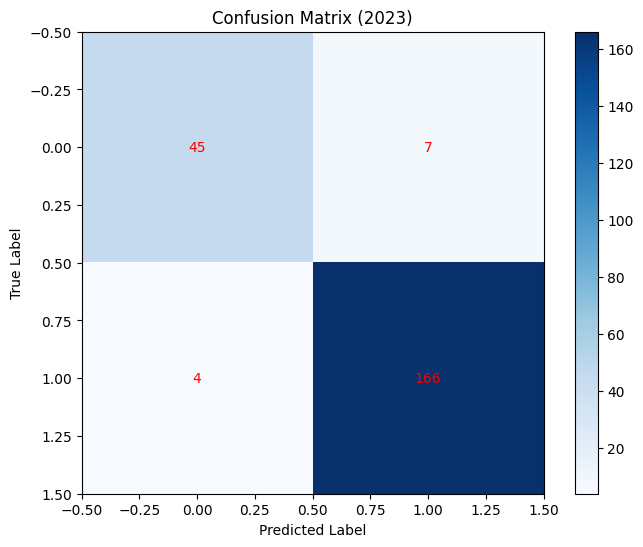

Logistic Regression Analysis for 2023:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs FinalGrade_binary:
Accuracy: 0.9504504504504504
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.87      0.89        52
           1       0.96      0.98      0.97       170

    accuracy                           0.95       222
   macro avg       0.94      0.92      0.93       222
weighted avg       0.95      0.95      0.95       222




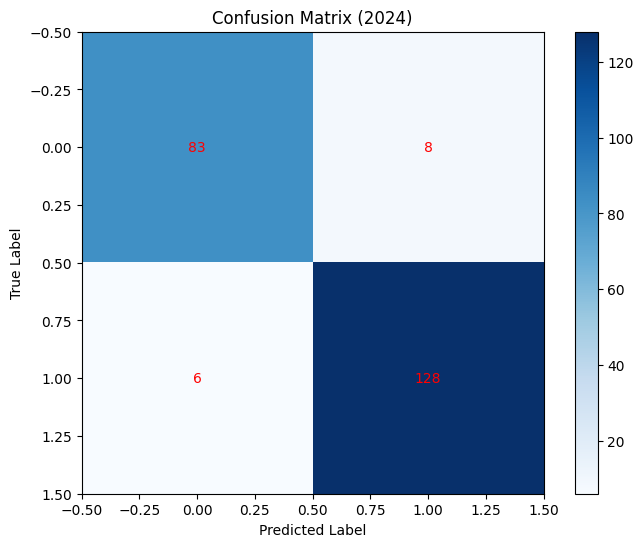

Logistic Regression Analysis for 2024:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs FinalGrade_binary:
Accuracy: 0.9377777777777778
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.91      0.92        91
           1       0.94      0.96      0.95       134

    accuracy                           0.94       225
   macro avg       0.94      0.93      0.94       225
weighted avg       0.94      0.94      0.94       225




In [ ]:
# Binarize the FinalGrade column for logistic regression
def binarize_final_grade(df, grade_column, threshold=15):
    df[f'{grade_column}_binary'] = (df[grade_column] >= threshold).astype(int)
    return df

# Applying the binarization to each dataset
for year in datasets:
    datasets[year] = binarize_final_grade(datasets[year], 'FinalGrade')

# Update the target column to the new binary column
target_column_binary = 'FinalGrade_binary'

# Now running the logistic regression analysis with the updated target column
for year in dataset_years:
    logistic_regression_analysis(datasets[year], total_features, target_column_binary, year)


In [ ]:
target_column = 'Passed'  # Replace with actual target column

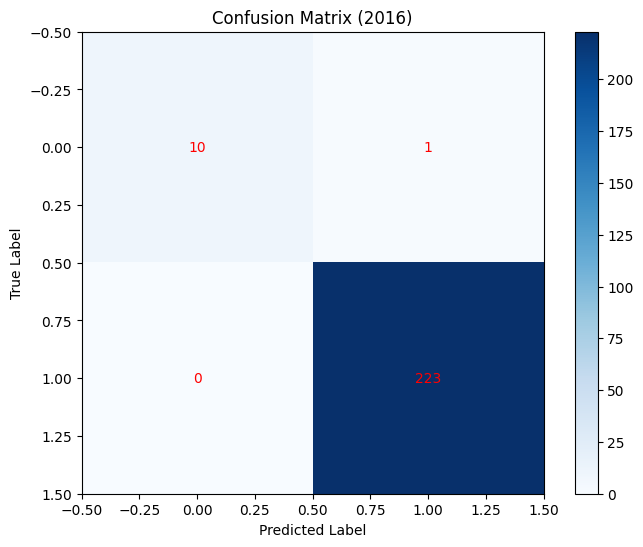

Logistic Regression Analysis for 2016:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9957264957264957
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        11
           1       1.00      1.00      1.00       223

    accuracy                           1.00       234
   macro avg       1.00      0.95      0.98       234
weighted avg       1.00      1.00      1.00       234




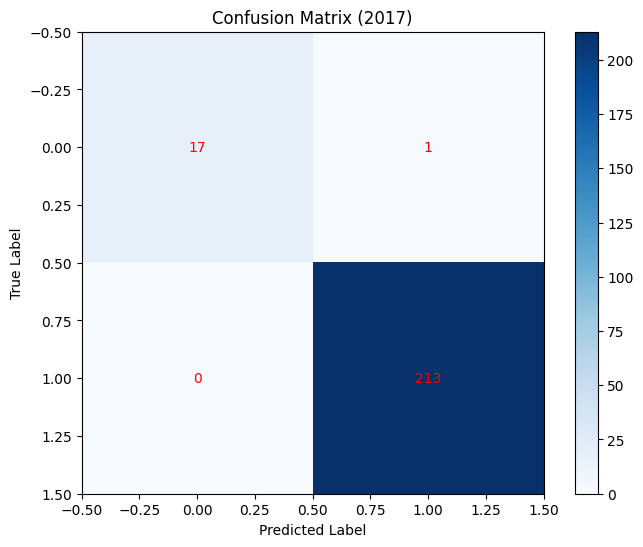

Logistic Regression Analysis for 2017:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9956709956709957
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97        18
           1       1.00      1.00      1.00       213

    accuracy                           1.00       231
   macro avg       1.00      0.97      0.98       231
weighted avg       1.00      1.00      1.00       231




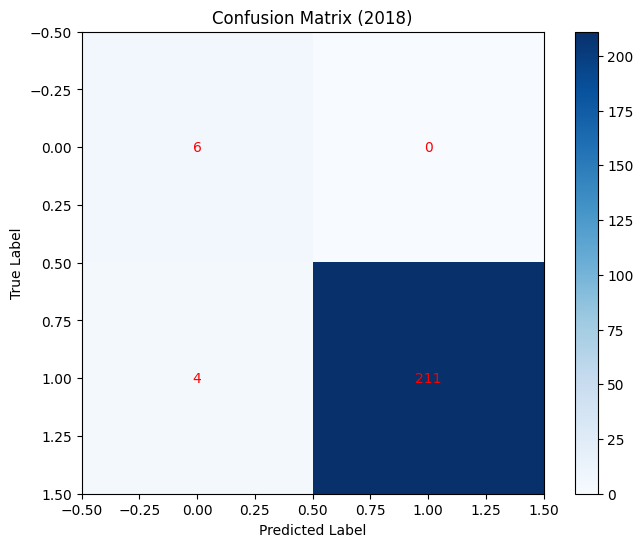

Logistic Regression Analysis for 2018:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9819004524886877
Classification Report:
              precision    recall  f1-score   support

           0       0.60      1.00      0.75         6
           1       1.00      0.98      0.99       215

    accuracy                           0.98       221
   macro avg       0.80      0.99      0.87       221
weighted avg       0.99      0.98      0.98       221




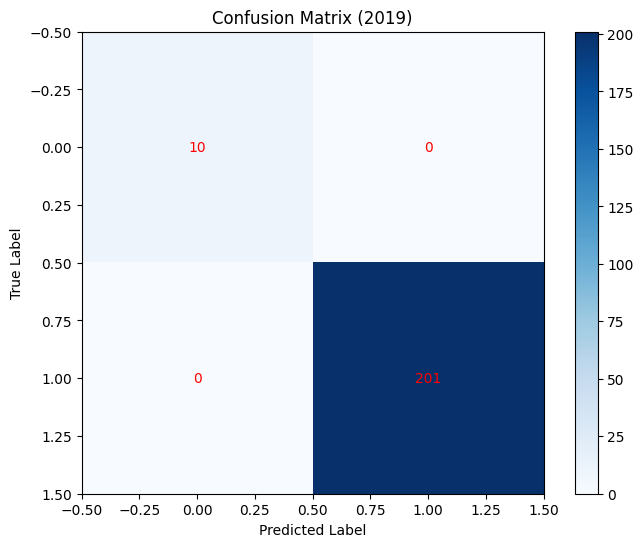

Logistic Regression Analysis for 2019:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00       201

    accuracy                           1.00       211
   macro avg       1.00      1.00      1.00       211
weighted avg       1.00      1.00      1.00       211




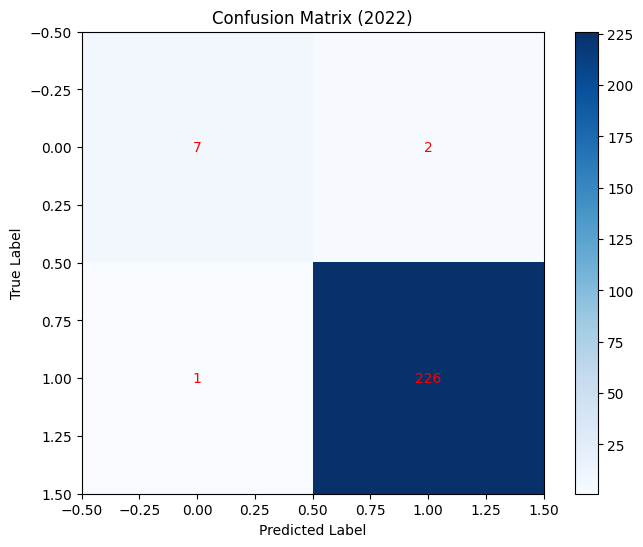

Logistic Regression Analysis for 2022:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9872881355932204
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.78      0.82         9
           1       0.99      1.00      0.99       227

    accuracy                           0.99       236
   macro avg       0.93      0.89      0.91       236
weighted avg       0.99      0.99      0.99       236




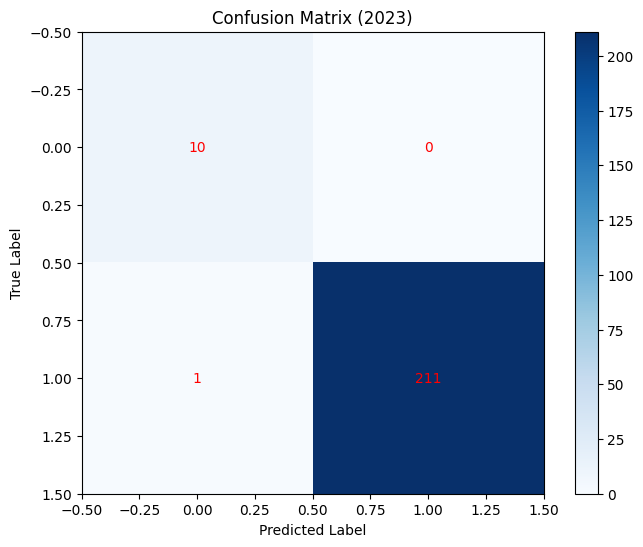

Logistic Regression Analysis for 2023:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9954954954954955
Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       1.00      1.00      1.00       212

    accuracy                           1.00       222
   macro avg       0.95      1.00      0.98       222
weighted avg       1.00      1.00      1.00       222




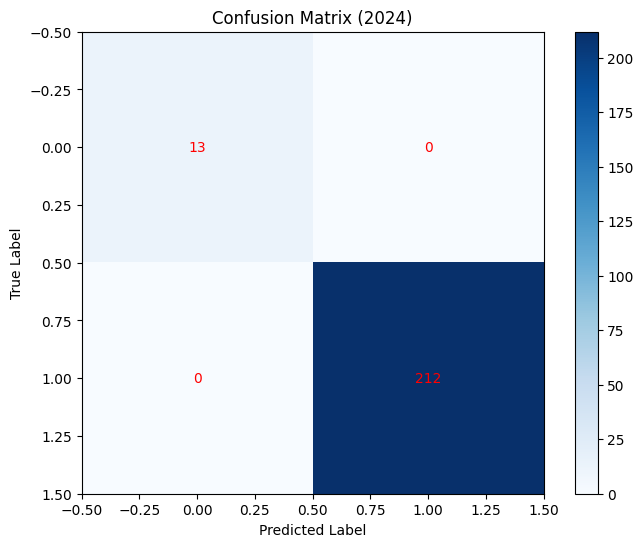

Logistic Regression Analysis for 2024:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        13
           1       1.00      1.00      1.00       212

    accuracy                           1.00       225
   macro avg       1.00      1.00      1.00       225
weighted avg       1.00      1.00      1.00       225




In [ ]:
for year in dataset_years:
  logistic_regression_analysis(datasets[year], total_features, target_column, year)

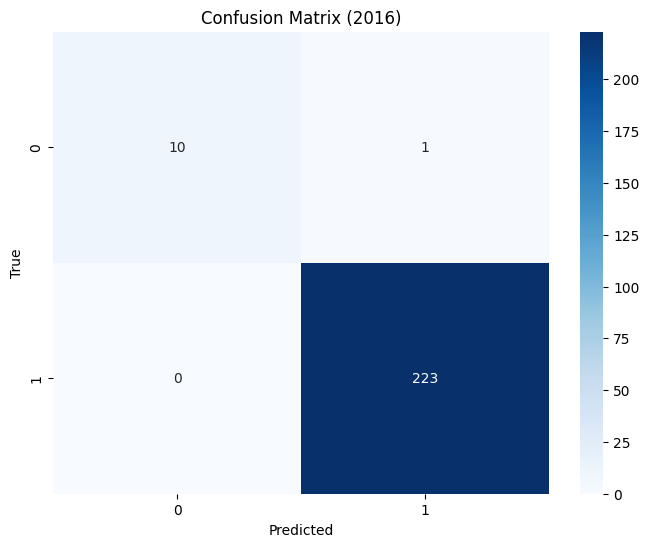

Random Forest Analysis for 2016:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9957264957264957
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        11
           1       1.00      1.00      1.00       223

    accuracy                           1.00       234
   macro avg       1.00      0.95      0.98       234
weighted avg       1.00      1.00      1.00       234




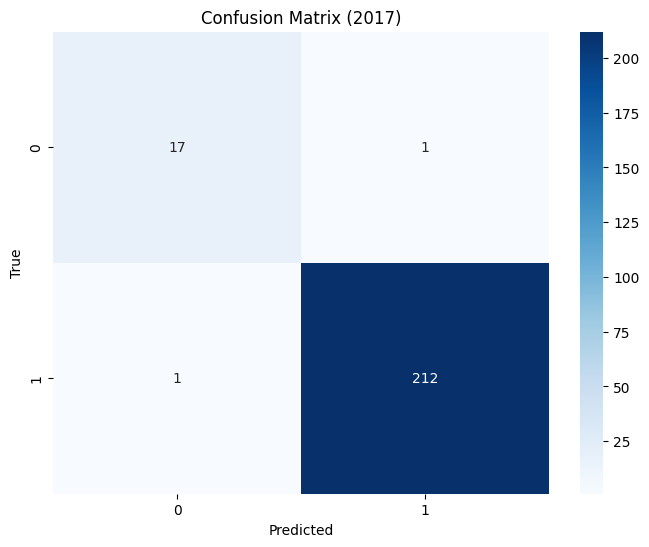

Random Forest Analysis for 2017:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9913419913419913
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        18
           1       1.00      1.00      1.00       213

    accuracy                           0.99       231
   macro avg       0.97      0.97      0.97       231
weighted avg       0.99      0.99      0.99       231




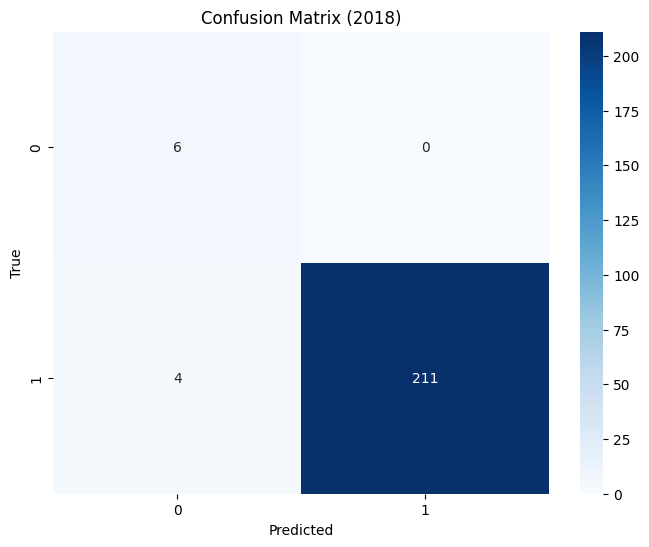

Random Forest Analysis for 2018:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9819004524886877
Classification Report:
              precision    recall  f1-score   support

           0       0.60      1.00      0.75         6
           1       1.00      0.98      0.99       215

    accuracy                           0.98       221
   macro avg       0.80      0.99      0.87       221
weighted avg       0.99      0.98      0.98       221




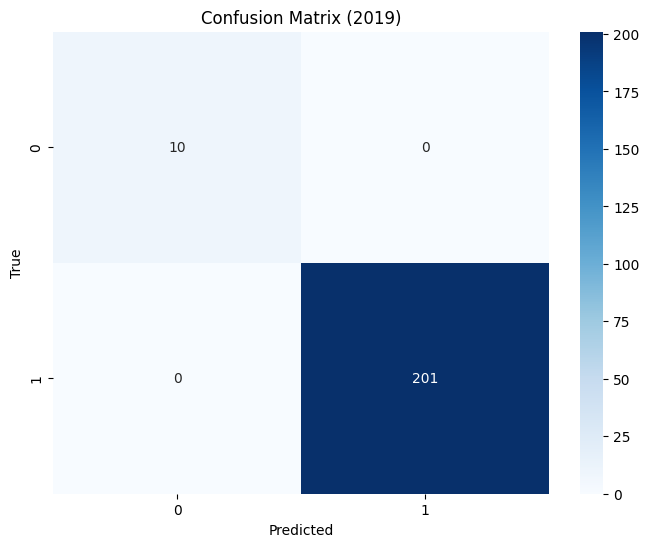

Random Forest Analysis for 2019:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00       201

    accuracy                           1.00       211
   macro avg       1.00      1.00      1.00       211
weighted avg       1.00      1.00      1.00       211




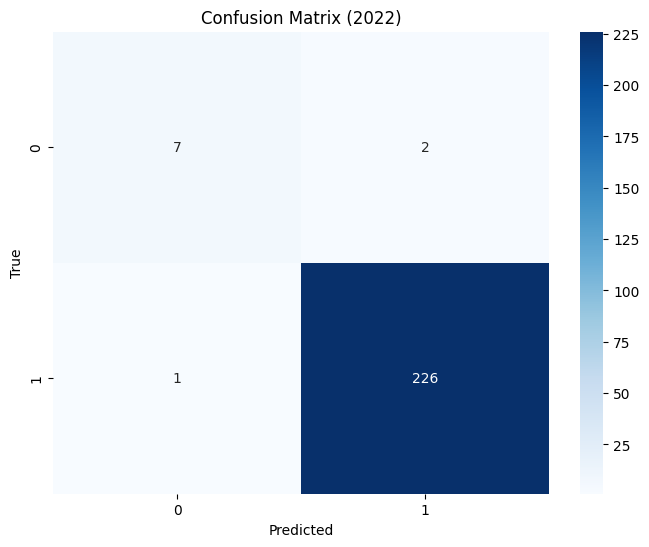

Random Forest Analysis for 2022:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.9872881355932204
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.78      0.82         9
           1       0.99      1.00      0.99       227

    accuracy                           0.99       236
   macro avg       0.93      0.89      0.91       236
weighted avg       0.99      0.99      0.99       236




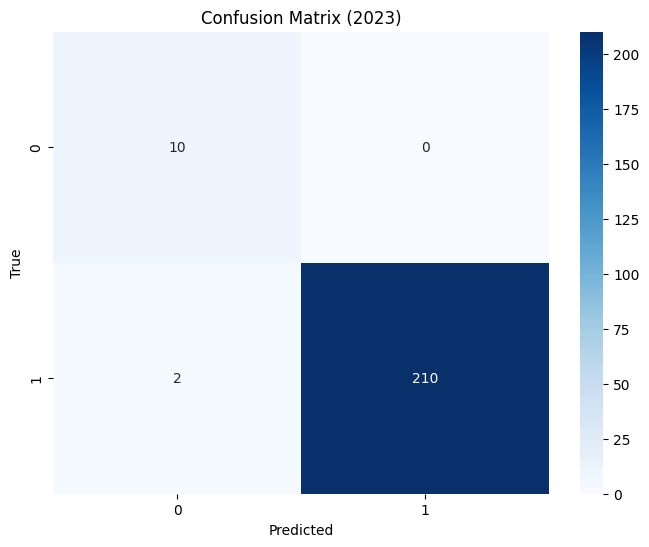

Random Forest Analysis for 2023:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 0.990990990990991
Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       1.00      0.99      1.00       212

    accuracy                           0.99       222
   macro avg       0.92      1.00      0.95       222
weighted avg       0.99      0.99      0.99       222




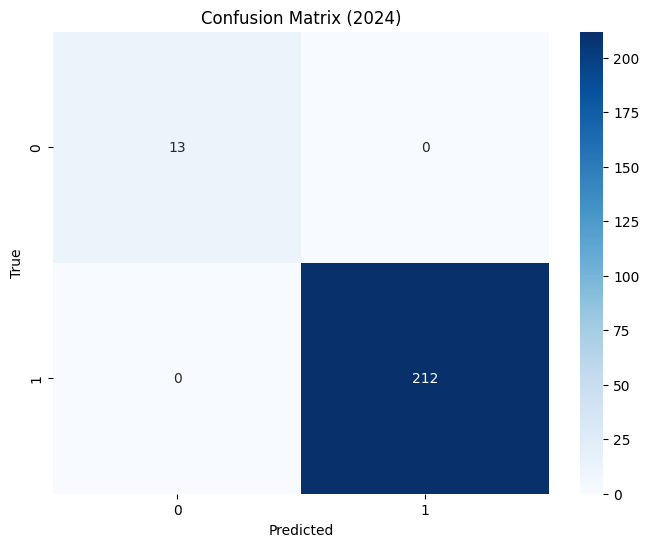

Random Forest Analysis for 2024:
['Total_AP', 'Total_PP', 'Total_SPA', 'Total_Bon'] vs Passed:
Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        13
           1       1.00      1.00      1.00       212

    accuracy                           1.00       225
   macro avg       1.00      1.00      1.00       225
weighted avg       1.00      1.00      1.00       225




In [ ]:
for year in dataset_years:
  random_forest_analysis(datasets[year], total_features, target_column, year)

###### regression_analysis(df, feature_cols, target_col, year, save_path='Charts/Multiple_Regression', doc=None)

In [ ]:
def regression_analysis(df, x_col, y_col, year, threshold=0.6, test_size=0.2, save_path='Charts/Regression', doc=None):
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Remove rows with NaN values in the specified columns
    df = df[[x_col, y_col]].dropna()

    if df.empty:
        error_msg = f"No data available for regression analysis between {x_col} and {y_col} for year {year}."
        if doc:
            print_to_doc(doc, error_msg)
        else:
            print(error_msg)
        return

    X = df[x_col].values.reshape(-1, 1)
    y = df[y_col].values.reshape(-1, 1)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=0)
    regressor = LinearRegression()
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)

    # Calculate R-squared value
    r_squared = regressor.score(X_test, y_test)

    # Only proceed if R-squared is above the threshold
    if r_squared >= threshold:
        # Plot for training set
        plt.scatter(X_train, y_train, color='red')
        plt.plot(X_train, regressor.predict(X_train), color='blue')
        plt.title(f'{x_col} vs {y_col} (Training Set) ({year})')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        image_path_train = f'{save_path}/{x_col}_vs_{y_col}_Training_{year}.png'
        plt.savefig(image_path_train, dpi=300)
        plt.show()

        if doc:
            add_image_to_doc(doc, image_path_train)

        # Plot for test set
        plt.scatter(X_test, y_test, color='red')
        plt.plot(X_test, y_pred, color='blue')
        plt.title(f'{x_col} vs {y_col} (Test Set) ({year})')
        plt.xlabel(x_col)
        plt.ylabel(y_col)
        image_path_test = f'{save_path}/{x_col}_vs_{y_col}_Test_{year}.png'
        plt.savefig(image_path_test, dpi=300)
        plt.show()

        if doc:
            add_image_to_doc(doc, image_path_test)

        # Print regression results
        intercept = regressor.intercept_[0]
        slope = regressor.coef_[0][0]
        result = (
            f"Regression Analysis for {year}:\n"
            f"{x_col} vs {y_col}:\n"
            f"R-squared: {r_squared}\n"
            f"Intercept: {intercept}\n"
            f"Slope: {slope}\n"
        )
        if doc:
            print_to_doc(doc, result)
        else:
            print(result)
    else:
        no_result_msg = f"R-squared below threshold for {x_col} vs {y_col} in year {year}. Skipping documentation."
        if doc:
            print_to_doc(doc, no_result_msg)
        else:
            print(no_result_msg)

Regression Analysis for 2016
R-squared below threshold for Week1_AP vs FinalGrade in year 2016. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_AP in year 2016. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_PP in year 2016. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_SPA in year 2016. Skipping documentation.
Regression Analysis for 2017


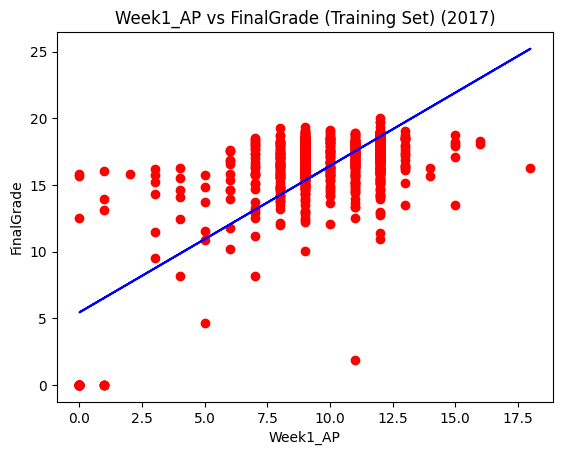

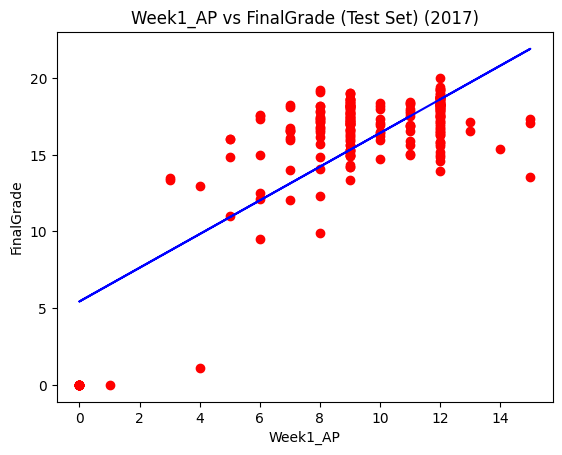

Regression Analysis for 2017:
Week1_AP vs FinalGrade:
R-squared: 0.6346287062170328
Intercept: 5.4351861095722676
Slope: 1.0987178874254289

R-squared below threshold for Week1_AP vs Total_AP in year 2017. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_PP in year 2017. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_SPA in year 2017. Skipping documentation.
Regression Analysis for 2018
R-squared below threshold for Week1_AP vs FinalGrade in year 2018. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_AP in year 2018. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_PP in year 2018. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_SPA in year 2018. Skipping documentation.
Regression Analysis for 2019
R-squared below threshold for Week1_AP vs FinalGrade in year 2019. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_AP in year 2019. Skipping documenta

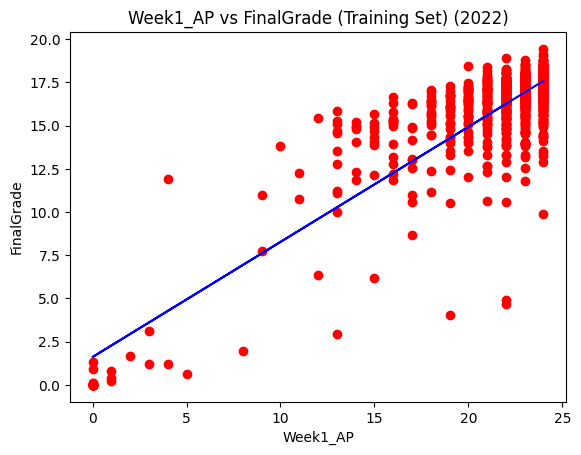

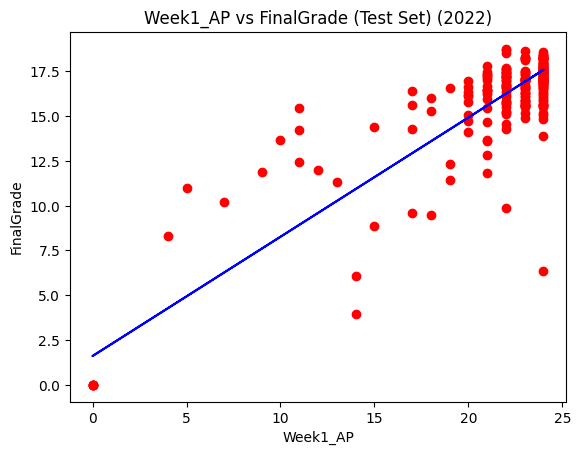

Regression Analysis for 2022:
Week1_AP vs FinalGrade:
R-squared: 0.6666824356259018
Intercept: 1.6072596390355773
Slope: 0.6658270112922439

R-squared below threshold for Week1_AP vs Total_AP in year 2022. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_PP in year 2022. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_SPA in year 2022. Skipping documentation.
Regression Analysis for 2023
R-squared below threshold for Week1_AP vs FinalGrade in year 2023. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_AP in year 2023. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_PP in year 2023. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_SPA in year 2023. Skipping documentation.
Regression Analysis for 2024
R-squared below threshold for Week1_AP vs FinalGrade in year 2024. Skipping documentation.
R-squared below threshold for Week1_AP vs Total_AP in year 2024. Skipping documenta

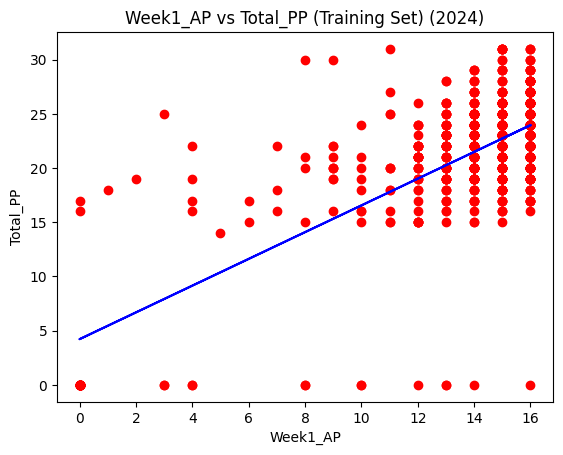

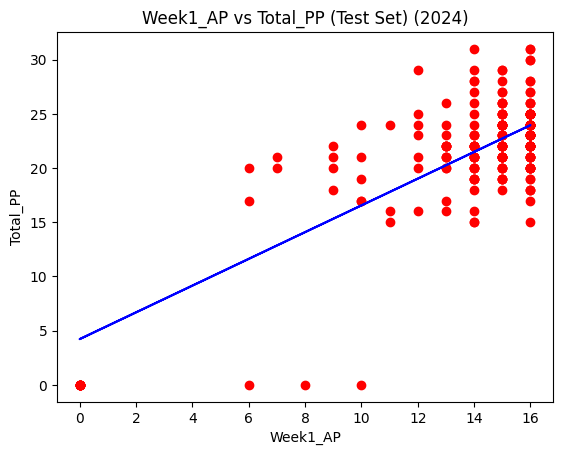

Regression Analysis for 2024:
Week1_AP vs Total_PP:
R-squared: 0.6226737939954938
Intercept: 4.20952764497676
Slope: 1.2340652791837066

R-squared below threshold for Week1_AP vs Total_SPA in year 2024. Skipping documentation.


In [ ]:
for year in dataset_years:
    print(f"Regression Analysis for {year}")
    regression_analysis(datasets[year], 'Week1_AP', 'FinalGrade', year)
    regression_analysis(datasets[year], 'Week1_AP', 'Total_AP', year)
    regression_analysis(datasets[year], 'Week1_AP', 'Total_PP', year)
    regression_analysis(datasets[year], 'Week1_AP', 'Total_SPA', year)

###### multiple_regression_analysis(df, x_cols, y_col, year, threshold=0.6, test_size=0.2, save_path='Charts/Regression', doc=None)

In [ ]:
def multiple_regression_analysis(df, x_cols, y_col, year, threshold=0.3, test_size=0.2, save_path='Charts/Regression', doc=None):
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Remove rows with NaN values in the specified columns
    df = df[x_cols + [y_col]].dropna()

    if df.empty:
        error_msg = f"No data available for regression analysis between {x_cols} and {y_col} for year {year}."
        if doc:
            print_to_doc(doc, error_msg)
        else:
            print(error_msg)
        return

    X = df[x_cols].values
    y = df[y_col].values
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=0)
    regressor = LinearRegression()
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)

    # Calculate R-squared value
    r_squared = r2_score(y_test, y_pred)

    # Only proceed if R-squared is above the threshold
    if r_squared >= threshold:
        # Plot for training set
        plt.scatter(X_train[:, 0], y_train, color='red')
        plt.plot(X_train[:, 0], regressor.predict(X_train), color='blue')
        plt.title(f'{x_cols[0]} vs {y_col} (Training Set) ({year})')
        plt.xlabel(x_cols[0])
        plt.ylabel(y_col)
        image_path_train = f'{save_path}/{x_cols[0]}_vs_{y_col}_Training_{year}.png'
        plt.savefig(image_path_train, dpi=300)
        plt.show()

        if doc:
            add_image_to_doc(doc, image_path_train)

        # Plot for test set
        plt.scatter(X_test[:, 0], y_test, color='red')
        plt.plot(X_test[:, 0], y_pred, color='blue')
        plt.title(f'{x_cols[0]} vs {y_col} (Test Set) ({year})')
        plt.xlabel(x_cols[0])
        plt.ylabel(y_col)
        image_path_test = f'{save_path}/{x_cols[0]}_vs_{y_col}_Test_{year}.png'
        plt.savefig(image_path_test, dpi=300)
        plt.show()

        if doc:
            add_image_to_doc(doc, image_path_test)

        # Print regression results
        intercept = regressor.intercept_
        coefficients = regressor.coef_
        result = (
            f"Regression Analysis for {year}:\n"
            f"{x_cols} vs {y_col}:\n"
            f"R-squared: {r_squared}\n"
            f"Intercept: {intercept}\n"
            f"Coefficients: {coefficients}\n"
        )
        if doc:
            print_to_doc(doc, result)
        else:
            print(result)
    else:
        no_result_msg = f"R-squared below threshold for {x_cols} vs {y_col} in year {year}. Skipping documentation."
        if doc:
            print_to_doc(doc, no_result_msg)
        else:
            print(no_result_msg)

R-squared below threshold for ['1_0', '1_1', '1_10', '1_11', '1_12a', '1_12b', '1_2', '1_3b', '1_4a', '1_4b', '1_5', '1_6', '1_8', 'PP1_1', 'PP1_2', 'PP1_3'] vs FinalGradeInteger in year 2016. Skipping documentation.
R-squared below threshold for ['1_0', '1_1', '1_10', '1_11', '1_12a', '1_12b', '1_2', '1_3b', '1_4a', '1_4b', '1_6', '1_8', 'PP1_1', 'PP1_2', 'PP1_3'] vs FinalGradeInteger in year 2017. Skipping documentation.
R-squared below threshold for ['1_0', '1_1', '1_10', '1_11', '1_12a', '1_12b', '1_2', '1_3b', '1_4a', '1_4b', '1_6', '1_8', '1_9', 'PP1_1', 'PP1_2', 'PP1_3'] vs FinalGradeInteger in year 2018. Skipping documentation.
R-squared below threshold for ['1_0', '1_1', '1_10', '1_11', '1_12a', '1_12b', '1_2', '1_3b', '1_4a', '1_4b', '1_6', '1_7', '1_8', 'PP1_1', 'PP1_2', 'PP1_3'] vs FinalGradeInteger in year 2019. Skipping documentation.


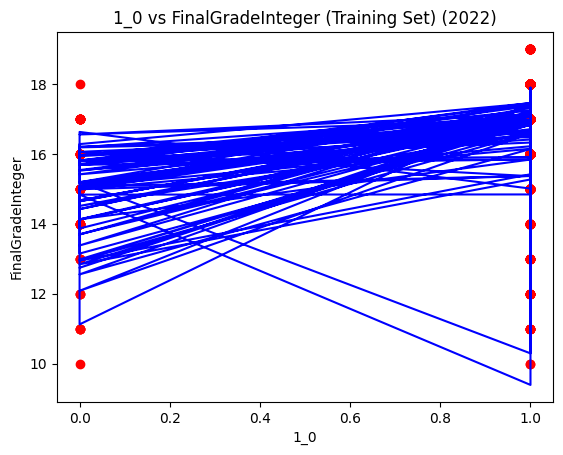

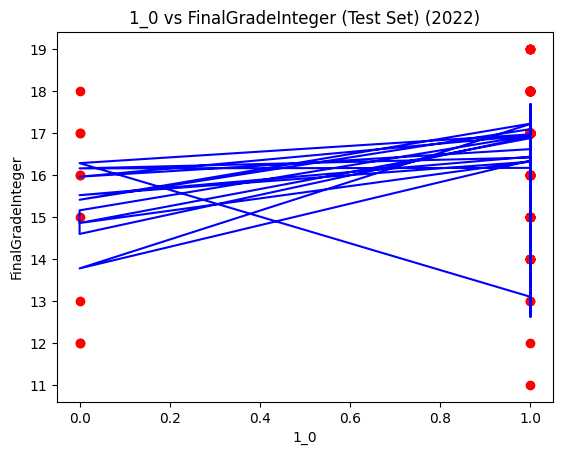

Regression Analysis for 2022:
['1_0', '1_12', '1_13a', '1_13b', '1_13c', '1_14', '1_16a', '1_16b', '1_17', '1_18a', '1_18b', '1_19', '1_20', '1_4', '1_5a', '1_5b', '1_6', '1_8', 'PP1_1', 'PP1_2', 'PP1_3', 'PP1_4'] vs FinalGradeInteger:
R-squared: 0.39083597997689934
Intercept: 6.938513672914958
Coefficients: [ 1.15767054  0.66125524  0.27507709  0.17098161  1.58851138 -0.14013354
 -0.43305955  0.12149359  0.1771419   0.83926967  0.11279937  0.82623756
  0.19610893  1.29942683  0.08949342  0.2537781   0.74720031  0.26169603
  0.13158511  0.34497605  0.12309131  0.34781489]

R-squared below threshold for ['1_0', '1_11', '1_12', '1_13', '1_14', '1_4', '1_5', '1_6a', '1_6b', '1_7', '1_9', 'PP1_1', 'PP1_2', 'PP1_3'] vs FinalGradeInteger in year 2023. Skipping documentation.


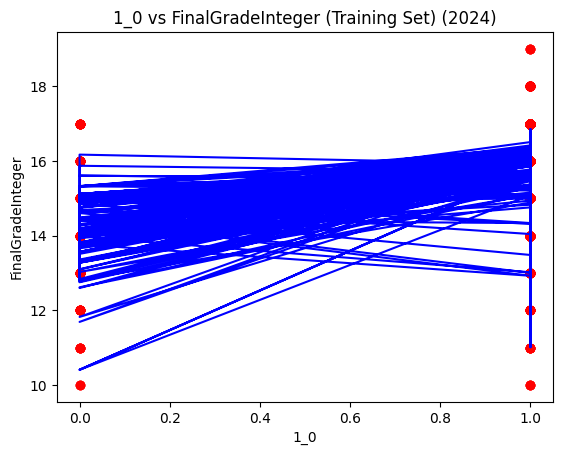

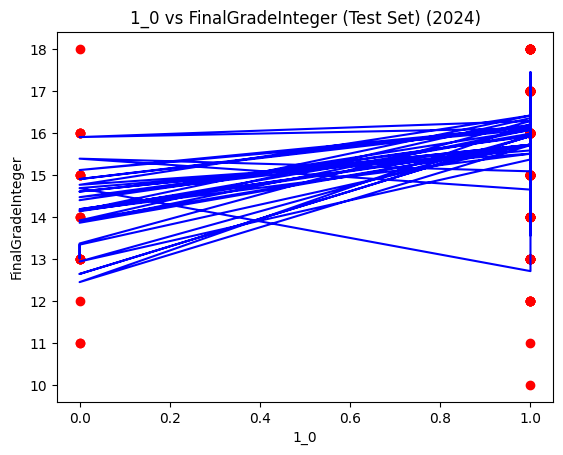

Regression Analysis for 2024:
['1_0', '1_1', '1_10', '1_12', '1_13', '1_14', '1_2', '1_4', '1_5', '1_6', '1_7', '1_8', '1_9', 'PP1_1', 'PP1_2', 'PP1_3', 'PP1_4'] vs FinalGradeInteger:
R-squared: 0.31474701104205105
Intercept: 10.40565449491994
Coefficients: [ 0.60394416  0.71756329  0.13645537 -2.52237101  1.16939117  2.58364691
  0.11167738 -0.60516193  0.1519778   0.48284181  0.21541395  0.20478768
  0.02655128  0.49011917  0.42721632  0.2637587   0.35768479]



In [ ]:
for year, dataset in datasets.items():
    feature_columns = all_lists[str(year)]['weekly_and_participation_lists']['listWeek1'] + all_lists[str(year)]['weekly_and_participation_lists']['listPPWeek1']
    multiple_regression_analysis(dataset[dataset['FinalGradeInteger'] >= 10], feature_columns, 'FinalGradeInteger', str(year))

###### logistic_regression_analysis(df, feature_columns, target_column, year, test_size=0.2, threshold=0.8, zero_division=0, doc=None)

In [ ]:
def logistic_regression_analysis(df, feature_columns, target_column, year, test_size=0.2, threshold=0.8, zero_division=0, doc=None):
    save_path = 'Charts/LogisticRegression'
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    df = df[feature_columns + [target_column]].dropna()
    if df.empty:
        error_msg = f"No data available for logistic regression analysis for year {year}."
        print_to_doc(doc, error_msg) if doc else print(error_msg)
        return

    X = df[feature_columns]
    y = df[target_column]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=0)

    logistic_regressor = LogisticRegression(max_iter=1000)
    logistic_regressor.fit(X_train, y_train)
    y_pred = logistic_regressor.predict(X_test)

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    cr = classification_report(y_test, y_pred, zero_division=zero_division)

    # Generate filename based on features and target
    features_str = '_'.join(feature_columns).replace(' ', '_').replace('/', '_')
    filename_suffix = f"{features_str}_vs_{target_column}_{year}"

    # Visualize Confusion Matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix for {year} ({filename_suffix})')
    image_path_cm = f'{save_path}/Confusion_Matrix_{filename_suffix}.png'
    plt.savefig(image_path_cm)
    plt.close()

    # Print confusion matrix and classification report
    result = (
        f"Logistic Regression Analysis for {year}:\n"
        f"Predicting {target_column} with features {feature_columns}:\n"
        f"Confusion Matrix:\n{cm}\n"
        f"Classification Report:\n{cr}\n"
    )

    print_to_doc(doc, result) if doc else print(result)

In [ ]:
# Example usage with corrected zero_division parameter
for year, dataset in datasets.items():
    feature_columns = all_lists[str(year)]['weekly_and_participation_lists']['listWeek1'] + all_lists[str(year)]['weekly_and_participation_lists']['listPPWeek1']
    logistic_regression_analysis(dataset[dataset['FinalGradeInteger'] >= 10], feature_columns, 'FinalGradeInteger', str(year), zero_division=0)

Logistic Regression Analysis for 2016:
Predicting FinalGradeInteger with features ['1_0', '1_1', '1_10', '1_11', '1_12a', '1_12b', '1_2', '1_3b', '1_4a', '1_4b', '1_5', '1_6', '1_8', 'PP1_1', 'PP1_2', 'PP1_3']:
Confusion Matrix:
[[ 0  1  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  1  2  0  0  0]
 [ 0  0  0  0  1  0  1  5  0  0  0]
 [ 0  0  1  4  1  2  1  5  0  0  0]
 [ 0  0  0  2  3  3  4  8  0  0  0]
 [ 0  0  0  0  2  2  3 21  2  0  0]
 [ 0  0  0  1  0  3  2 17  5  0  0]
 [ 0  0  0  0  0  2  1 46  6  0  0]
 [ 0  0  0  0  1  2  2 35  8  0  0]
 [ 0  0  0  0  1  0  0  7  4  0  0]
 [ 0  0  0  0  0  0  0  1  1  0  0]]
Classification Report:
              precision    recall  f1-score   support

          10       0.00      0.00      0.00         2
          11       0.00      0.00      0.00         3
          12       0.00      0.00      0.00         7
          13       0.57      0.29      0.38        14
          14       0.30      0.15      0.20        20
          15       0.14   

In [ ]:
for year in all_lists:
    feature_columns = all_lists[year]['weekly_and_participation_lists']['listWeek1'] + all_lists[year]['weekly_and_participation_lists']['listPPWeek1']
    logistic_regression_analysis(datasets[int(year)], feature_columns, 'Passed', year)

Logistic Regression Analysis for 2016:
Predicting Passed with features ['1_0', '1_1', '1_10', '1_11', '1_12a', '1_12b', '1_2', '1_3b', '1_4a', '1_4b', '1_5', '1_6', '1_8', 'PP1_1', 'PP1_2', 'PP1_3']:
Confusion Matrix:
[[  9   2]
 [  1 222]]
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.82      0.86        11
           1       0.99      1.00      0.99       223

    accuracy                           0.99       234
   macro avg       0.95      0.91      0.93       234
weighted avg       0.99      0.99      0.99       234


Logistic Regression Analysis for 2017:
Predicting Passed with features ['1_0', '1_1', '1_10', '1_11', '1_12a', '1_12b', '1_2', '1_3b', '1_4a', '1_4b', '1_6', '1_8', 'PP1_1', 'PP1_2', 'PP1_3']:
Confusion Matrix:
[[ 15   3]
 [  0 213]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        18
           1       0.99      1.00      0.9

# Additional Statistical Tests and Visualizations


In [ ]:
# Chi-Squared and Mann-Whitney U Tests
for year in dataset_years:
    print(f"\nYear: {year}\n{'-'*50}")
    cat_vars = all_lists[str(year)]['basic_lists']['listCategorical']
    num_vars = ['Total_AP', 'Total_PP', 'Total_SPA']
    run_all_tests(datasets, cat_vars, num_vars, [(cat_var1, cat_var2) for cat_var1 in cat_vars for cat_var2 in cat_vars if cat_var1 != cat_var2])


Year: 2016
--------------------------------------------------

Year: 2016
--------------------------------------------------
Chi-squared test between Course and Class:
Chi-squared statistic: 128.9598742174863
Degrees of freedom: 510
P-value: 1.0

Chi-squared test between Course and Sex:
Chi-squared statistic: 285.2980566583418
Degrees of freedom: 15
P-value: 6.295539436948036e-52

Chi-squared test between Course and freq:
Chi-squared statistic: 49.31652715773143
Degrees of freedom: 30
P-value: 0.014589536958432818

Chi-squared test between Class and Course:
Chi-squared statistic: 128.9598742174863
Degrees of freedom: 510
P-value: 1.0

Chi-squared test between Class and Sex:
Chi-squared statistic: 6.609745728637448
Degrees of freedom: 34
P-value: 0.9999999156136625

Chi-squared test between Class and freq:
Chi-squared statistic: 65.71846715282811
Degrees of freedom: 68
P-value: 0.5558693458744037

Chi-squared test between Sex and Course:
Chi-squared statistic: 285.2980566583418
Degrees

/content/data_analysis_functions.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  contingency_table = pd.crosstab(df[column1], df[column2])


Streaming output truncated to the last 5000 lines.
P-value: 6.295539436948036e-52

One or both variables Course and Commuting are not in the dataset.
Chi-squared test between Course and freq:
Chi-squared statistic: 49.31652715773143
Degrees of freedom: 30
P-value: 0.014589536958432818

Chi-squared test between Class and Course:
Chi-squared statistic: 128.9598742174863
Degrees of freedom: 510
P-value: 1.0

Chi-squared test between Class and Sex:
Chi-squared statistic: 6.609745728637448
Degrees of freedom: 34
P-value: 0.9999999156136625

One or both variables Class and Commuting are not in the dataset.
Chi-squared test between Class and freq:
Chi-squared statistic: 65.71846715282811
Degrees of freedom: 68
P-value: 0.5558693458744037

Chi-squared test between Sex and Course:
Chi-squared statistic: 285.2980566583418
Degrees of freedom: 15
P-value: 6.295539436948036e-52

Chi-squared test between Sex and Class:
Chi-squared statistic: 6.609745728637448
Degrees of freedom: 34
P-value: 0.999999

In [ ]:
# Normality Check
for year, dataset in datasets.items():
    print(f"Normality Check for {year}")
    num_columns = dataset.select_dtypes(include=[np.number]).columns
    normality_results = check_normality(dataset, num_columns)
    for col, result in normality_results.items():
        print(f"{col}: W = {result['W']}, p-value = {result['p-value']}")

Normality Check for 2016
1_0: W = 0.352145254611969, p-value = 0.0
1_1: W = 0.08619636297225952, p-value = 0.0
1_10: W = 0.42956626415252686, p-value = 0.0
1_11: W = 0.3472548723220825, p-value = 0.0
1_12a: W = 0.4657256603240967, p-value = 0.0
1_12b: W = 0.4468173384666443, p-value = 0.0
1_2: W = 0.08619064092636108, p-value = 0.0
1_3b: W = 0.3215113878250122, p-value = 0.0
1_4a: W = 0.6055846214294434, p-value = 1.401298464324817e-45
1_4b: W = 0.5670315027236938, p-value = 0.0
1_5: W = 0.01044541597366333, p-value = 0.0
1_6: W = 0.2738027572631836, p-value = 0.0
1_8: W = 0.355352520942688, p-value = 0.0
2_1: W = 0.694056510925293, p-value = 1.1908234349832295e-41
2_11: W = 0.6954959034919739, p-value = 1.3961136600068152e-41
2_12b: W = 0.3456078767776489, p-value = 0.0
2_12c: W = 0.5466728210449219, p-value = 0.0
2_13: W = 0.5504347085952759, p-value = 0.0
2_15b: W = 0.5525508522987366, p-value = 0.0
2_16: W = 0.42522722482681274, p-value = 0.0
2_18a: W = 0.48324596881866455, p-value

In [ ]:
# ANOVA Test
course_gender_anova(datasets)

----------------------------------------------------------------------------------
2016
                       sum_sq      df          F        PR(>F)
C(Course)          271.462962    15.0   4.352179  5.636971e-08
C(Sex)              72.659337     1.0  17.473459  3.150512e-05
C(Course):C(Sex)    73.956994    15.0   1.185702  2.762360e-01
Residual          4465.980635  1074.0        NaN           NaN
----------------------------------------------------------------------------------
2017
                        sum_sq      df         F    PR(>F)
C(Course)           869.705302    15.0  3.006687  0.000093
C(Sex)               93.504329     1.0  4.848854  0.027868
C(Course):C(Sex)    465.590153    15.0  1.609607  0.064657
Residual          21597.854652  1120.0       NaN       NaN
----------------------------------------------------------------------------------
2018
                       sum_sq      df         F        PR(>F)
C(Course)          156.827649    15.0  4.984704  1.493502e-09
C(

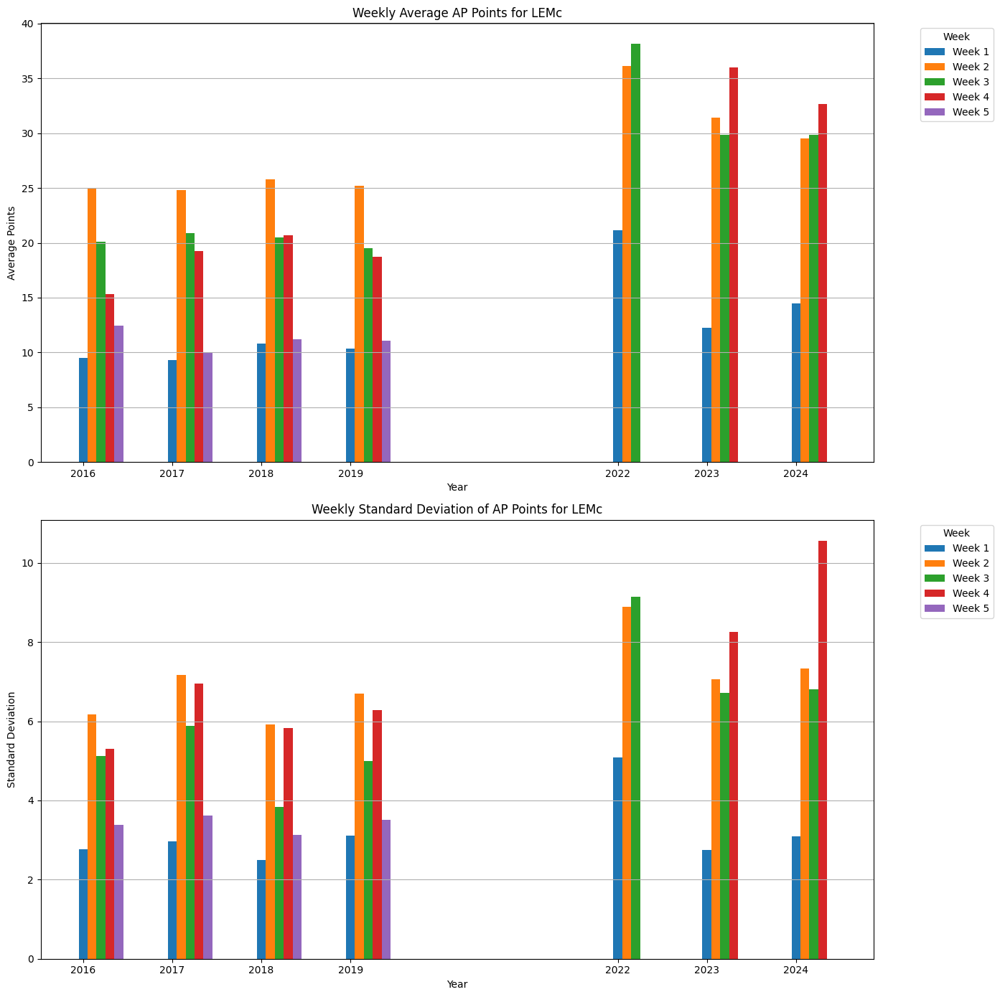

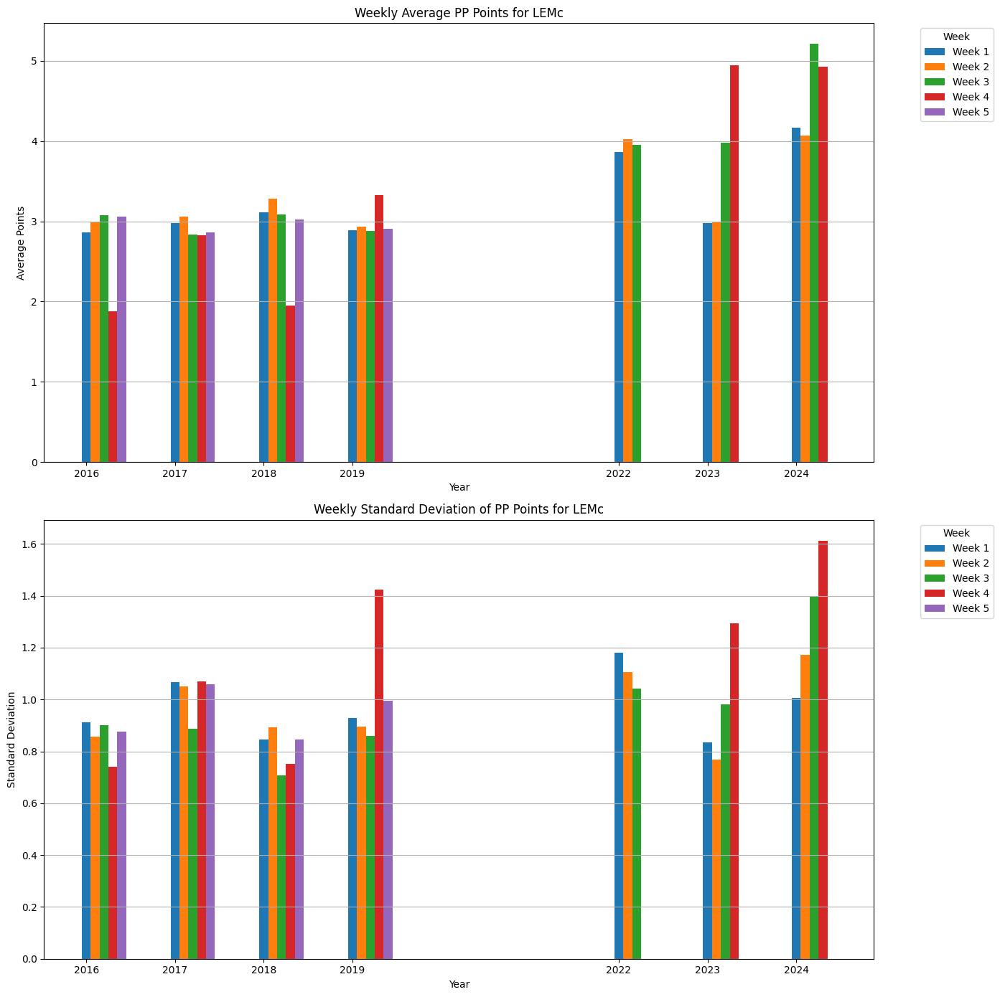

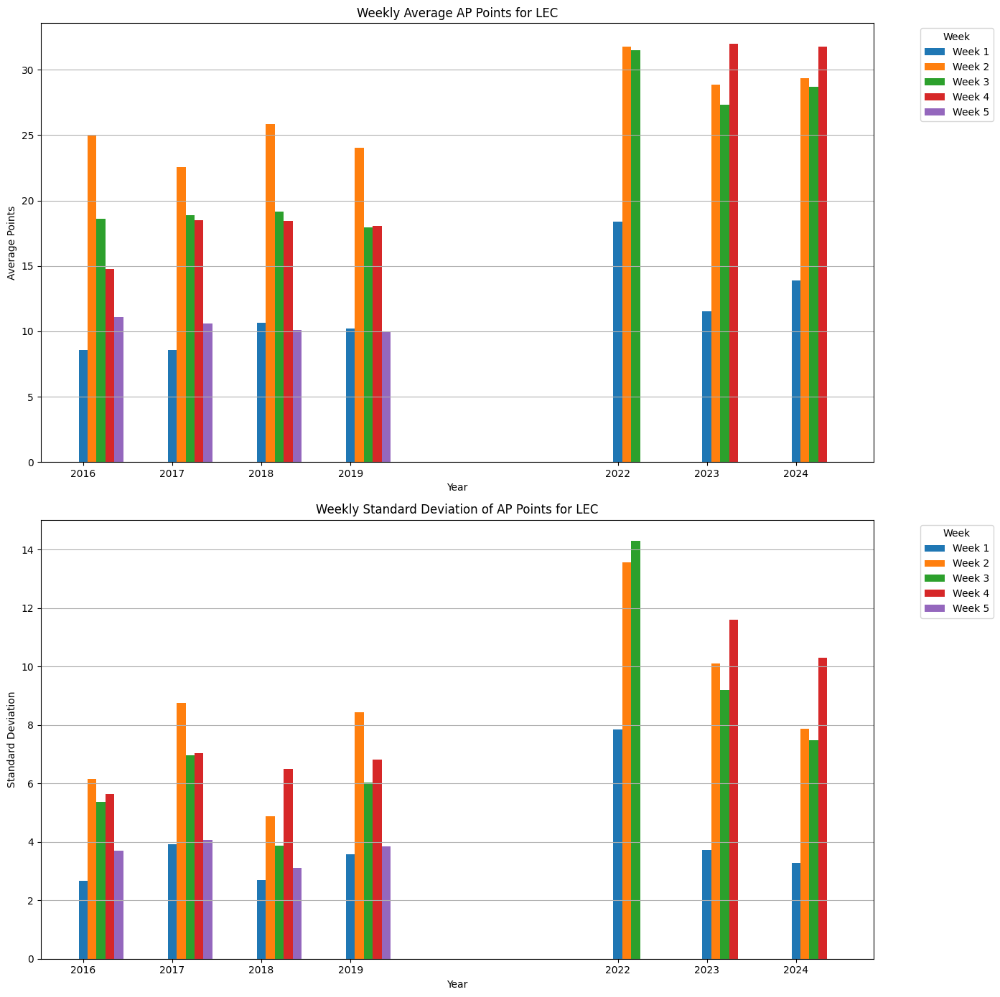

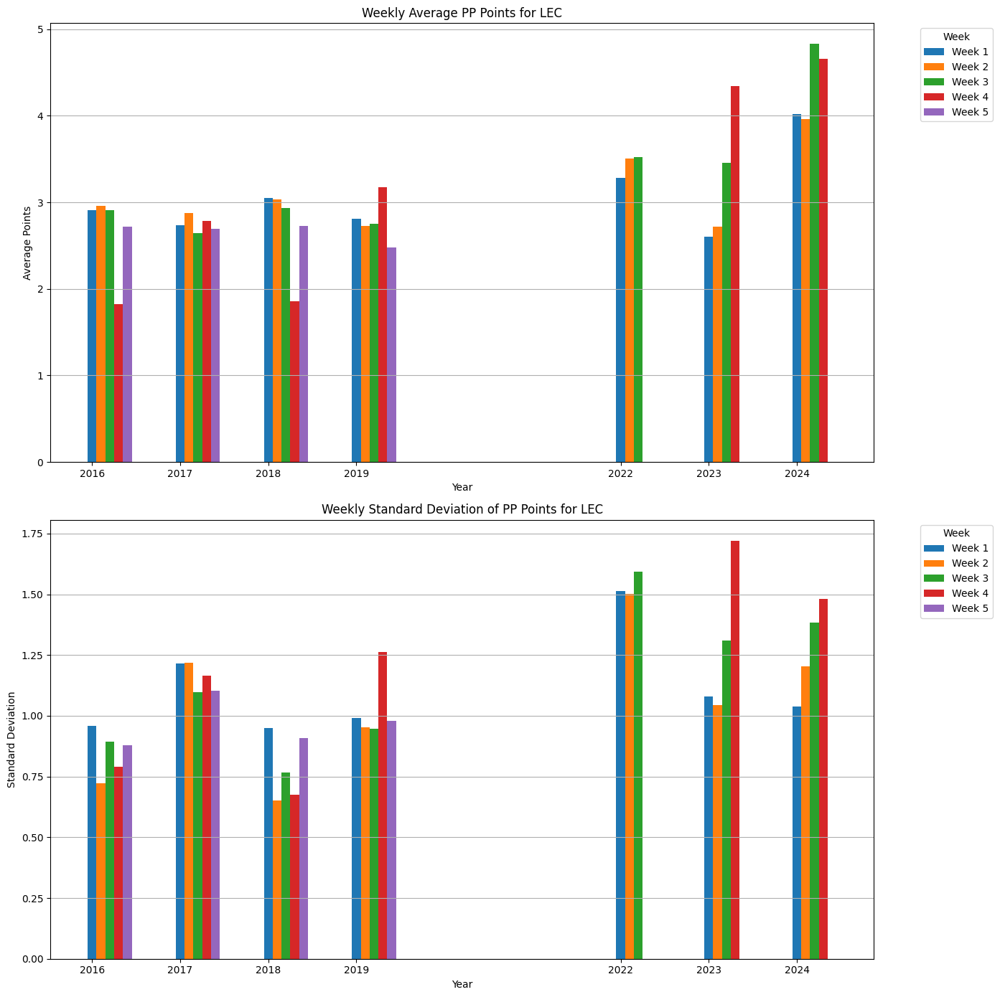

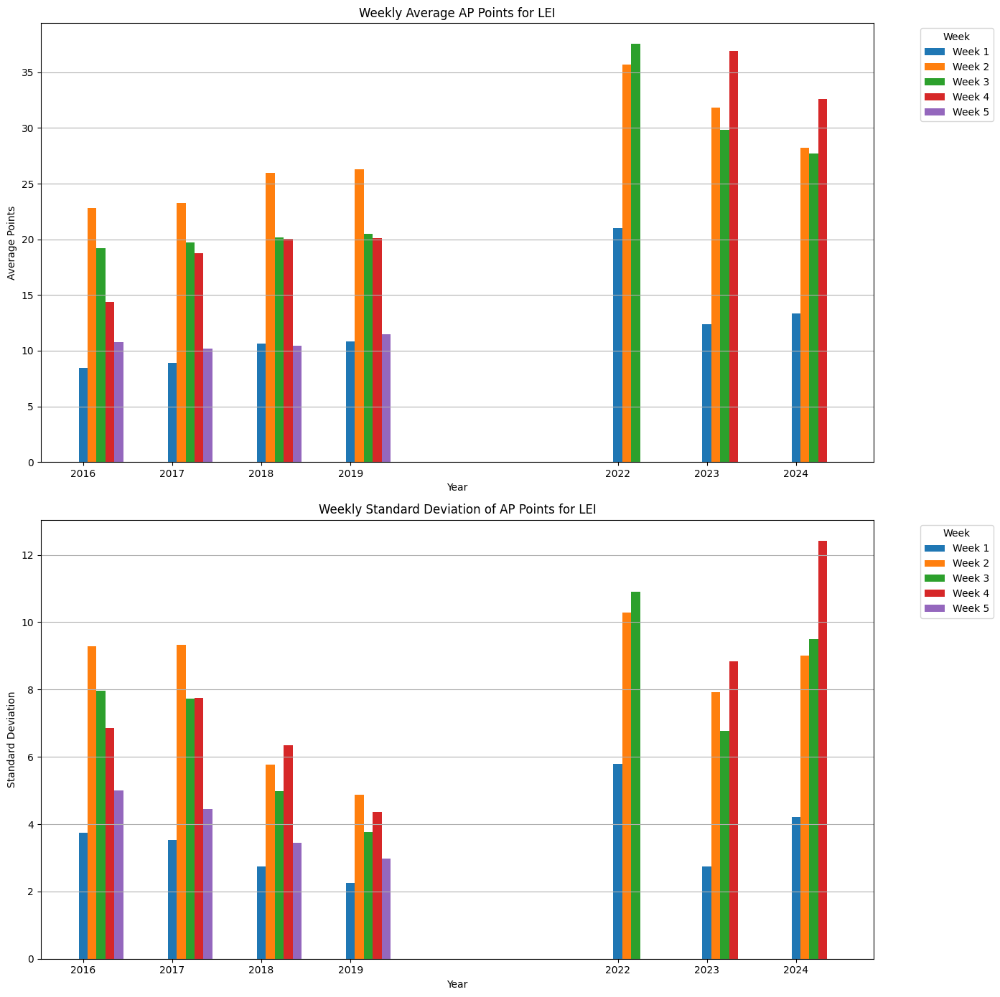

...

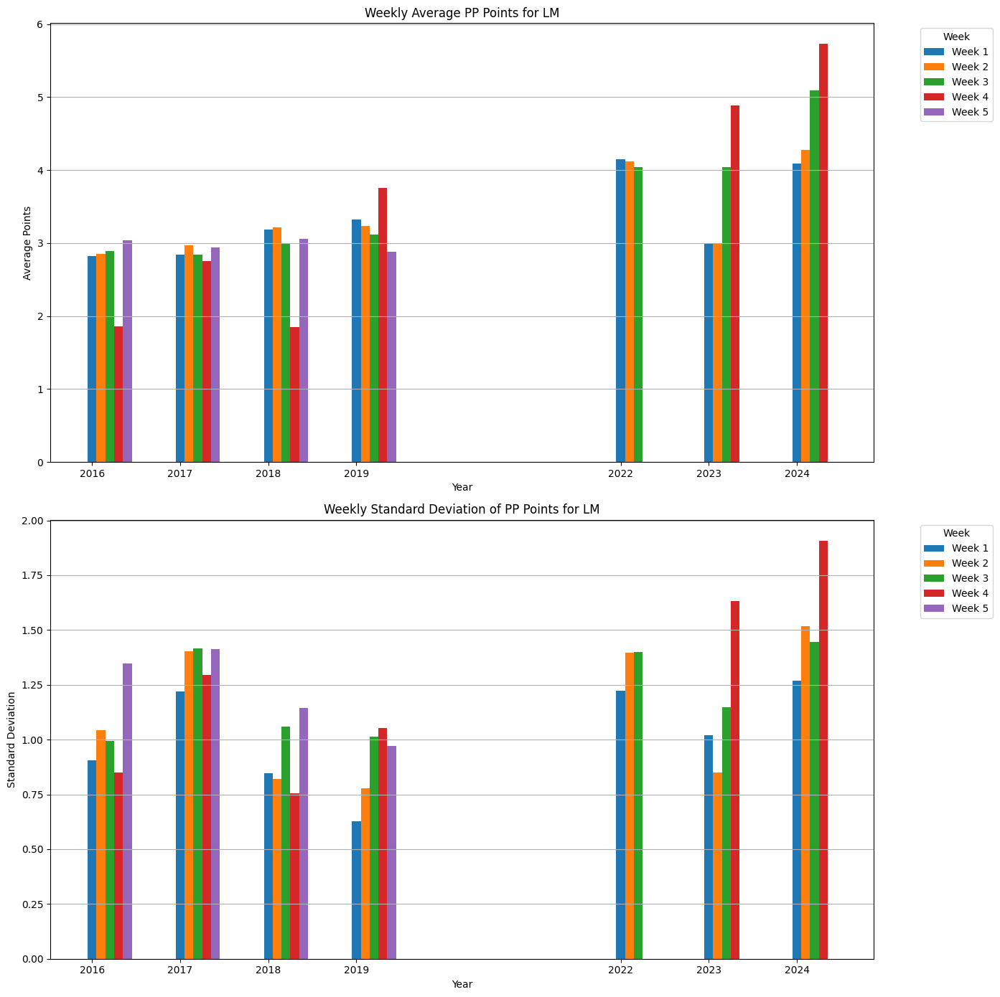

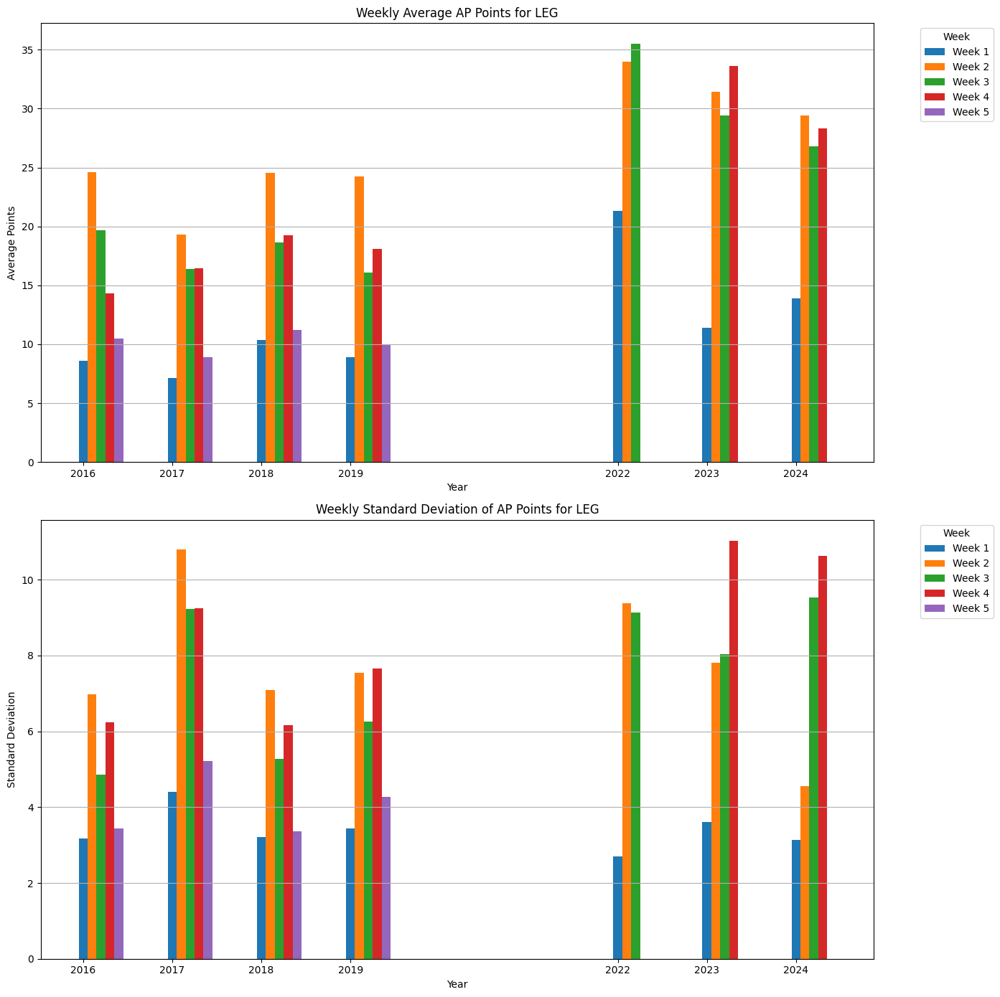

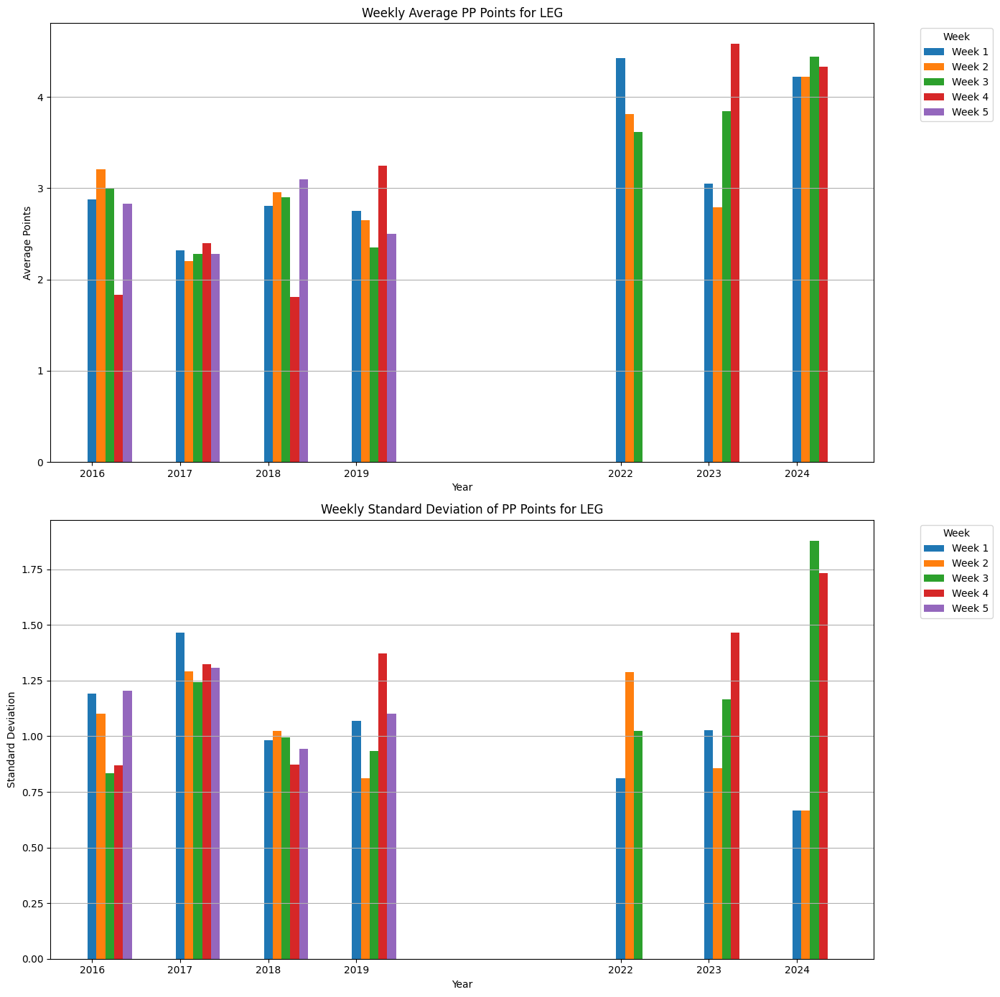

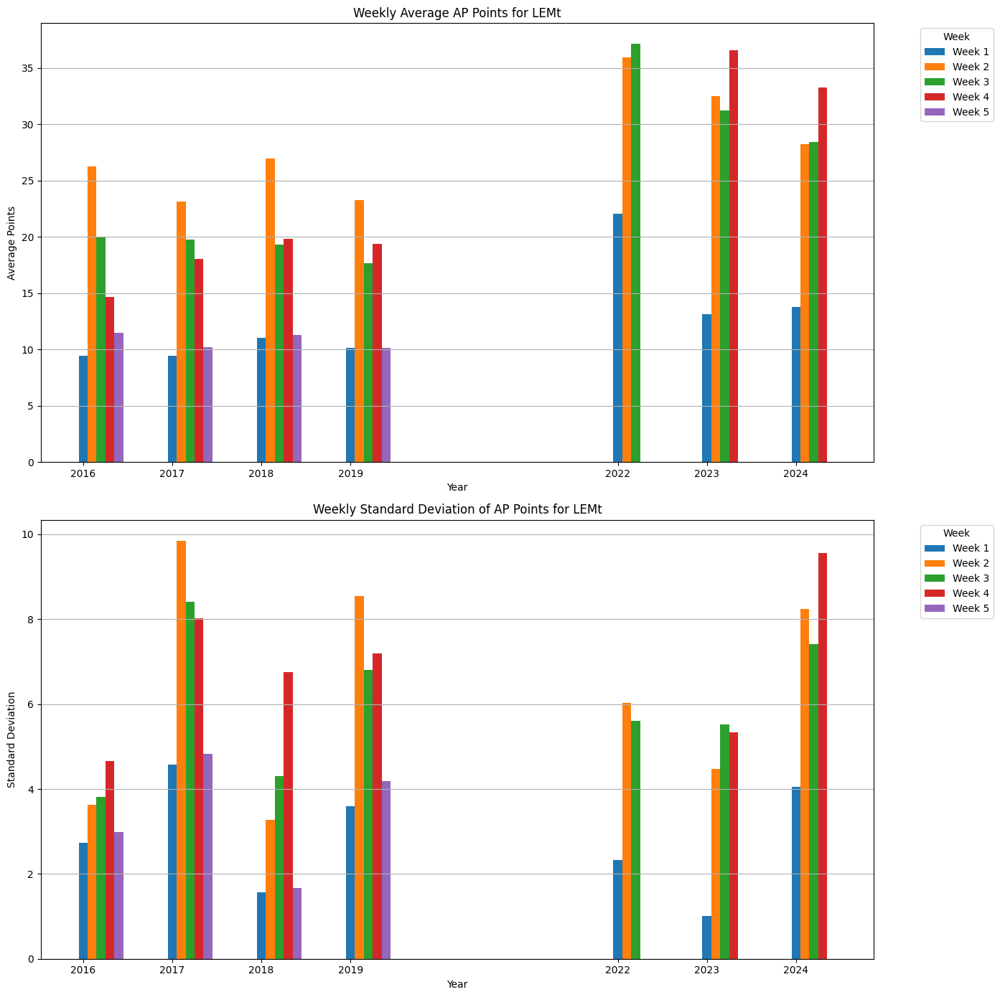

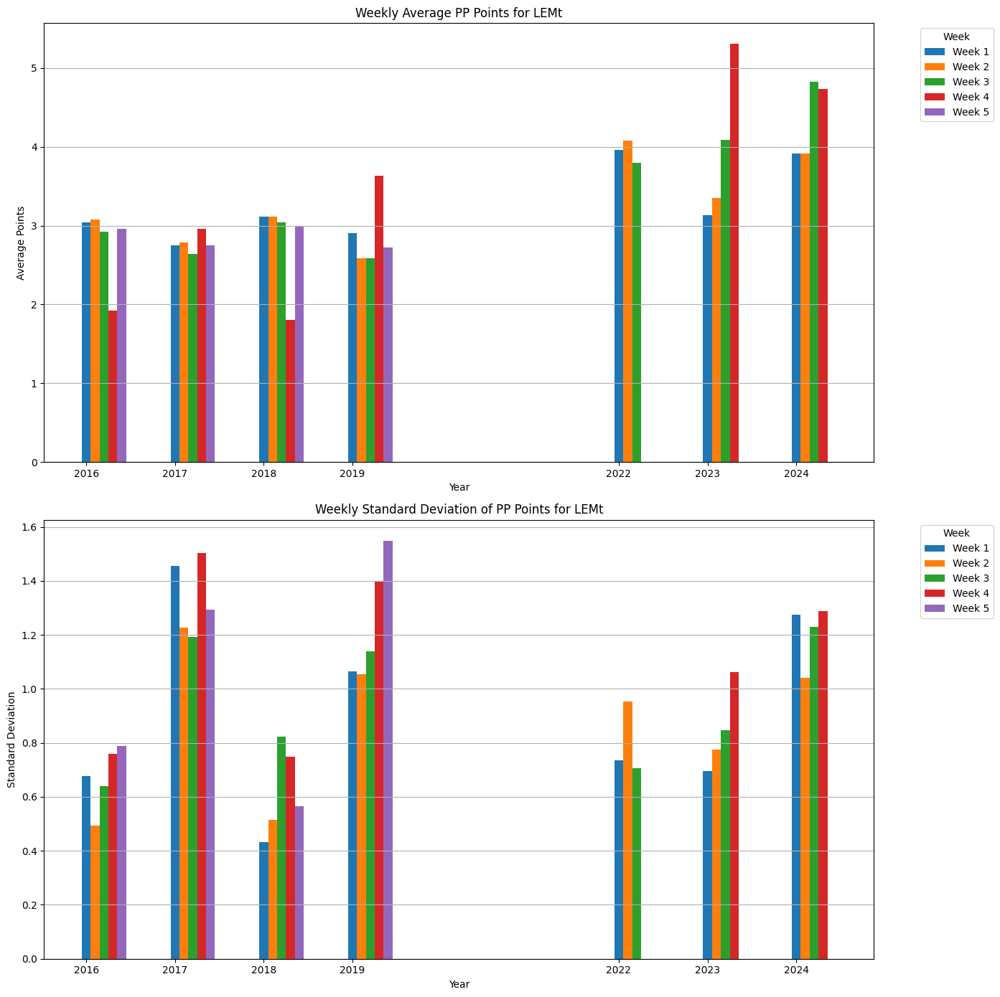

In [ ]:
# Plot Weekly Evolution
plot_weekly_evolution(datasets)

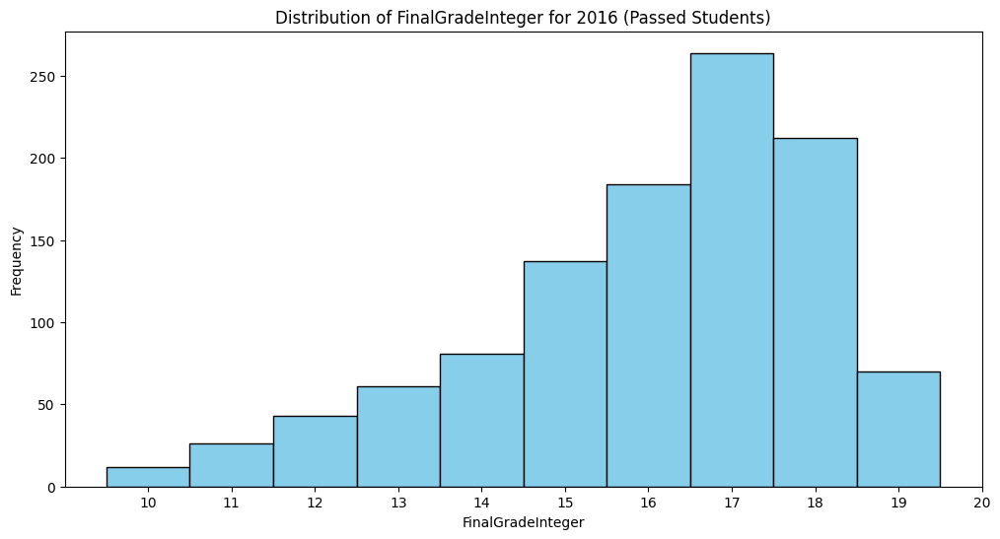

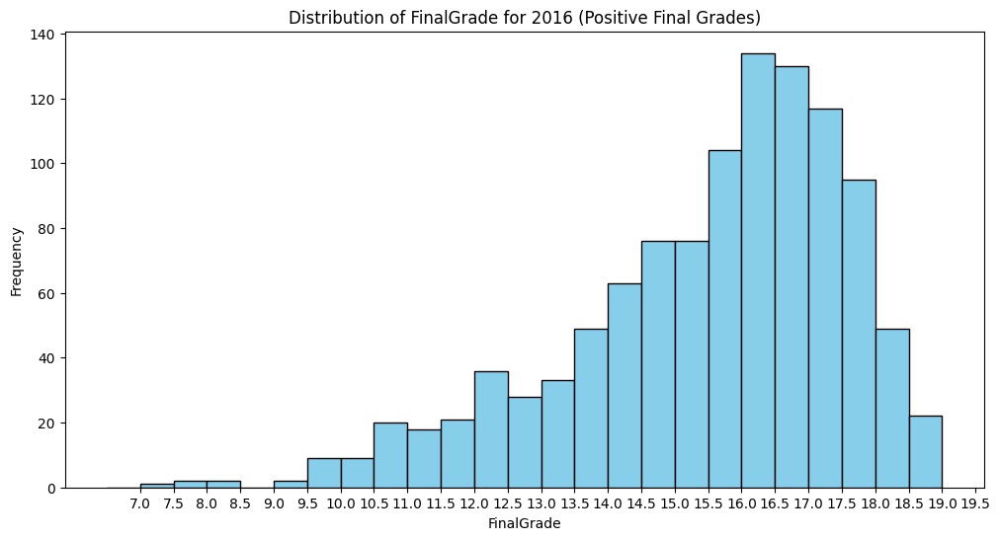

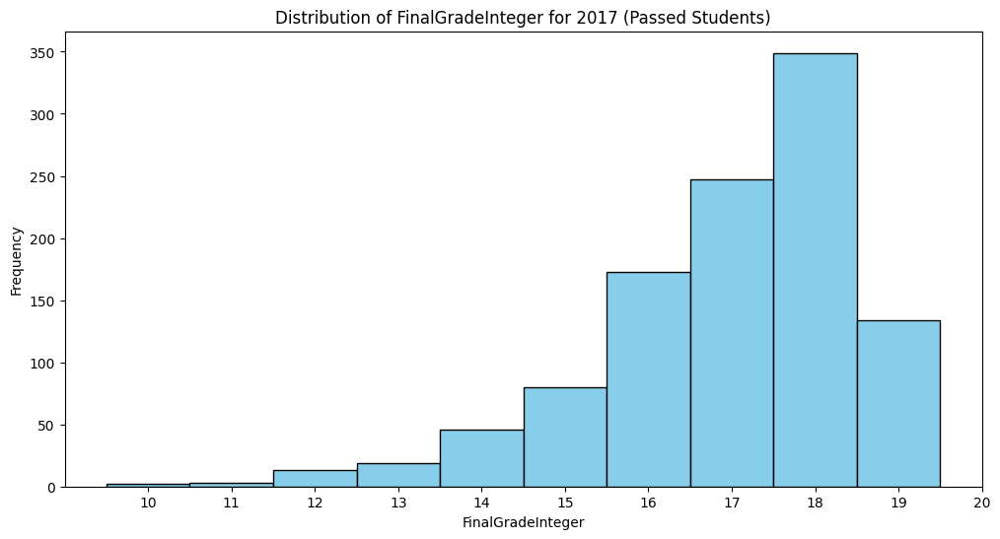

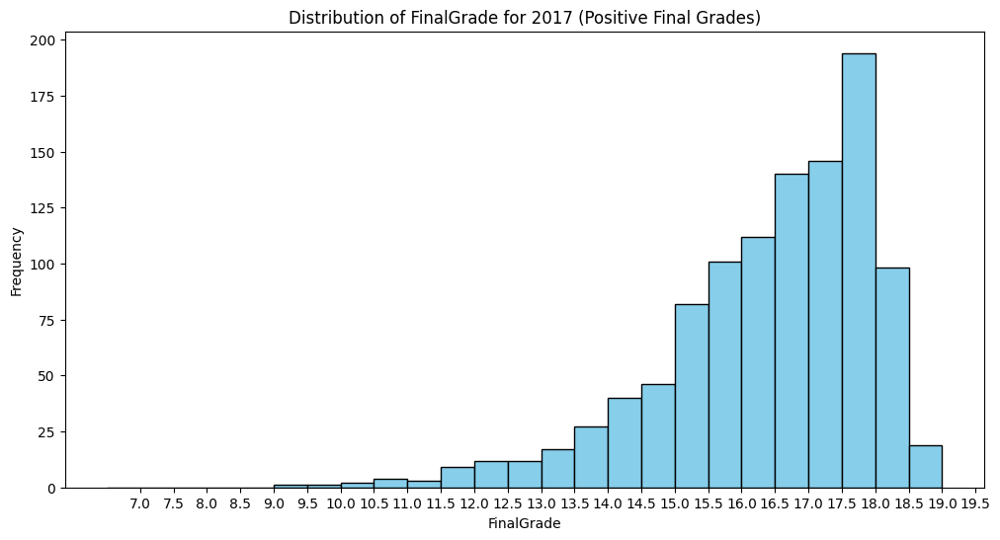

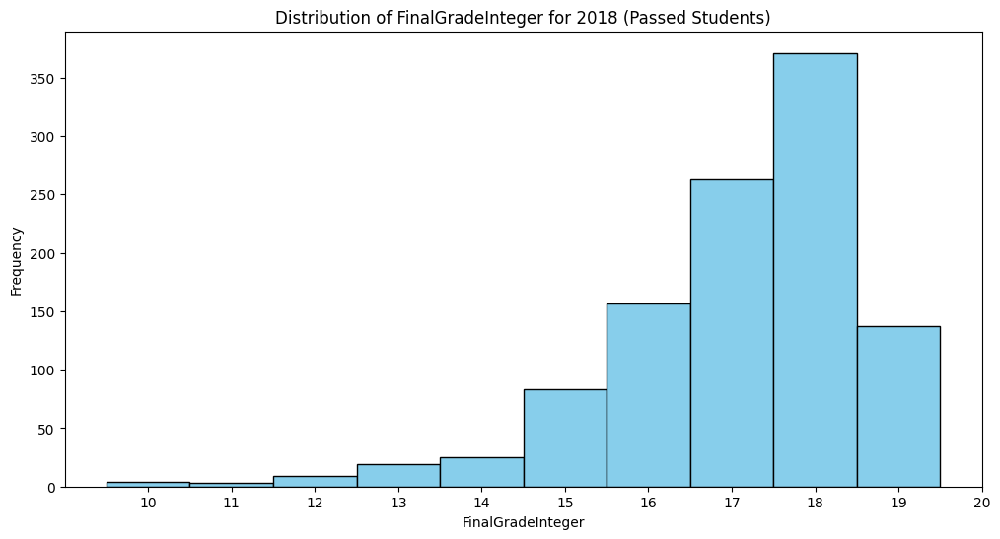

...

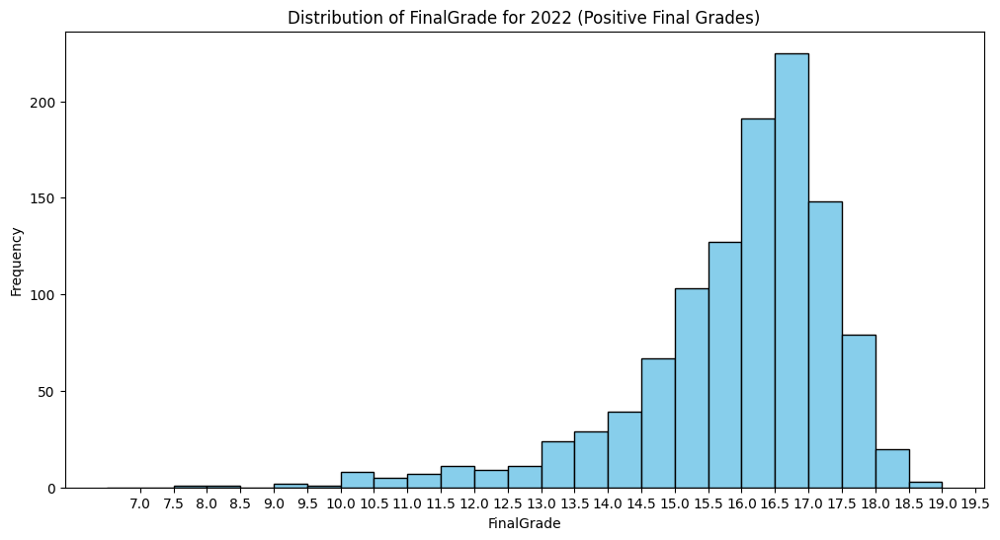

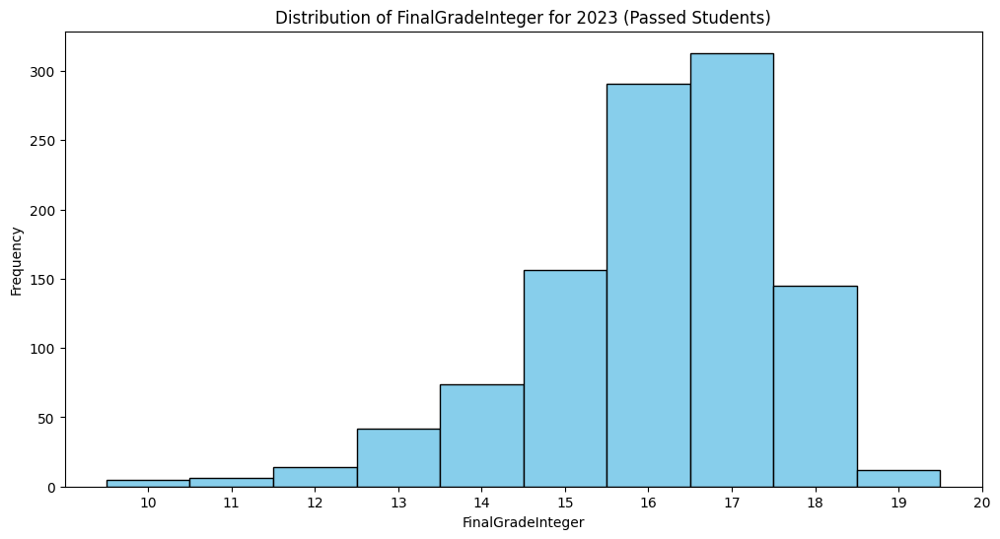

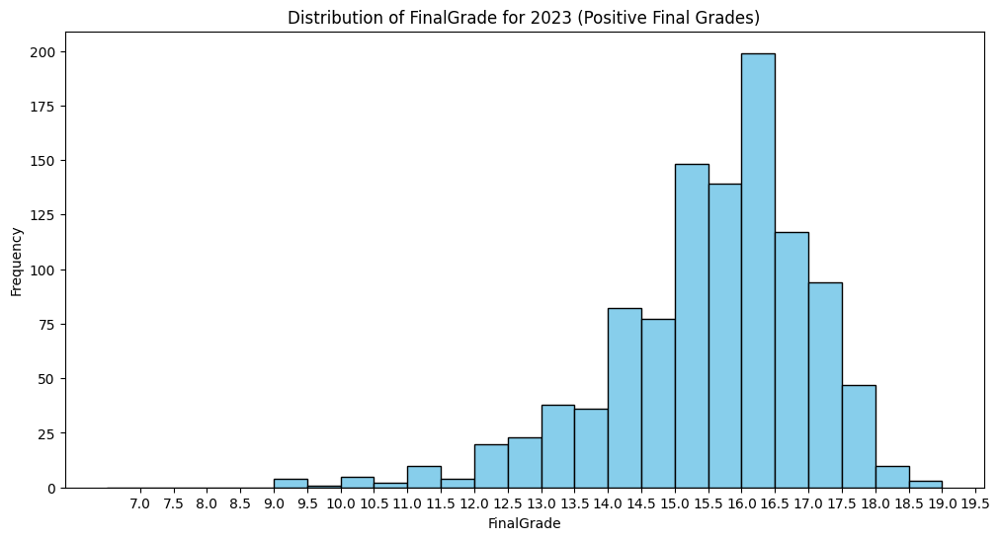

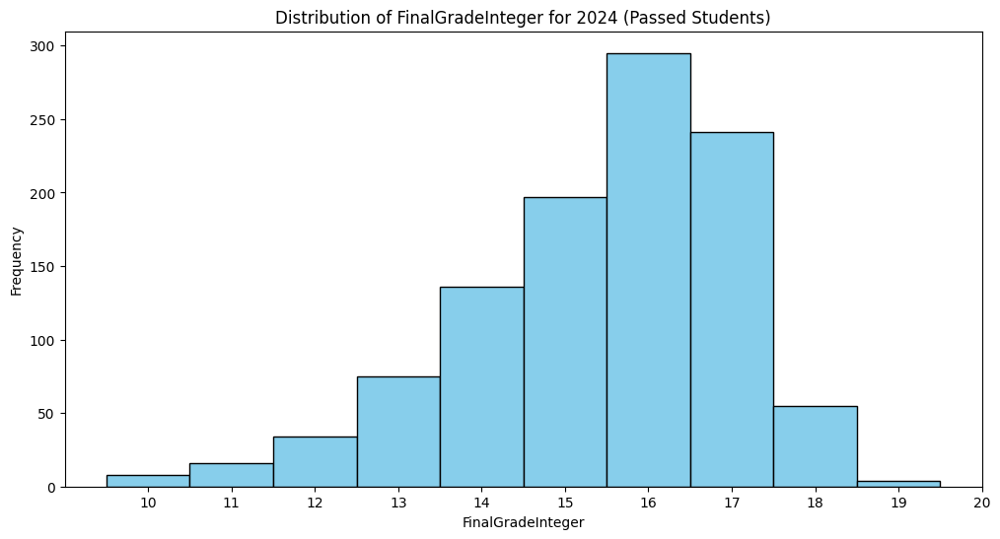

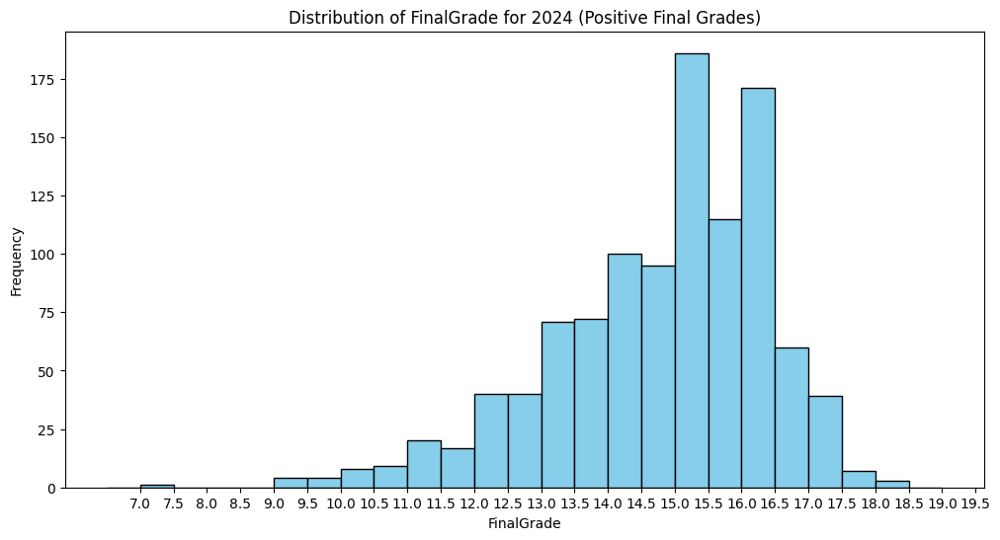

In [ ]:
# Plot Final Grade Attributes
plot_final_grade_attributes(datasets)

In [ ]:
# Plot Activity Types
for activity_type in ['EvTypeA', 'EvTypeB', 'EvTypeC']:
    plot_activity_types(datasets, activity_type, all_lists)

# Conclusion

In this report, we explored several aspects of student performance in the CTCT course across different years. The analyses provided insights into the impact of gender on course selection, the interrelationships between various assessment points, and the performance variation across different dimensions. Additionally, clustering and regression analyses helped identify distinct patterns and predictive relationships in the data.


In [ ]:
# Save to Word document
save_document(doc, 'Data_Analysis_Report.docx')

In [ ]:
directory_to_zip = 'Charts'
output_zip_file = 'Charts_Data_Analysis_Report.zip'

# Create the zip file
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', directory_to_zip)

# Download the zip file
files.download(output_zip_file)